# On Neural Boltzmann Equation
To introduce one of the papers that received the Best Paper Award in NeurIPS 2018, named *Neural Ordinary Differential Equations*, and explain how it can be related with kinetic theory.

## Relations between differential equations and machine learning?

Basically there are several ways to define a nonlinear transform: 
1. direct modeling: directly writing down the nonlinear function only works if you know the exact functional form that relates the input to the output, e.g. $y=\exp(\tanh(x))$.
2. DE: model the evolutions of correlated variables, quoting *a differential equation is a way to specify an arbitrary nonlinear transform by mathematically encoding prior structural assumptions*.
3. ML: $y=ML(x)$, like trivializers said it is just a nonlinear transformation.

The reason ML is interesting is because its form is basic but adapts to the data itself. For example, a simple neural network (in design matrix form) with sigmoid activation functions is simply matrix multiplications followed by application of sigmoid functions. Specifically,
$$
ML(x)=\sigma(W_{3}\cdot\sigma(W_{2}\cdot\sigma(W_{1}\cdot x)))
$$
with $W=(W_1,W_2,W_3)$ being learnable parameters. You then choose $W$ such that $ML(x)=y$ reasonably fits the function you wanted it to fit. The theory and practice of machine learning confirms that this is a good way to learn nonlinearities. It is known that the *Universal Approximation Theorem* states, for enough layers or enough parameters (i.e. sufficiently large $W$ matrices), $ML(x)$ can approximate any nonlinear function sufficiently close (subject to common constraints).

## From sequences of transformations to neural differential equations

The neural ordinary differential equation is one of many ways to put differential equation and machine learning together. The simplest way of explaining it is that, instead of learning the nonlinear transformation directly, we wish to learn the structures of the nonlinear transformation. Thus instead of doing $y=ML(x)$, we put the machine learning model on the derivative, $y'(x) = ML(x)$, and then solve the ODE. 

But why we would like to do this?

Today, many neural network architectures such as residual networks and recurrent neural
network decoders (RNNs), contain repeating blocks of layers that have the ability to retain sequential information as well as change it in every step through a learned function. Such networks may in general be described by the equation
$$
\mathbf{h}_{t+1}=\mathbf{h}_{t}+f\left(\mathbf{h}_{t}, \theta_{t}\right)
$$
Hereby, $h_t$ is the “hidden” information at timestep $t$, and $f(h_t, \theta_t)$ is the learned function of the current hidden information and parameters $\theta_t$. It's natural to imagine this as gradually increasing the number of residual layers in a residual network. If we do this we will eventually arrive at an infinitesimal (differential) version of the above equation
$$
\frac{d \mathbf{h}(t)}{d t}=f(\mathbf{h}(t), t, \theta)
$$
By solving the above ODE, we arrive at the desired sequence of hidden states.
We will have to solve the equation during each evaluation, beginning with an initial state $h_0$, forming an initial value problem.

## What can the neural ODE be used for?

A possible application of neural ODE may be the function approximator of differential operator with strong nonlinearity.
One possible example goes to the classical Boltzmann equation
$$
\frac{D f}{Dt}=
\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}^{\prime}\right) f\left(\mathbf{u}_{1}^{\prime}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1}
$$
where the LHS is full derivatives of distribution function along particle trajectory, and the RHS is an integral.
We take this equation as an example to show the application of neural ODE, with Julialang implementation.

First, let's load all the packages that to be used in the computation.

In [2]:
using Revise, DifferentialEquations, Flux, DiffEqFlux, Optim, Plots, Kinetic

Generate variables from configuration file.

In [3]:
config = "../code/homogeneous/config.txt"
D = read_dict(config)
for key in keys(D)
    s = Symbol(key)
    @eval $s = $(D[key])
end

case = homogeneous
maxTime = 5
tlen = 11
u0 = -5
u1 = 5
nu = 60
nug = 0
v0 = -5
v1 = 5
nv = 28
nvg = 0
w0 = -5
w1 = 5
nw = 28
nwg = 0
vMeshType = rectangle
nm = 5
knudsen = 1
inK = 0
alpha = 1.0
omega = 0.5
nh = 8



Calculate initial values and parameters needed for evaluating collision operator.

In [4]:
tspan = (0.0, maxTime)
tRange = range(tspan[1], tspan[2], length=tlen)

γ = heat_capacity_ratio(inK, 3)
vSpace = VSpace3D(u0, u1, nu, v0, v1, nv, w0, w1, nw, vMeshType)

f0 = Float32.(0.5 * (1/π)^1.5 .* (exp.(-(vSpace.u .- 0.99).^2) .+ exp.(-(vSpace.u .+ 0.99).^2)) .* 
     exp.(-vSpace.v.^2) .* exp.(-vSpace.w.^2)) |> Array
prim0 = conserve_prim(moments_conserve(f0, vSpace.u, vSpace.v, vSpace.w, vSpace.weights), γ)
M0 = Float32.(maxwellian(vSpace.u, vSpace.v, vSpace.w, prim0)) |> Array

mu_ref = ref_vhs_vis(knudsen, alpha, omega)
kn_bzm = hs_boltz_kn(mu_ref, 1.0)
τ = mu_ref * 2. * prim0[end]^(0.5) / prim0[1];

## Fast spectral method for Boltzmann collision operator

In ancient times, some might thought the Boltzmann equation is unsolvable.

With the progress of computing capabilities, there are methods now to calculate nonlinear Boltzmann collision integral.
In 1989, Goldstein, etc. al employed a fixed Eulerian mesh to evaluate discrete collisional dynamics. 
This method is very intuitive, but since particle velocities pre/post collisions need to fall on the grid points, it has a huge requirement on computational resources.
Bobylev etc. proved that the method of computing resources consumption is about $O(N^7)$, where $N$ is the number of discrete velocity grids used in each direction, and this method possesses only half order convergence, similar to that of DSMC method.


Another thought goes to the fast Fourier transformation (FFT) to solve the collision operator in the spectral space.
In 1988,Bobylev made a preliminary attempt to calculate the Boltzmann equation of Maxwell molecules in a homogeneous flow field.
Later, Paraschi and Perthame extended this method to general collision kernel, with a compuational cost $O(N^6)$.
In 2006, Mouhot and Paraschi developed a fast spectral method based on Carleman-type Boltzmann equation, which holds the spectral accuracy and computational cost $O(M^2N^3logN)$.
It's one of the most efficient Boltzmann collision solver by now. 


We briefly introduce it on the basis of Carleman-type Boltzmann equation,
$$
\begin{aligned}
Q(f) &=\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}^{\prime}\right) f\left(\mathbf{u}_{1}^{\prime}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1} \\
&=\int_{\mathscr{R}^{3}} \int_{\mathscr{S}^{2}} \Theta g\left[f\left(\mathbf{u}+\frac{g \Omega-\mathbf{g}}{2}\right) f\left(\mathbf{u}_{1}-\frac{g \Omega-\mathbf{g}}{2}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \Omega d \mathbf{u}_{1} \\
&=2 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta\left(2 \mathbf{y} \cdot \mathbf{g}+\mathbf{y}^{2}\right)\left[f\left(\mathbf{u}+\frac{\mathbf{y}}{2}\right) f\left(\mathbf{u}_{1}-\frac{\mathbf{y}}{2}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \mathbf{y} d \mathbf{u}_{1} \\
&=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta\left(\mathbf{y} \cdot \mathbf{g}+\mathbf{y}^{2}\right)\left[f(\mathbf{u}+\mathbf{y}) f\left(\mathbf{u}_{1}-\mathbf{y}\right)-f(\mathbf{u}) f\left(\mathbf{u}_{1}\right)\right] d \mathbf{y} d \mathbf{u}_{1} \\
&=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \Theta \delta(\mathbf{y} \cdot \mathbf{z})[f(\mathbf{u}+\mathbf{y}) f(\mathbf{u}+\mathbf{z})-f(\mathbf{u}) f(\mathbf{u}+\mathbf{y}+\mathbf{z})] d \mathbf{y} d \mathbf{z}
\end{aligned}
$$
with $\Theta=\mathscr{B} / g, \mathbf{y}=(g \Omega-\mathbf{g}) / 2, \mathbf{z}=\mathbf{u}_{1}-\mathbf{u}-\mathbf{y}=-\mathbf{g}-\mathbf{y}$.
In the Boltzmann equation, the collision kernel is $\mathscr{B}(\cos \theta, g)=\Theta g$, and $\Theta$ is the differential cross section.
A generalized collision kernel can be defined as
$$
\mathscr{B}=C_{\alpha, \gamma}^{\prime \prime} \sin ^{\alpha+\gamma-1}\left(\frac{\theta}{2}\right) \cos ^{-\gamma}\left(\frac{\theta}{2}\right) g^{\alpha}
$$
with
$$
C_{\alpha, \gamma}^{\prime \prime}=\frac{\Gamma[(7+\alpha) / 2]}{6 \Gamma[(3+\alpha+\gamma) / 2] \Gamma(2-\gamma / 2)} C_{\alpha}
$$
where $C_\alpha$ is a parameter.


In the fast spectral method, we can periodize the particle distribution function in $D_L=[-L,L]^3$, and expand it into Fourier series
$$
\begin{array}{l}
f(\mathbf{u})=\sum_{k=-N / 2}^{N / 2-1} \hat{f}_{k} \exp \left(i \xi_{k} \cdot \mathbf{u}\right) \\
\hat{f}_{k}=\frac{1}{(2 L)^{3}} \int_{D_{L}} f(\mathbf{u}) \exp \left(-i \xi_{k} \cdot \mathbf{u}\right) d \mathbf{u}
\end{array}
$$
with$x_k = k\pi/L$ being frequency component.
The collision operator can also be expanded as
$$
\hat{Q}_{j}=\sum_{l, m=-N_{k} / 2,(l+m=j)}^{N_{k} / 2-1} \hat{f}_{l} \hat{f}_{m}[\beta(l, m)-\beta(m, m)]
$$
with the kernel mode being
$$
\begin{array}{l}
\beta(l, m)=4 \int_{\mathscr{R}^{3}} \int_{\mathscr{R}^{3}} \delta(\mathbf{y} \cdot \mathbf{z}) \Theta \exp \left(i \xi_{l} \cdot \mathbf{y}+i \xi_{m} \cdot \mathbf{z}\right) d \mathbf{y} d \mathbf{z} \\
=\iint \delta\left(\mathbf{e} \cdot \mathbf{e}^{\prime}\right) \Theta\left[\int_{-R}^{R} \rho \exp \left(i \rho \xi_{l} \cdot \mathbf{e}\right) d \rho\right]\left[\int_{-R}^{R} \rho^{\prime} \exp \left(i \rho^{\prime} \xi_{m} \cdot \mathbf{e}^{\prime}\right) d \rho^{\prime}\right] d \mathbf{e} d \mathbf{e}^{\prime} \\
=4 \int\left[\int_{0}^{R} \rho \cos \left(\rho \xi_{l} \cdot \mathbf{e}\right) d \rho\right]\left[\int \delta\left(\mathbf{e} \cdot \mathbf{e}^{\prime}\right) \int_{0}^{R} \rho^{\prime} \Theta \cos \left(\rho^{\prime} \xi_{m} \cdot \mathbf{e}^{\prime}\right) d \rho^{\prime} d \mathbf{e}^{\prime}\right] d \mathbf{e}
\end{array}
$$
The separation of mode $l$ and $m$ can be achieved by numerical quadrature.
Hence, the Boltzmann integral can be evaluated by calcuating convolutions with FFT.

**You may also notice the drawbacks of fast spectral method:**
1. NOT intuitive
2. requires high dimensionality of phase space



In [5]:
phi, psi, phipsi = kernel_mode( nm, vSpace.u1, vSpace.v1, vSpace.w1, vSpace.du[1,1,1], vSpace.dv[1,1,1], vSpace.dw[1,1,1],
                                vSpace.nu, vSpace.nv, vSpace.nw, alpha );

Solve the Boltzmann operator with fast spectral method

In [6]:
function boltzmann!(df, f::Array{<:Real,3}, p, t)
    Kn, M, phi, psi, phipsi = p
    df .= boltzmann_fft(f, Kn, M, phi, psi, phipsi)
end

function bgk!(df, f::Array{<:Real,3}, p, t)
    g, tau = p
    df .= (g .- f) ./ tau
end

bgk! (generic function with 1 method)

In [7]:
#--- Boltzmann ---#
prob = ODEProblem(boltzmann!, f0, tspan, [kn_bzm, nm, phi, psi, phipsi])
data_boltz = solve(prob, Tsit5(), saveat=tRange) |> Array;

In [8]:
#--- BGK ---#
prob1 = ODEProblem(bgk!, f0, tspan, [M0, τ])
data_bgk = solve(prob, Tsit5(), saveat=tRange) |> Array;

Let's do a dimension reduction to present clean result in one velocity direction

In [9]:
data_boltz_1D = zeros(Float32, axes(data_boltz, 1), axes(data_boltz, 4))
data_bgk_1D = zeros(Float32, axes(data_bgk, 1), axes(data_bgk, 4))
for j in axes(data_boltz_1D, 2), i in axes(data_boltz_1D, 1)
    data_boltz_1D[i,j] = sum(@. vSpace.weights[i,:,:] * data_boltz[i,:,:,j])
    data_bgk_1D[i,j] = sum(@. vSpace.weights[i,:,:] * data_bgk[i,:,:,j])
end

f0_1D = zeros(Float32, axes(f0, 1))
for i in axes(data_boltz_1D, 1)
    f0_1D[i] = sum(@. vSpace.weights[i,:,:] * f0[i,:,:])
end

M0_1D = zeros(Float32, axes(M0, 1))
for i in axes(M0, 1)
    M0_1D[i] = sum(@. vSpace.weights[i,:,:] * M0[i,:,:])
end

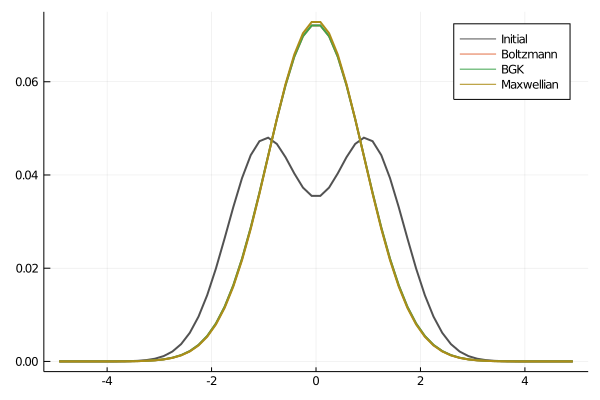

In [10]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,1], lw=2, label="Initial", color=:gray32)
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,end], lw=2, label="Boltzmann")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_bgk_1D[:,end], lw=2, label="BGK")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], M0_1D[:], lw=2, label="Maxwellian", color=5)

Then, let's construct our neural ODE.

In [11]:
#--- neural ode ---#
dudt = FastChain( (x, p) -> x.^2, # initial guess
                   FastDense(vSpace.nu, vSpace.nu*nh, tanh), # our 1-layer network
                   FastDense(vSpace.nu*nh, vSpace.nu) )
n_ode = NeuralODE(dudt, tspan, Tsit5(), saveat=tRange)

function loss_n_ode(p)
    pred = n_ode(f0_1D, p)
    loss = sum(abs2, pred .- data_boltz_1D)
    return loss, pred
end

cb = function (p, l, pred; doplot=true)
    display(l)
    # plot current prediction against dataset
    if doplot
        pl = plot(tRange, data_boltz_1D[vSpace.nu÷2,:], lw=2, label="Exact")
        scatter!(pl, tRange, pred[vSpace.nu÷2,:], lw=2, label="NN prediction")
        display(plot(pl))
    end
    return false
end

#5 (generic function with 1 method)

Do the training with ADAM optimizer

0.070253156f0

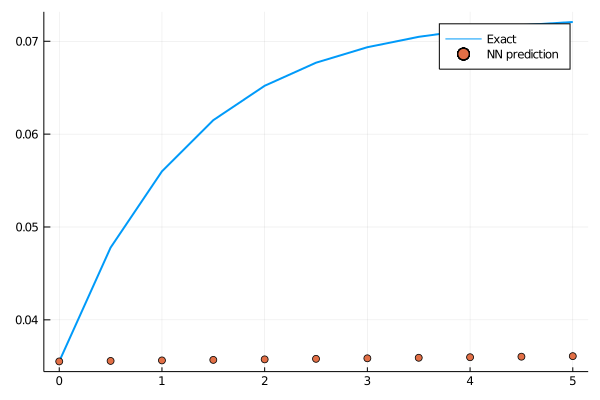

loss: 0.0703:   0%|▏                                        |  ETA: 0:00:38

0.02370827f0

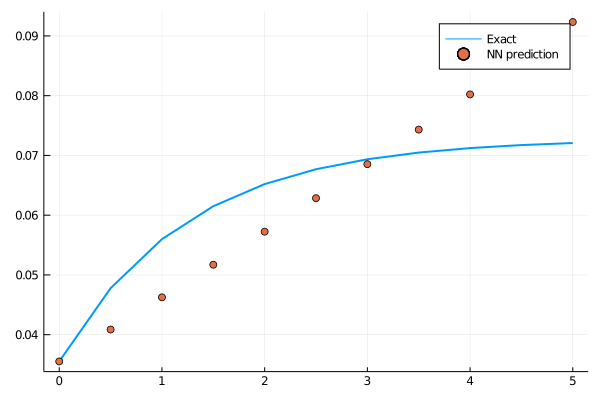

loss: 0.0237:   1%|▎                                        |  ETA: 0:03:39

0.035361666f0

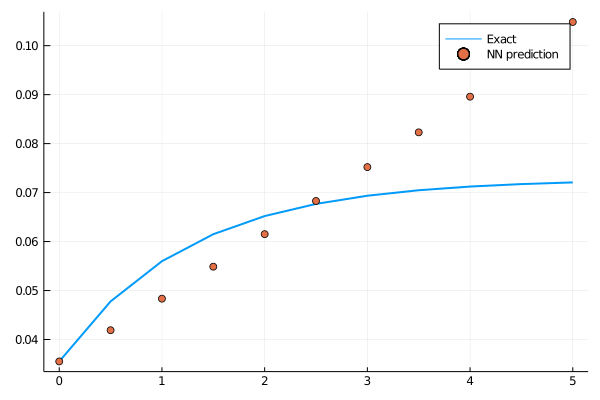

loss: 0.0354:   1%|▍                                        |  ETA: 0:02:29

0.0312579f0

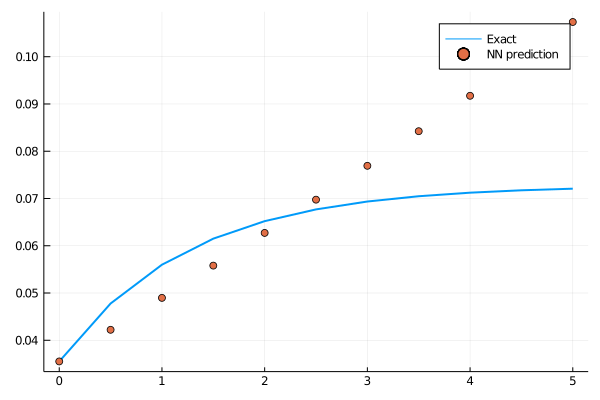

loss: 0.0313:   1%|▌                                        |  ETA: 0:02:06

0.01855089f0

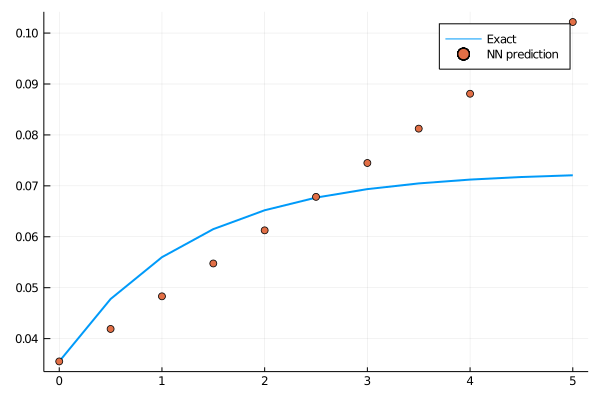

loss: 0.0186:   2%|▋                                        |  ETA: 0:01:52

0.012275101f0

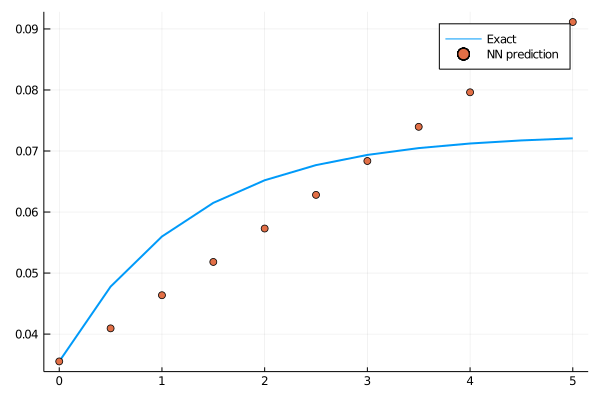

loss: 0.0123:   2%|▉                                        |  ETA: 0:01:39

0.012339084f0

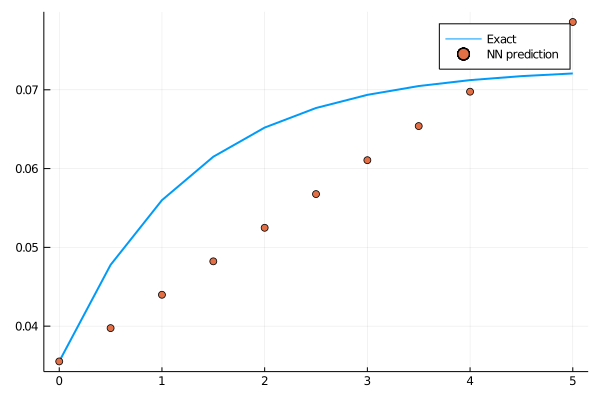

loss: 0.0123:   2%|█                                        |  ETA: 0:01:36

0.014845054f0

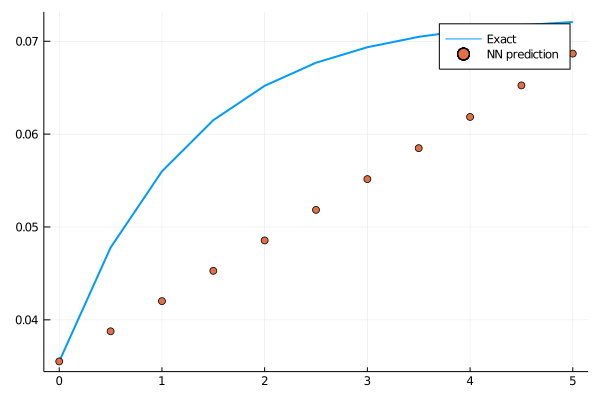

loss: 0.0148:   3%|█▏                                       |  ETA: 0:01:31

0.01660501f0

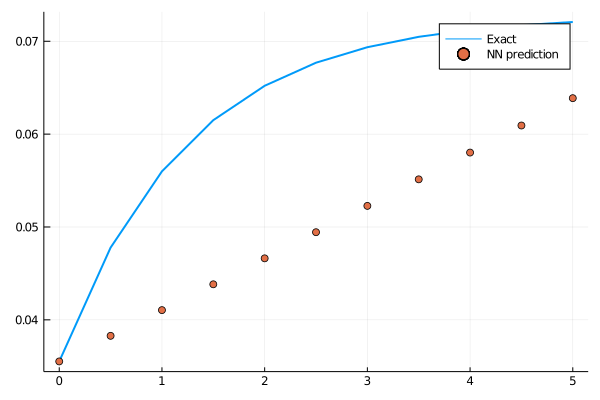

loss: 0.0166:   3%|█▎                                       |  ETA: 0:01:24

0.015897337f0

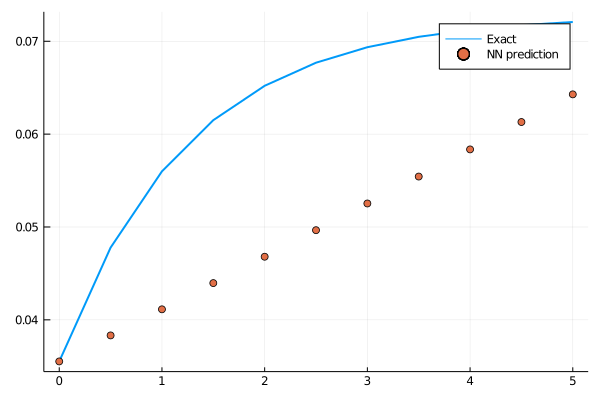

loss: 0.0159:   3%|█▍                                       |  ETA: 0:01:22

0.01264348f0

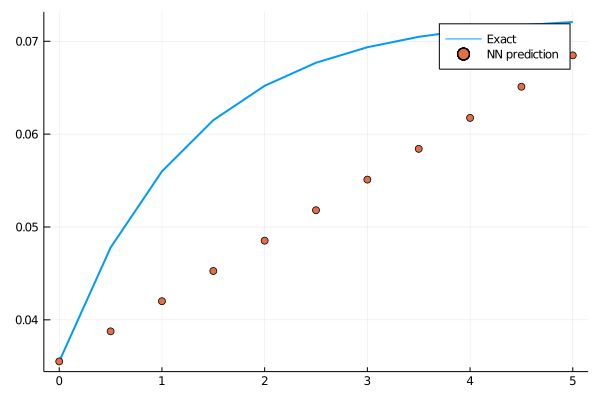

loss: 0.0126:   4%|█▌                                       |  ETA: 0:01:19

0.008622815f0

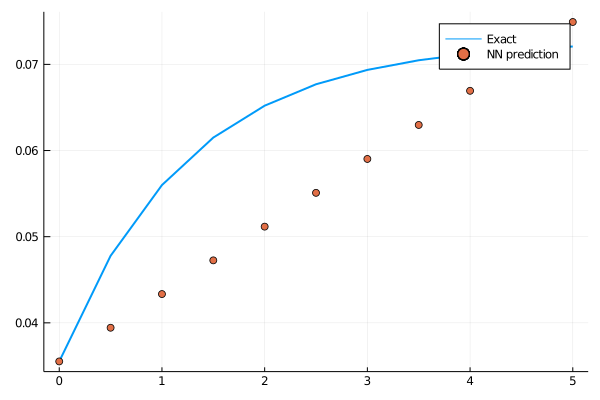

loss: 0.00862:   4%|█▋                                       |  ETA: 0:01:15

0.0062877457f0

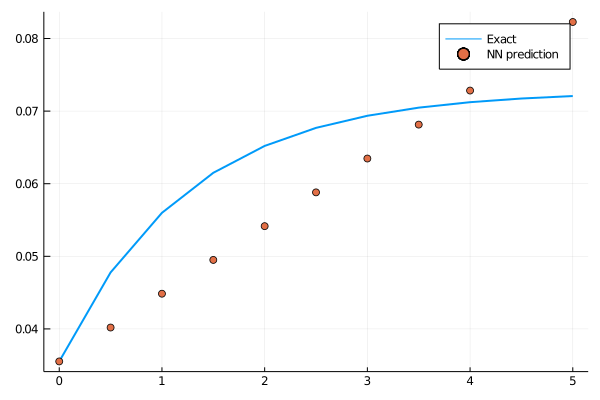

loss: 0.00629:   4%|█▊                                       |  ETA: 0:01:13

0.006815822f0

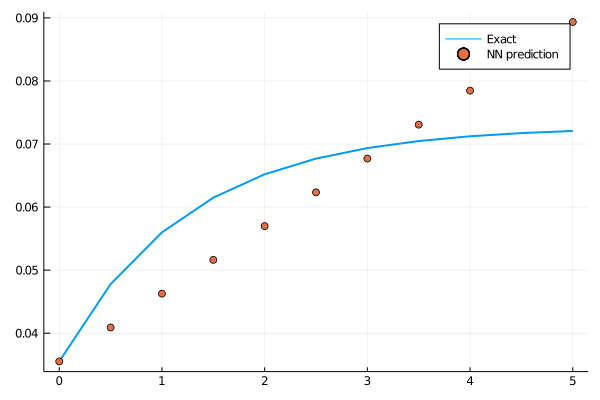

loss: 0.00682:   5%|█▉                                       |  ETA: 0:01:13

0.009100681f0

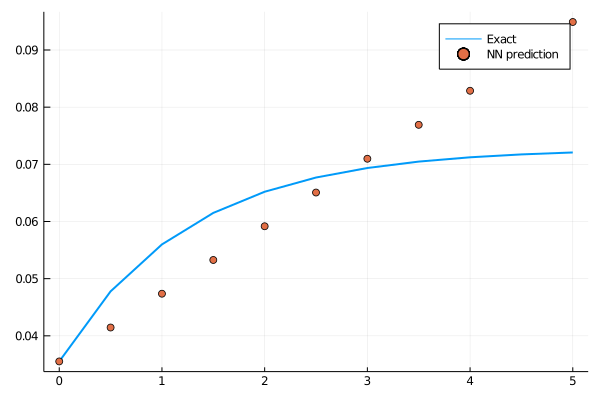

loss: 0.0091:   5%|██                                       |  ETA: 0:01:10

0.010644857f0

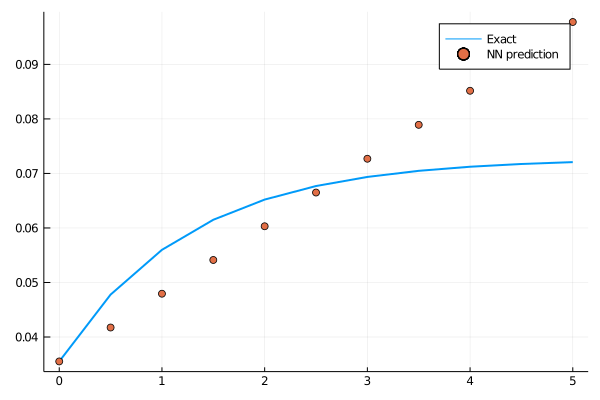

loss: 0.0106:   5%|██▏                                      |  ETA: 0:01:09

0.010007405f0

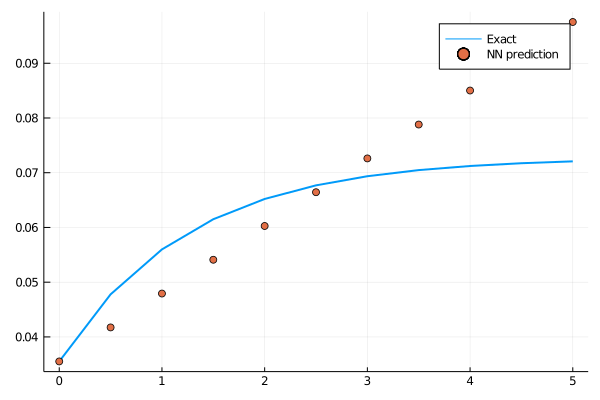

loss: 0.01:   6%|██▎                                      |  ETA: 0:01:08

0.007895062f0

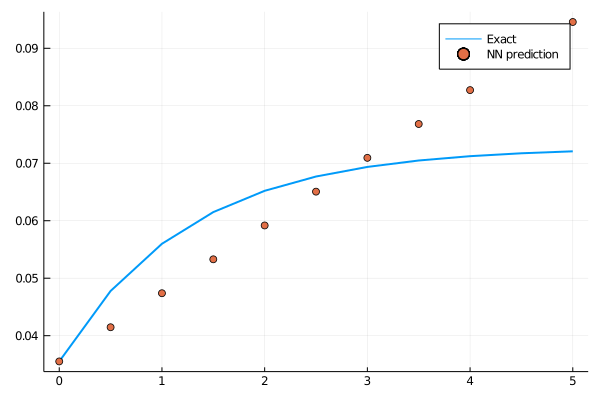

loss: 0.0079:   6%|██▌                                      |  ETA: 0:01:06

0.0059186127f0

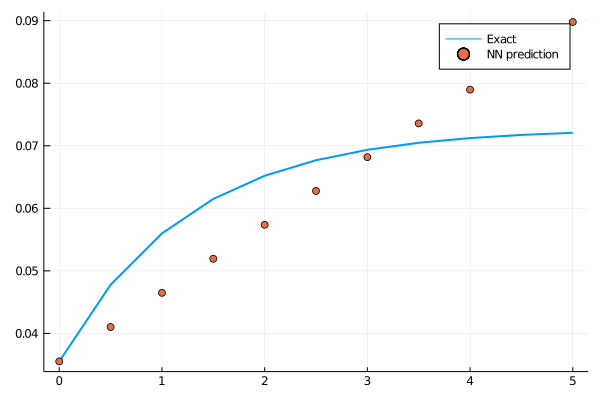

loss: 0.00592:   6%|██▋                                      |  ETA: 0:01:05

0.0051371884f0

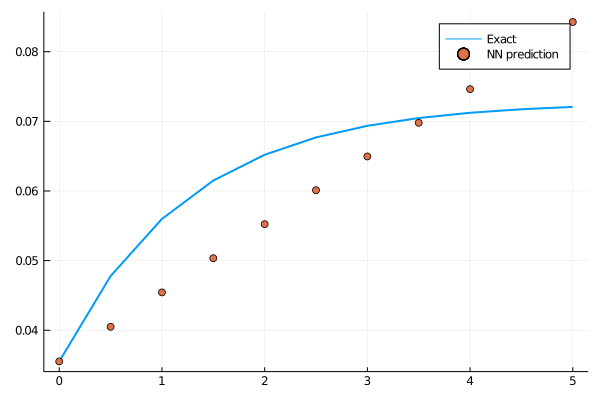

loss: 0.00514:   7%|██▊                                      |  ETA: 0:01:05

0.0055641946f0

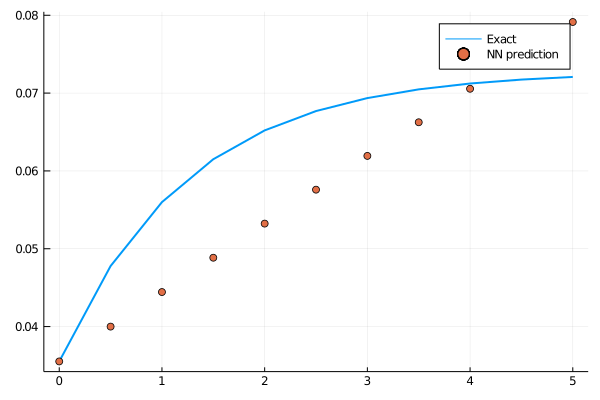

loss: 0.00556:   7%|██▉                                      |  ETA: 0:01:04

0.0064516156f0

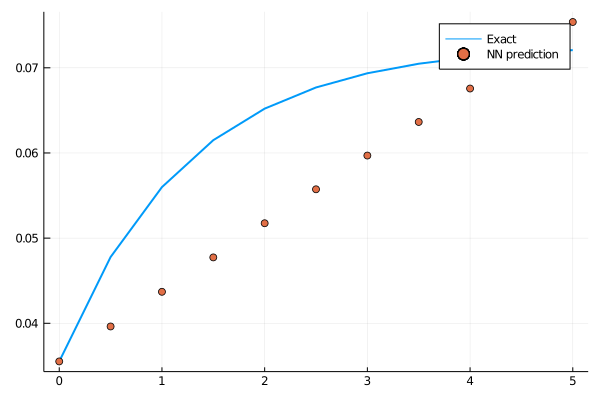

loss: 0.00645:   7%|███                                      |  ETA: 0:01:03

0.007006837f0

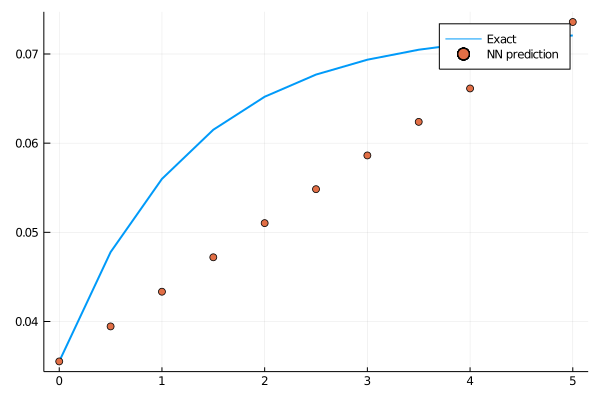

loss: 0.00701:   8%|███▏                                     |  ETA: 0:01:02

0.0069200406f0

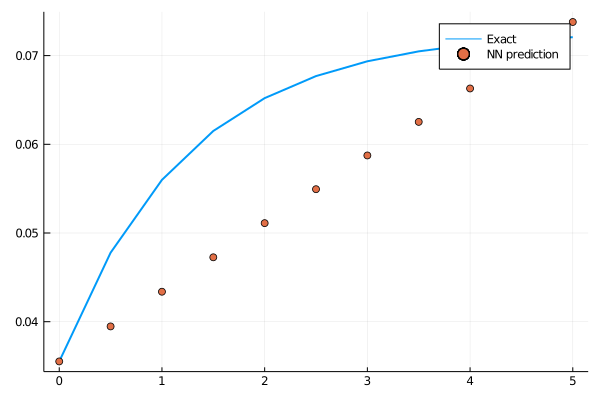

loss: 0.00692:   8%|███▎                                     |  ETA: 0:01:04

0.006344661f0

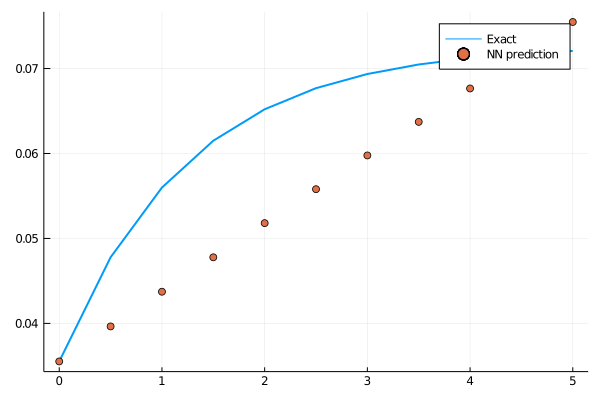

loss: 0.00634:   8%|███▍                                     |  ETA: 0:01:04

0.005639226f0

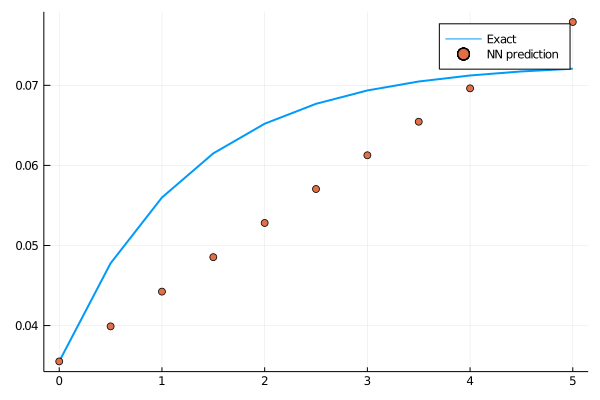

loss: 0.00564:   9%|███▌                                     |  ETA: 0:01:04

0.005121949f0

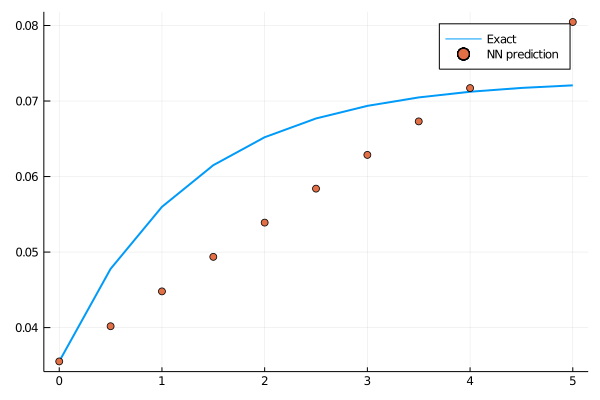

loss: 0.00512:   9%|███▊                                     |  ETA: 0:01:04

0.004885848f0

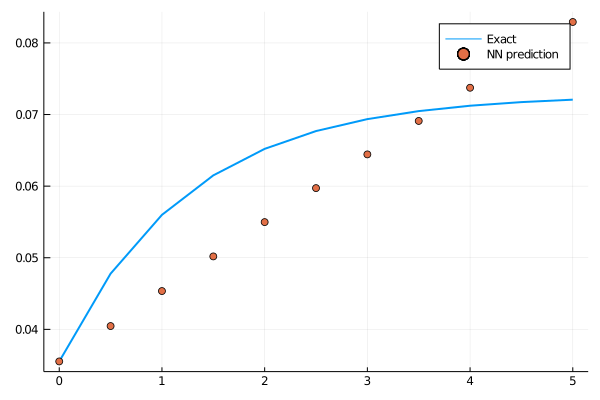

loss: 0.00489:   9%|███▉                                     |  ETA: 0:01:03

0.0048802113f0

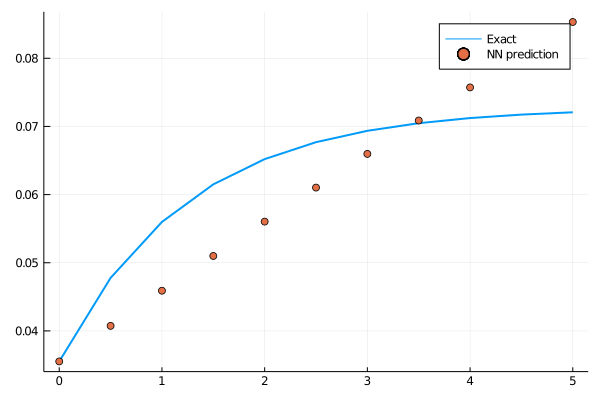

loss: 0.00488:  10%|███▉                                     |  ETA: 0:01:03

0.0050710565f0

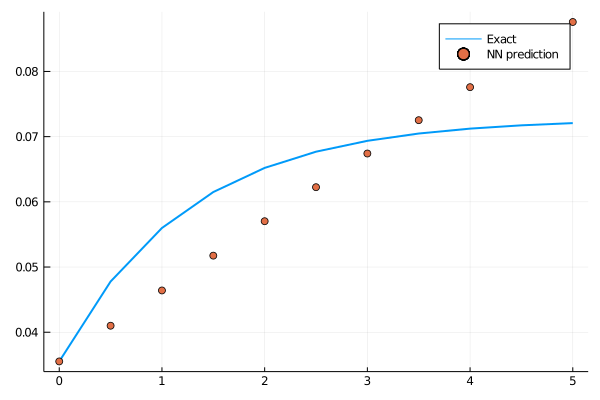

loss: 0.00507:  10%|████▏                                    |  ETA: 0:01:01

0.0053245667f0

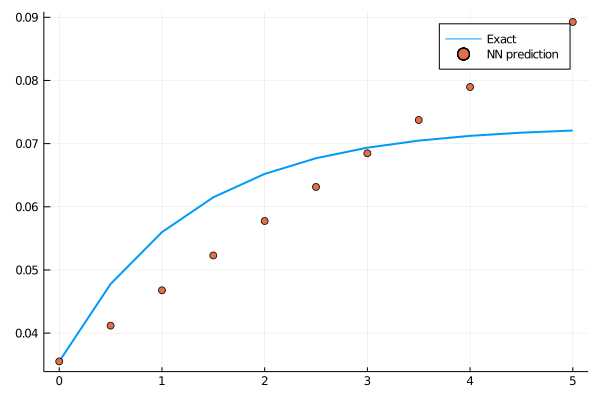

loss: 0.00532:  10%|████▎                                    |  ETA: 0:01:01

0.0053937216f0

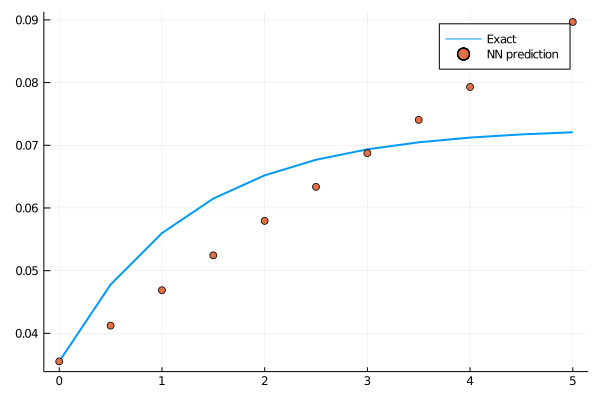

loss: 0.00539:  11%|████▍                                    |  ETA: 0:01:00

0.005178238f0

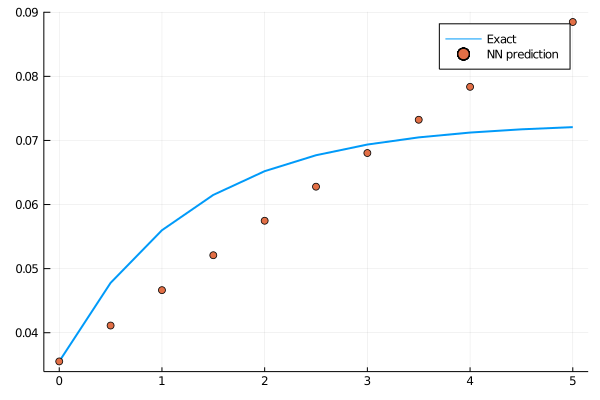

loss: 0.00518:  11%|████▌                                    |  ETA: 0:00:59

0.004807034f0

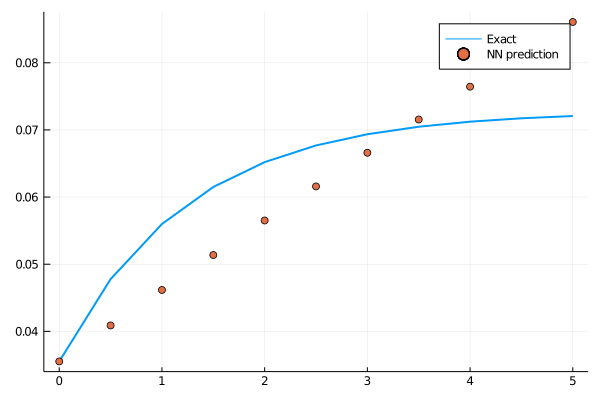

loss: 0.00481:  11%|████▋                                    |  ETA: 0:00:59

0.004483958f0

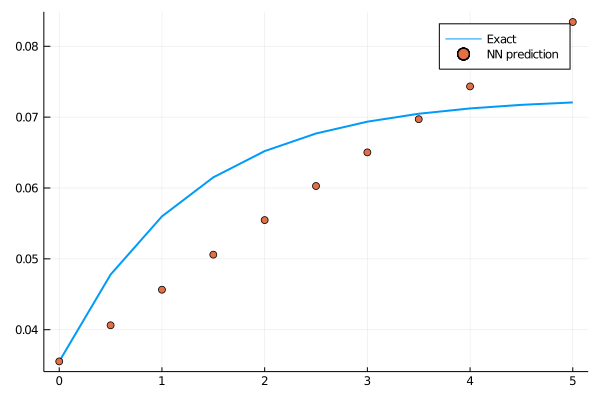

loss: 0.00448:  12%|████▊                                    |  ETA: 0:00:58

0.004344263f0

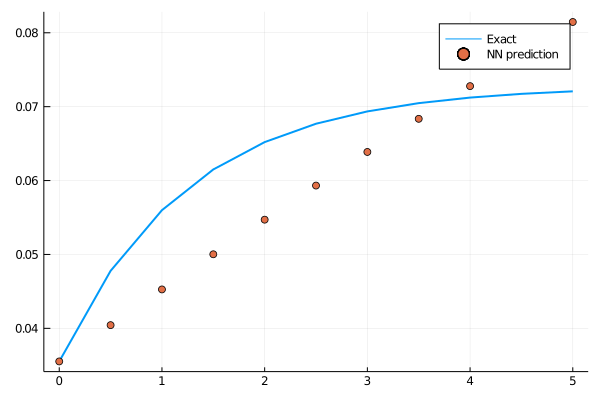

loss: 0.00434:  12%|████▉                                    |  ETA: 0:00:57

0.004410968f0

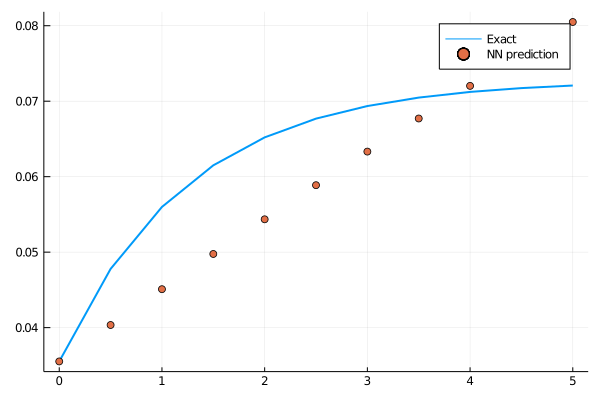

loss: 0.00441:  12%|█████                                    |  ETA: 0:00:56

0.004584407f0

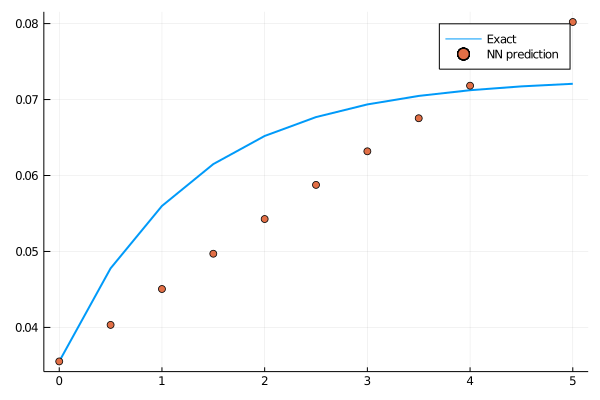

loss: 0.00458:  13%|█████▏                                   |  ETA: 0:00:56

0.00468387f0

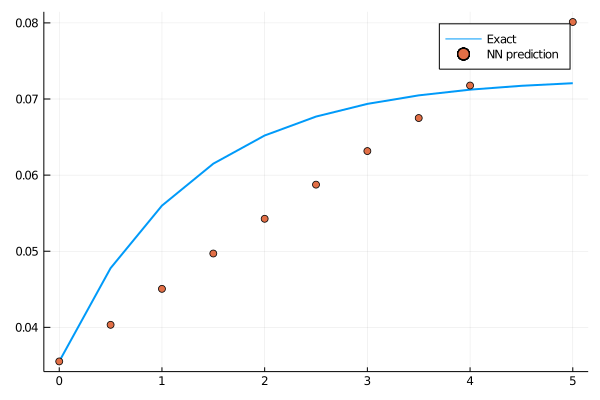

loss: 0.00468:  13%|█████▍                                   |  ETA: 0:00:55

0.0046067755f0

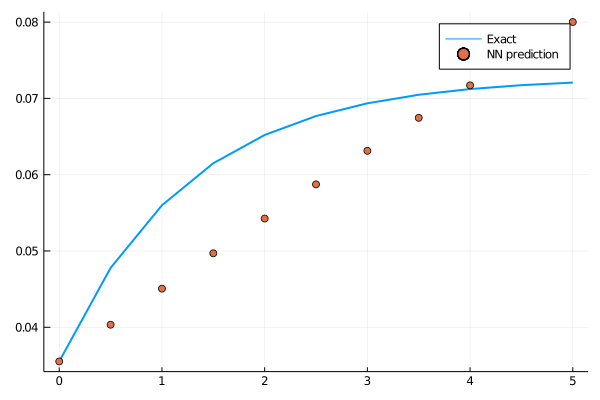

loss: 0.00461:  13%|█████▌                                   |  ETA: 0:00:55

0.004406797f0

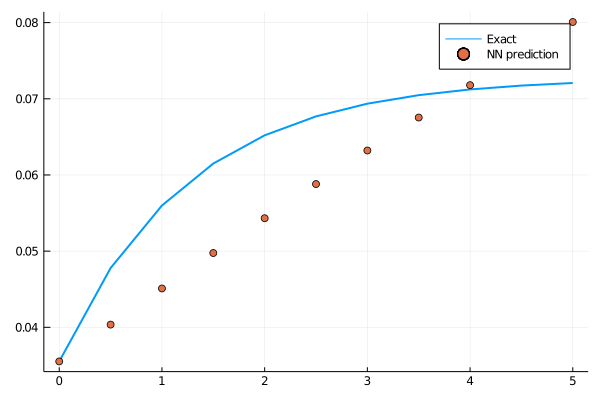

loss: 0.00441:  14%|█████▋                                   |  ETA: 0:00:56

0.0042116162f0

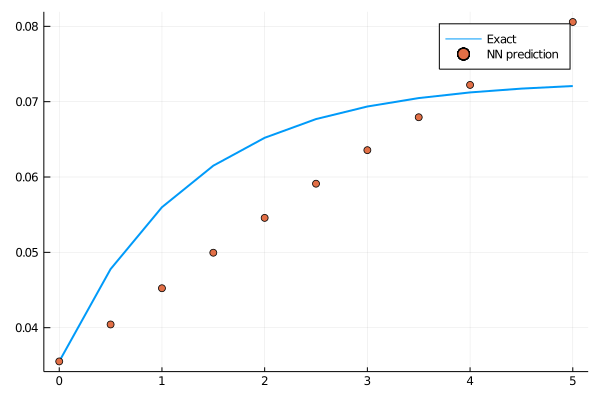

loss: 0.00421:  14%|█████▊                                   |  ETA: 0:00:55

0.004118946f0

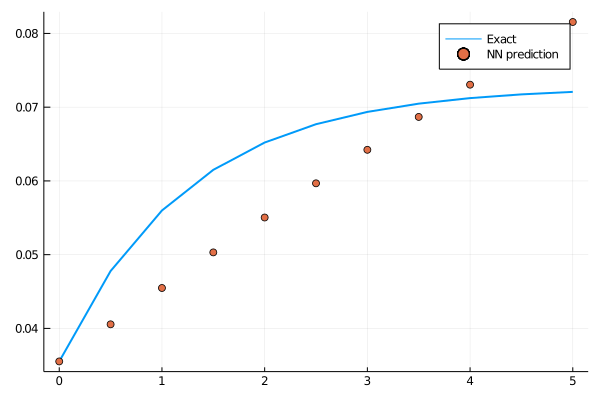

loss: 0.00412:  14%|█████▉                                   |  ETA: 0:00:55

0.004120268f0

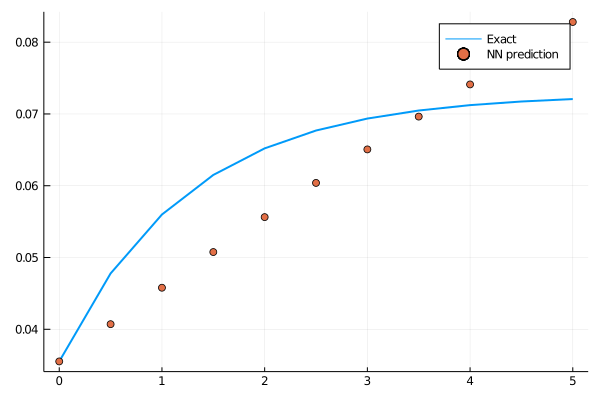

loss: 0.00412:  15%|██████                                   |  ETA: 0:00:56

0.004144549f0

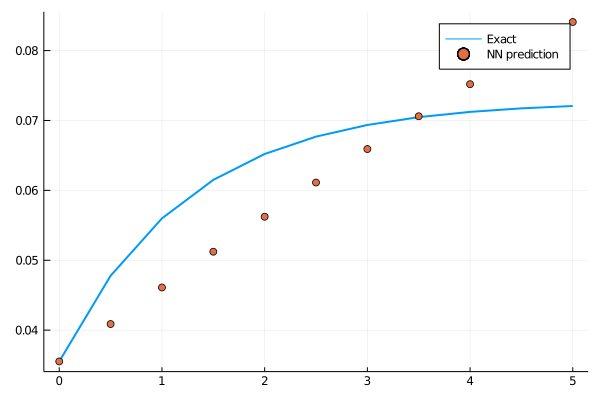

loss: 0.00414:  15%|██████▏                                  |  ETA: 0:00:55

0.004152274f0

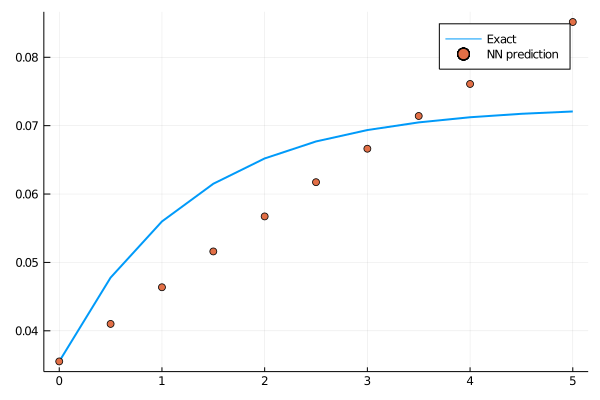

loss: 0.00415:  15%|██████▎                                  |  ETA: 0:00:55

0.004130159f0

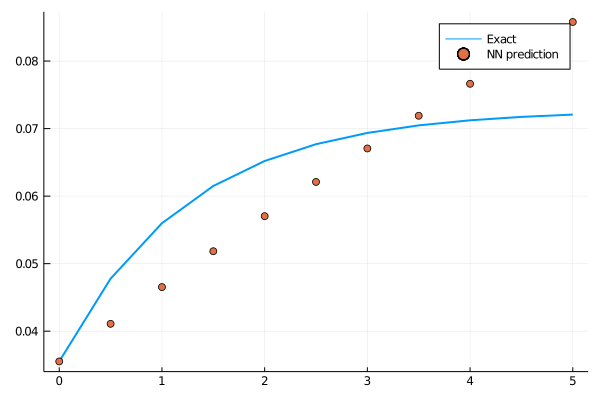

loss: 0.00413:  16%|██████▍                                  |  ETA: 0:00:54

0.004073778f0

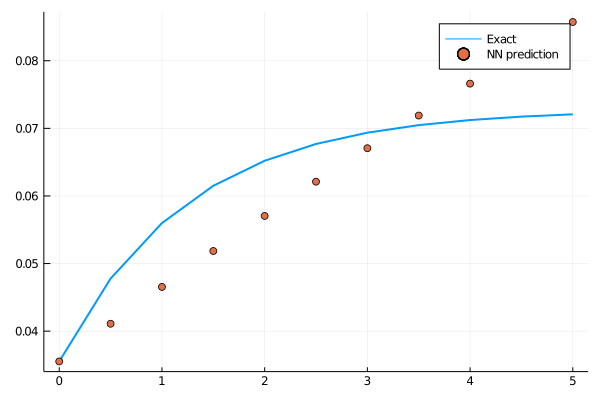

loss: 0.00407:  16%|██████▌                                  |  ETA: 0:00:54

0.0039882585f0

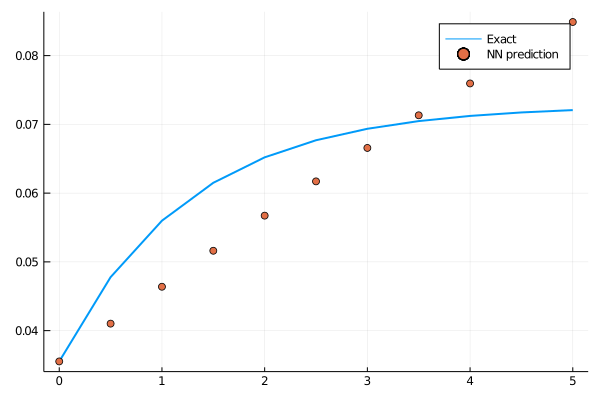

loss: 0.00399:  16%|██████▋                                  |  ETA: 0:00:54

0.0038955908f0

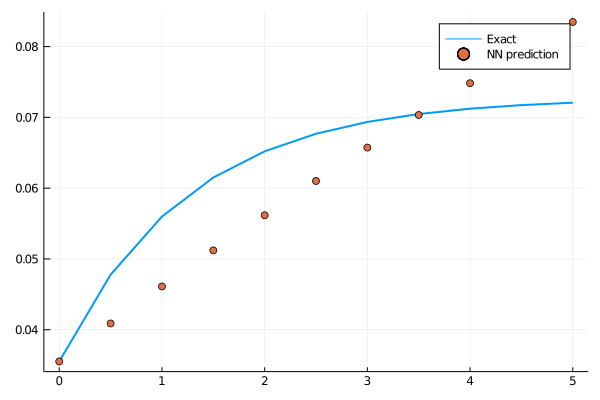

loss: 0.0039:  17%|██████▊                                  |  ETA: 0:00:54

0.0038341994f0

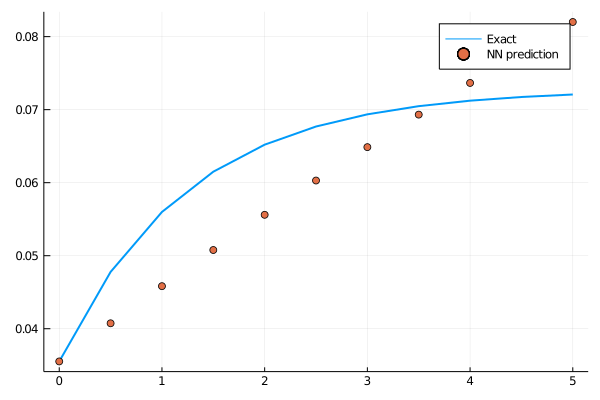

loss: 0.00383:  17%|███████                                  |  ETA: 0:00:54

0.0038184451f0

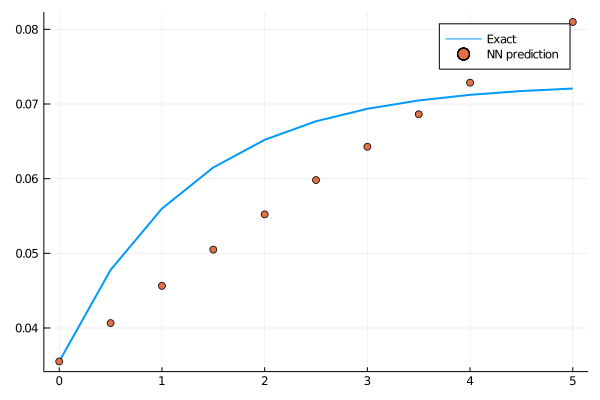

loss: 0.00382:  17%|███████▏                                 |  ETA: 0:00:54

0.0038262946f0

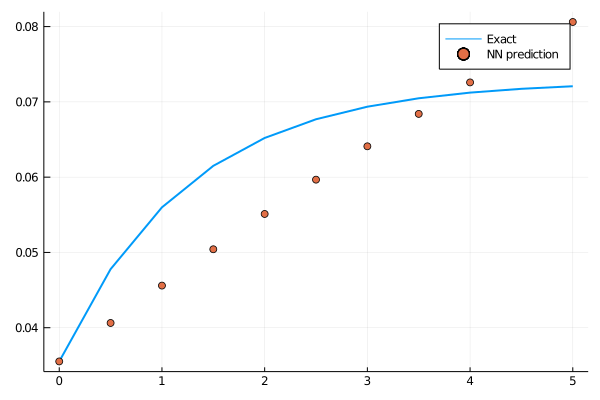

loss: 0.00383:  18%|███████▎                                 |  ETA: 0:00:54

0.0038225006f0

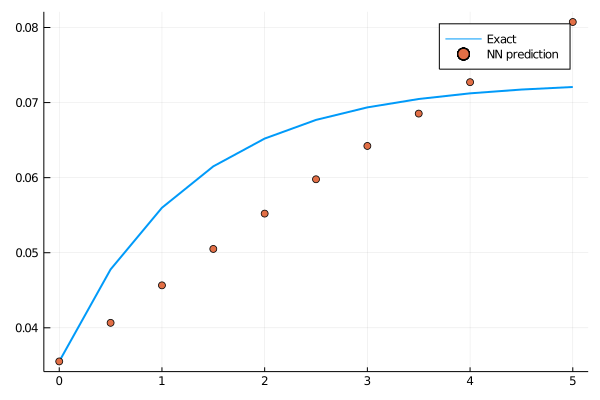

loss: 0.00382:  18%|███████▍                                 |  ETA: 0:00:54

0.0037805624f0

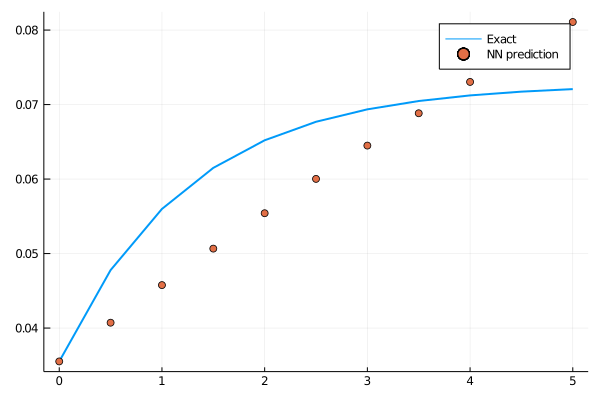

loss: 0.00378:  18%|███████▌                                 |  ETA: 0:00:54

0.0037057772f0

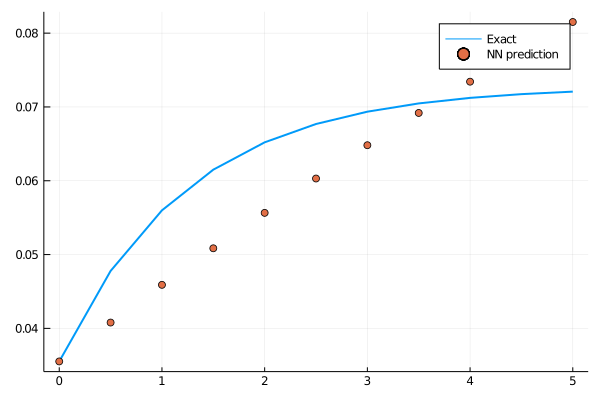

loss: 0.00371:  19%|███████▋                                 |  ETA: 0:00:54

0.0036317734f0

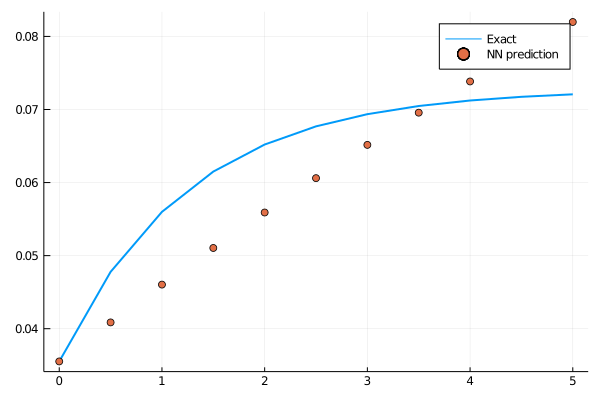

loss: 0.00363:  19%|███████▊                                 |  ETA: 0:00:53

0.0035892234f0

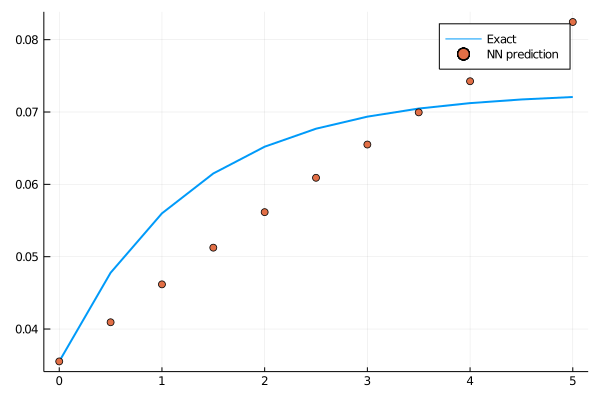

loss: 0.00359:  19%|███████▉                                 |  ETA: 0:00:53

0.0035755695f0

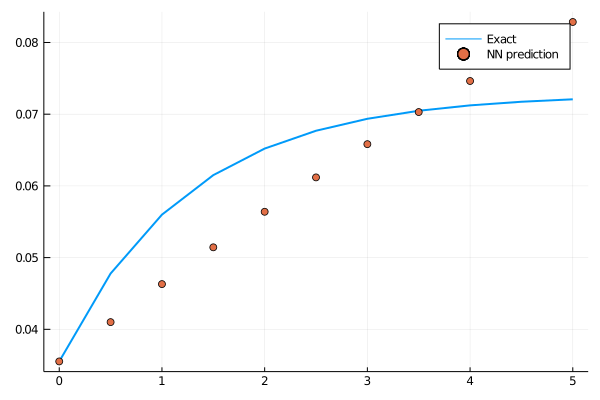

loss: 0.00358:  20%|████████                                 |  ETA: 0:00:53

0.0035624625f0

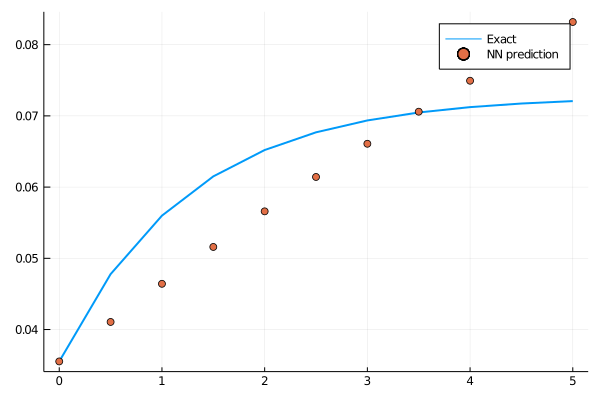

loss: 0.00356:  20%|████████▎                                |  ETA: 0:00:52

0.0035337587f0

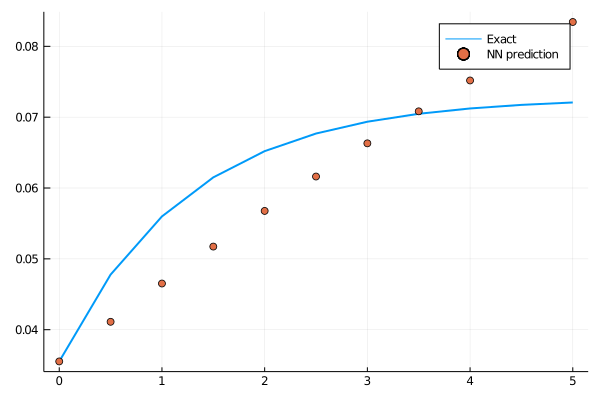

loss: 0.00353:  20%|████████▍                                |  ETA: 0:00:51

0.0034894012f0

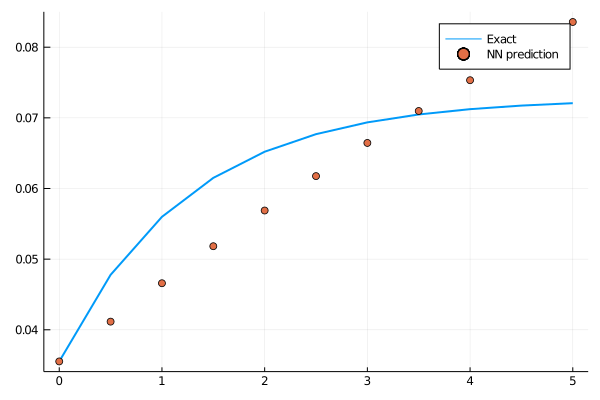

loss: 0.00349:  21%|████████▌                                |  ETA: 0:00:52

0.0034371468f0

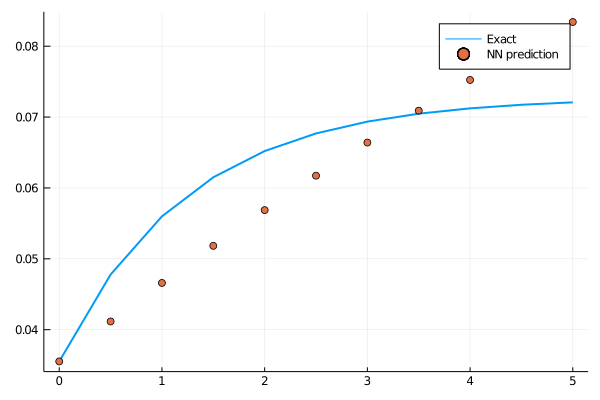

loss: 0.00344:  21%|████████▋                                |  ETA: 0:00:51

0.0033894656f0

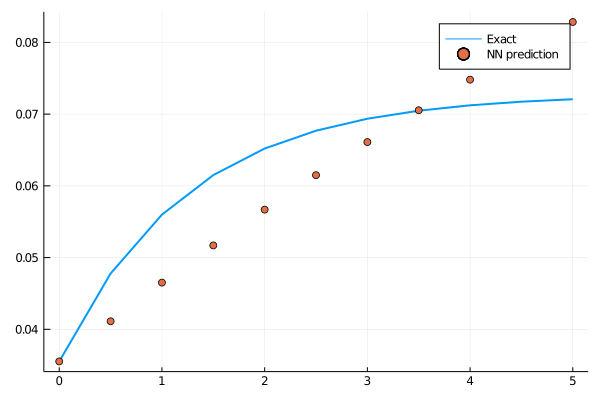

loss: 0.00339:  21%|████████▊                                |  ETA: 0:00:51

0.0033533247f0

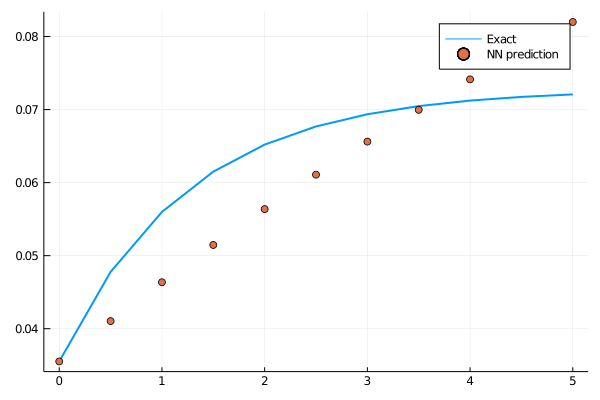

loss: 0.00335:  22%|████████▉                                |  ETA: 0:00:51

0.003325708f0

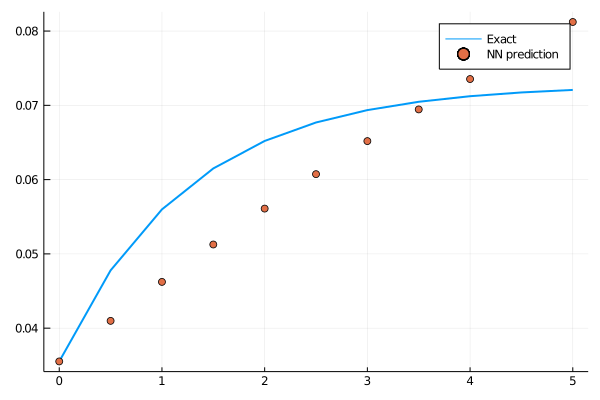

loss: 0.00333:  22%|█████████                                |  ETA: 0:00:50

0.0032987255f0

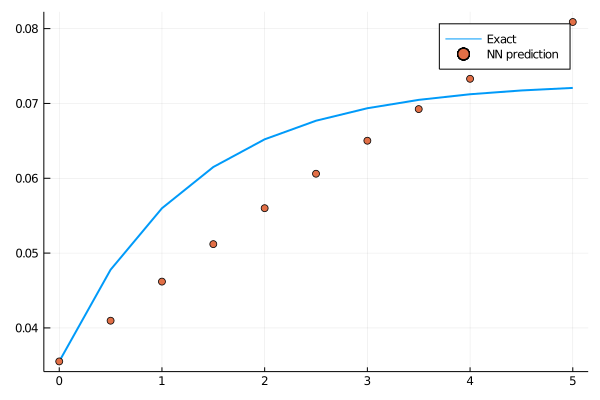

loss: 0.0033:  22%|█████████▏                               |  ETA: 0:00:50

0.0032669671f0

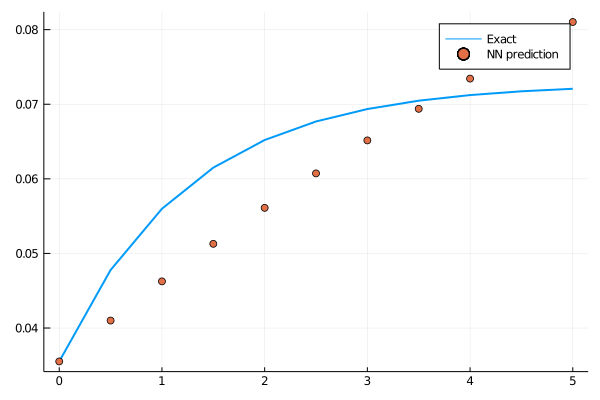

loss: 0.00327:  23%|█████████▎                               |  ETA: 0:00:49

0.00322723f0

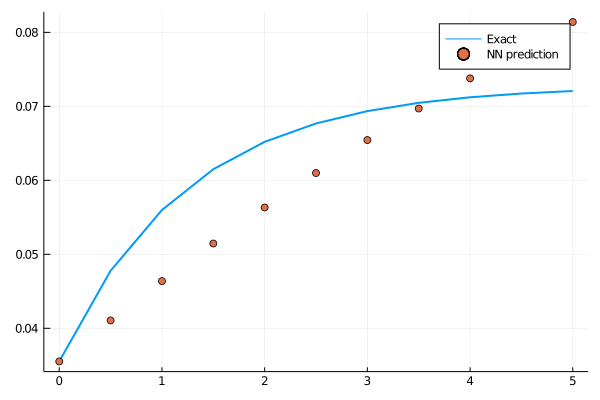

loss: 0.00323:  23%|█████████▍                               |  ETA: 0:00:49

0.003182173f0

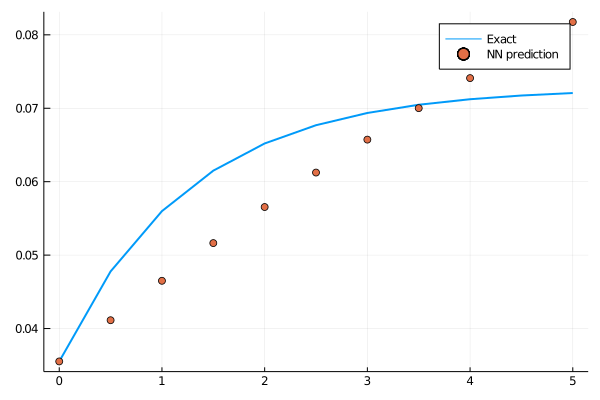

loss: 0.00318:  23%|█████████▌                               |  ETA: 0:00:49

0.003138752f0

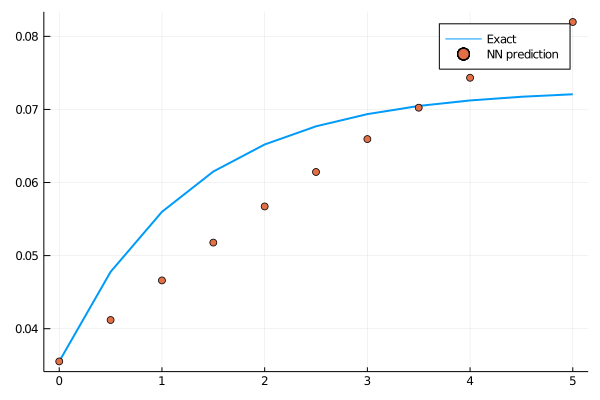

loss: 0.00314:  24%|█████████▋                               |  ETA: 0:00:49

0.0031038523f0

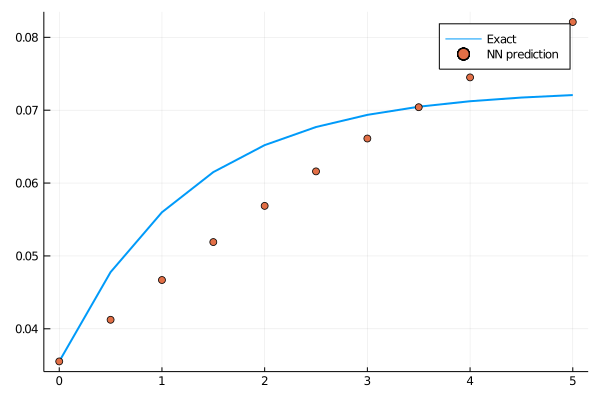

loss: 0.0031:  24%|█████████▉                               |  ETA: 0:00:48

0.0030761787f0

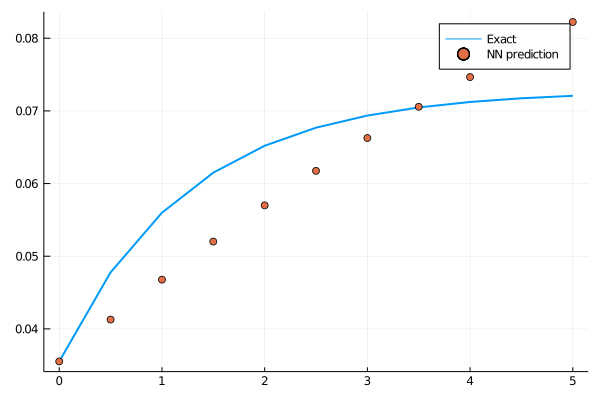

loss: 0.00308:  24%|██████████                               |  ETA: 0:00:48

0.0030456472f0

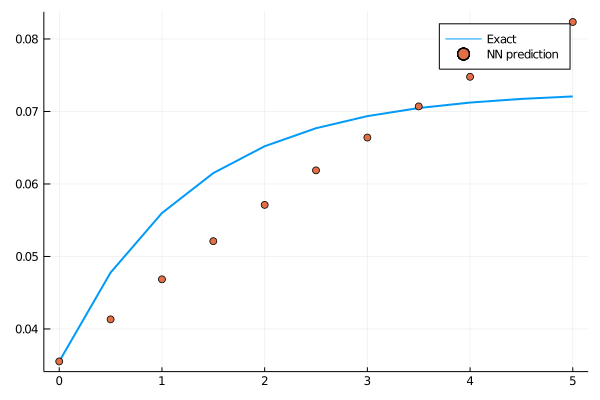

loss: 0.00305:  25%|██████████▏                              |  ETA: 0:00:48

0.00300653f0

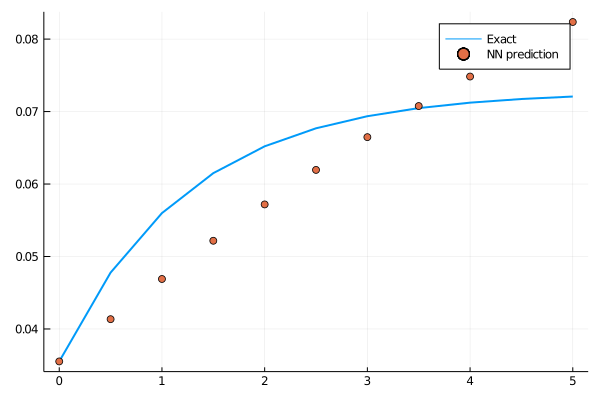

loss: 0.00301:  25%|██████████▎                              |  ETA: 0:00:48

0.0029641597f0

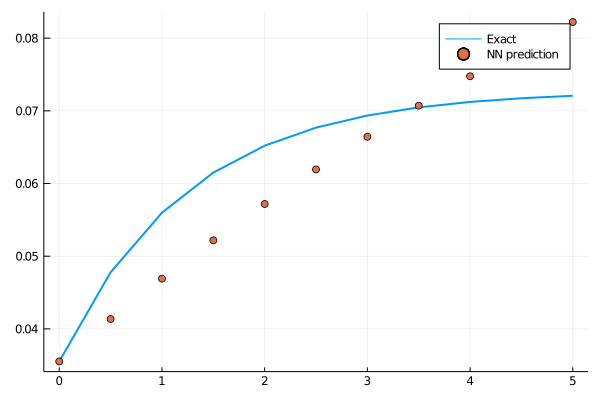

loss: 0.00296:  25%|██████████▍                              |  ETA: 0:00:47

0.0029249522f0

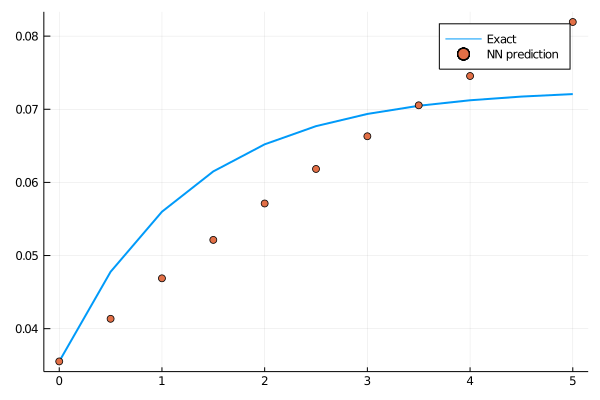

loss: 0.00292:  26%|██████████▌                              |  ETA: 0:00:47

0.0028894902f0

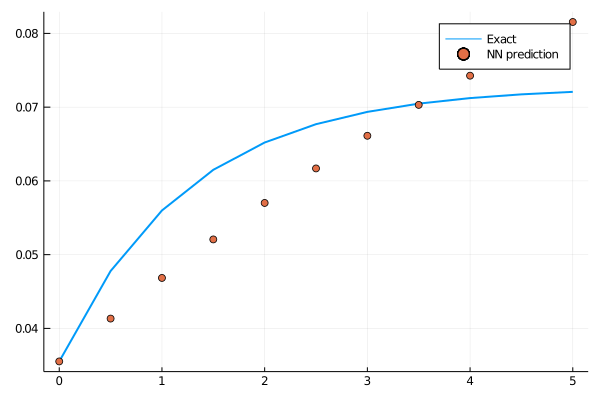

loss: 0.00289:  26%|██████████▋                              |  ETA: 0:00:47

0.0028564702f0

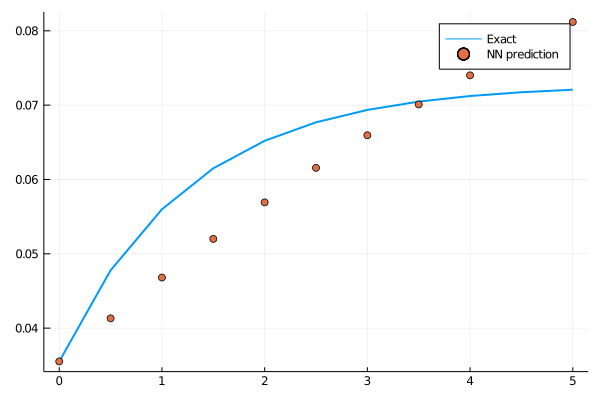

loss: 0.00286:  26%|██████████▊                              |  ETA: 0:00:46

0.0028224543f0

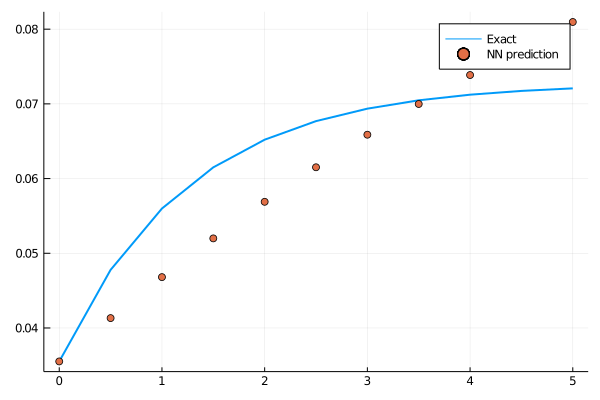

loss: 0.00282:  27%|██████████▉                              |  ETA: 0:00:46

0.0027856368f0

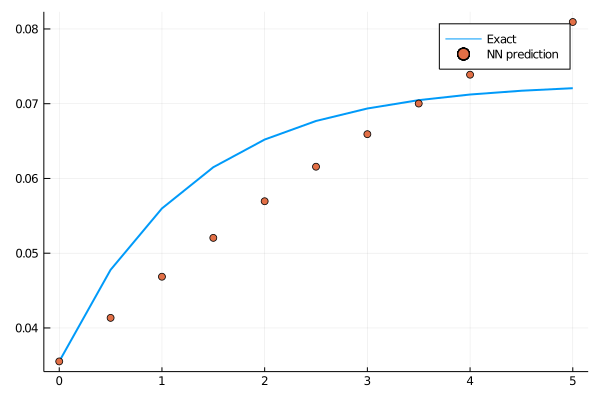

loss: 0.00279:  27%|███████████▏                             |  ETA: 0:00:46

0.0027474256f0

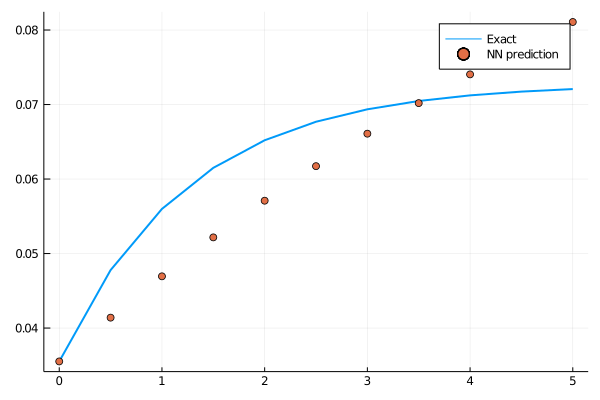

loss: 0.00275:  27%|███████████▎                             |  ETA: 0:00:45

0.0027092053f0

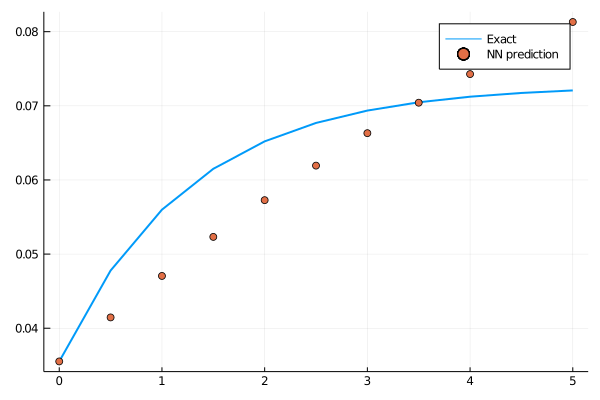

loss: 0.00271:  28%|███████████▍                             |  ETA: 0:00:45

0.0026722196f0

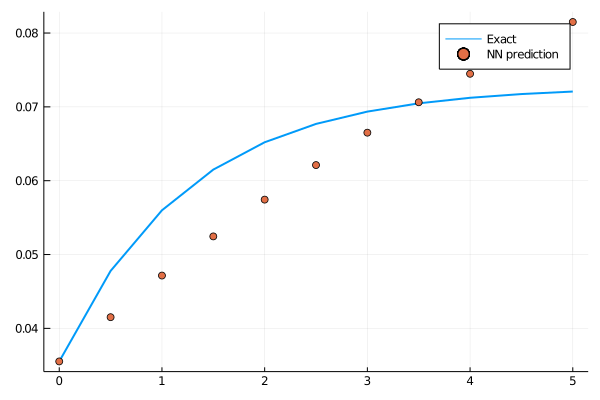

loss: 0.00267:  28%|███████████▌                             |  ETA: 0:00:45

0.0026371074f0

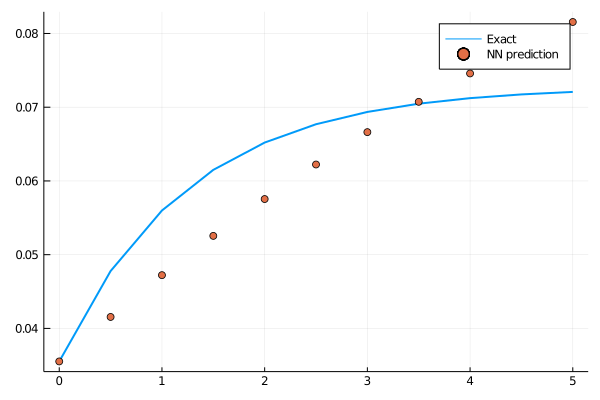

loss: 0.00264:  28%|███████████▋                             |  ETA: 0:00:45

0.0026025986f0

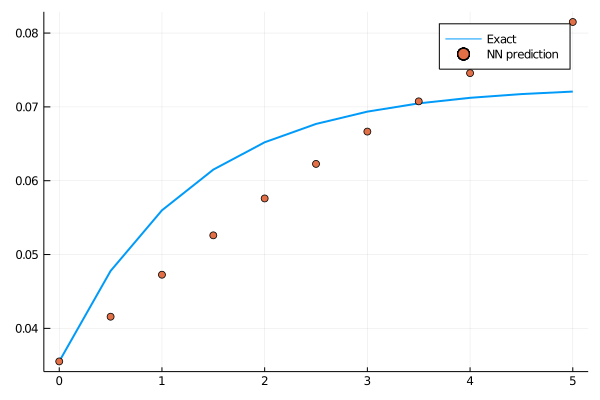

loss: 0.0026:  29%|███████████▊                             |  ETA: 0:00:45

0.002566866f0

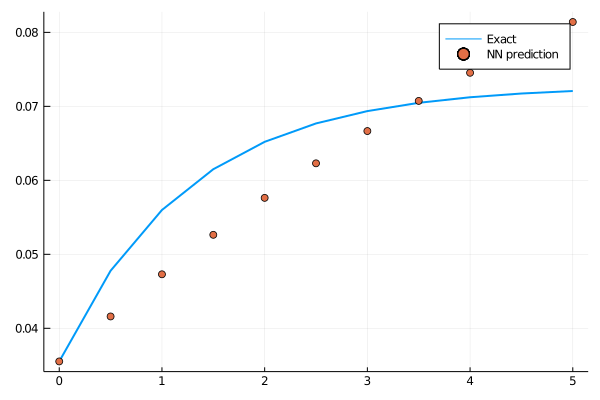

loss: 0.00257:  29%|███████████▉                             |  ETA: 0:00:44

0.0025296155f0

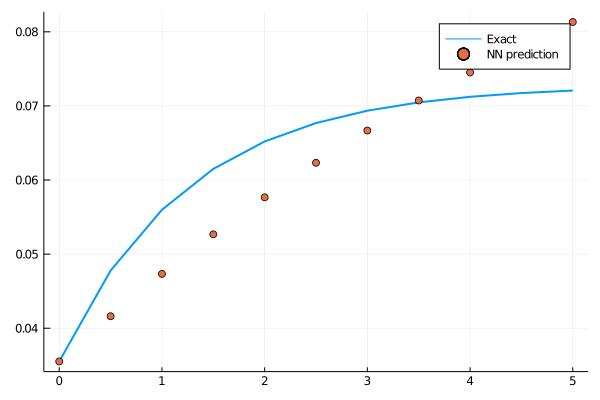

loss: 0.00253:  29%|████████████                             |  ETA: 0:00:44

0.0024919505f0

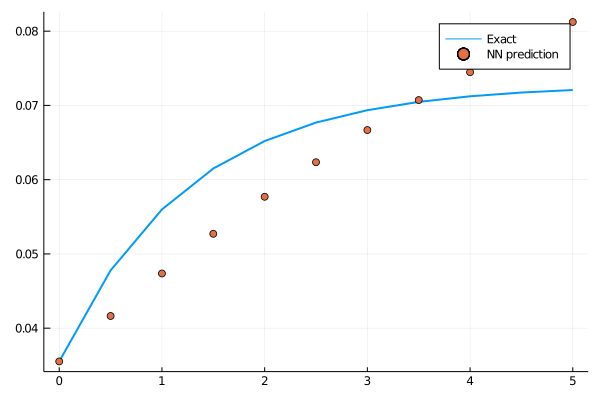

loss: 0.00249:  30%|████████████▏                            |  ETA: 0:00:44

0.0024554995f0

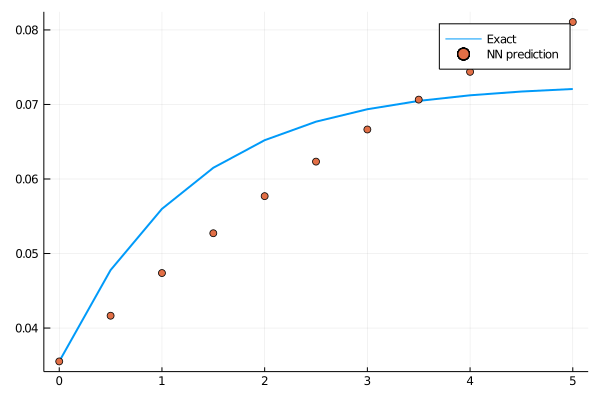

loss: 0.00246:  30%|████████████▎                            |  ETA: 0:00:43

0.0024206992f0

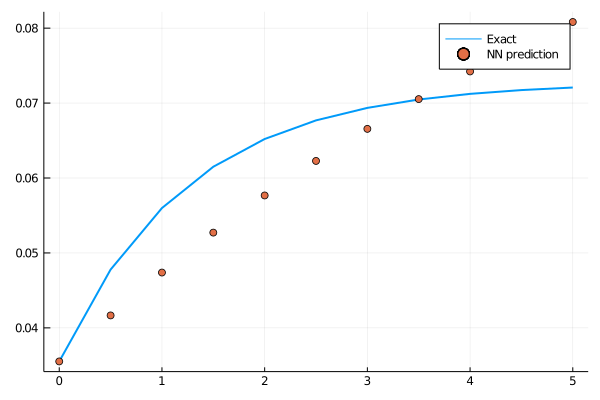

loss: 0.00242:  30%|████████████▍                            |  ETA: 0:00:43

0.0023861285f0

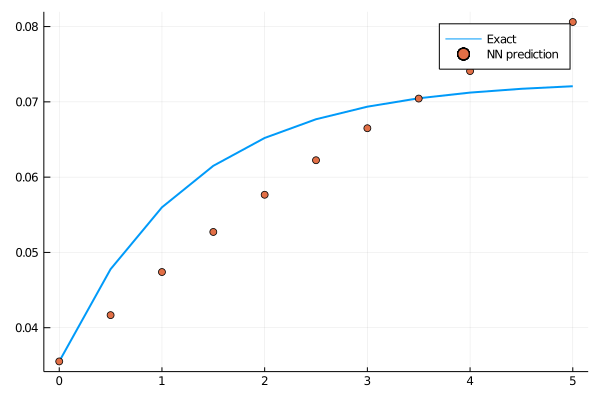

loss: 0.00239:  31%|████████████▌                            |  ETA: 0:00:43

0.0023503262f0

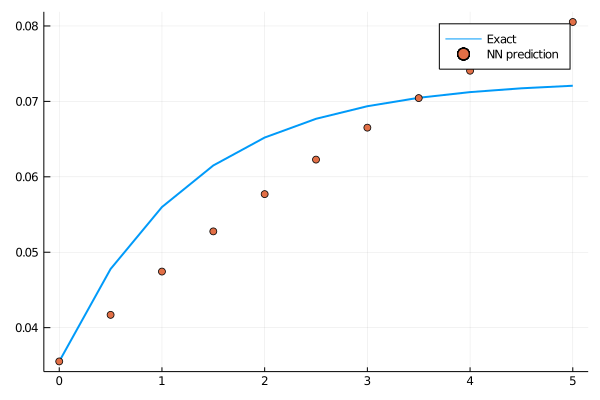

loss: 0.00235:  31%|████████████▊                            |  ETA: 0:00:43

0.0023136693f0

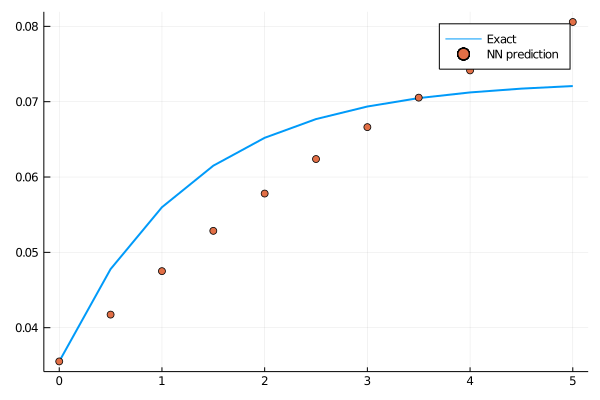

loss: 0.00231:  31%|████████████▉                            |  ETA: 0:00:43

0.0022775047f0

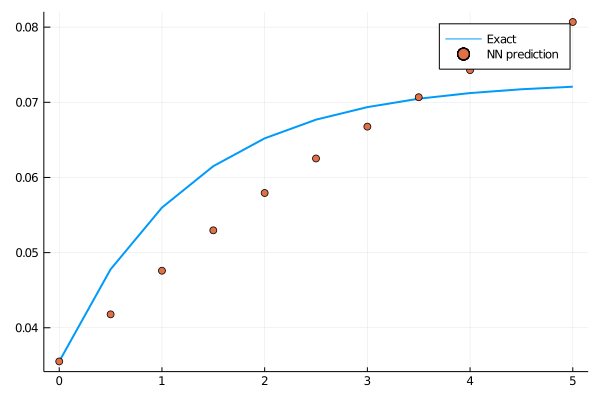

loss: 0.00228:  32%|█████████████                            |  ETA: 0:00:43

0.0022424948f0

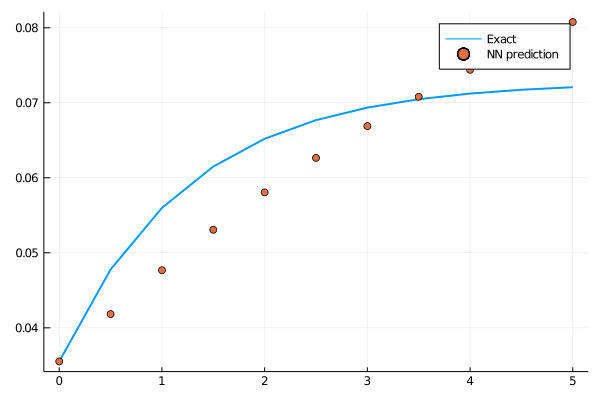

loss: 0.00224:  32%|█████████████▏                           |  ETA: 0:00:43

0.0022078997f0

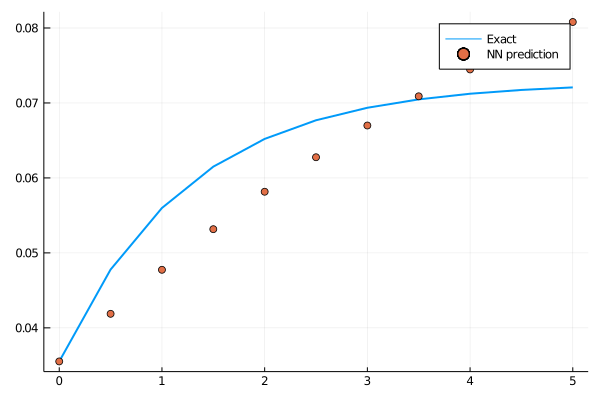

loss: 0.00221:  32%|█████████████▎                           |  ETA: 0:00:43

0.002173104f0

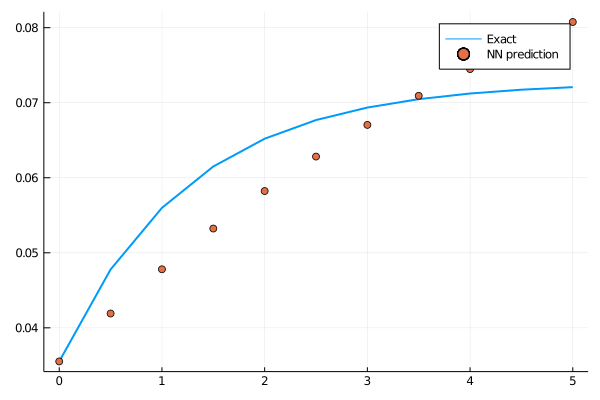

loss: 0.00217:  33%|█████████████▍                           |  ETA: 0:00:42

0.0021381786f0

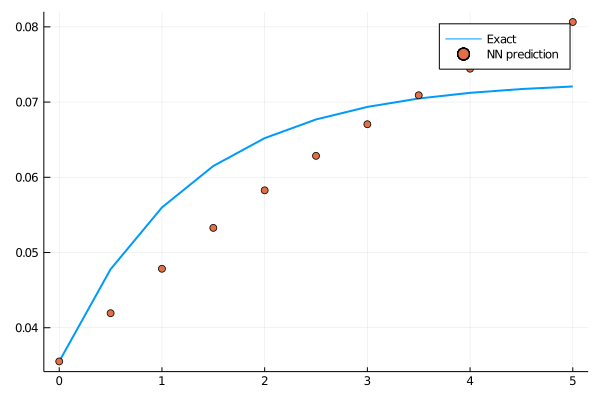

loss: 0.00214:  33%|█████████████▌                           |  ETA: 0:00:42

0.0021031802f0

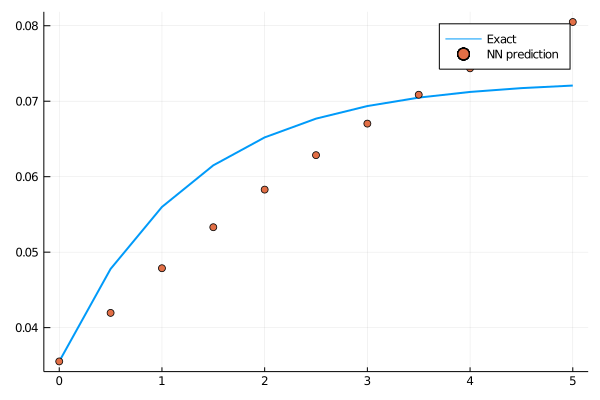

loss: 0.0021:  33%|█████████████▋                           |  ETA: 0:00:42

0.0020684106f0

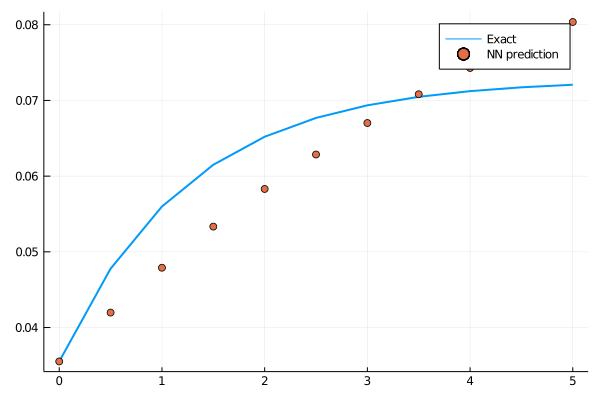

loss: 0.00207:  34%|█████████████▊                           |  ETA: 0:00:42

0.0020343035f0

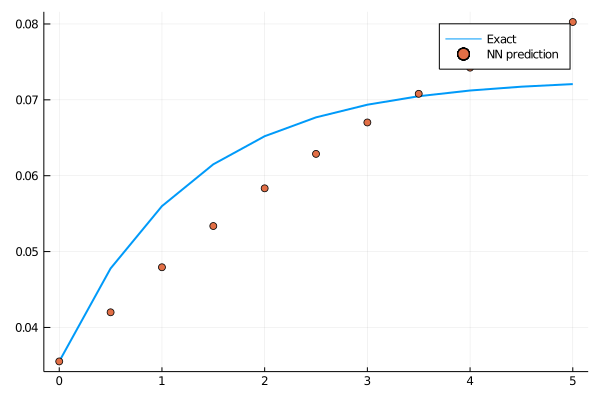

loss: 0.00203:  34%|██████████████                           |  ETA: 0:00:41

0.0020006872f0

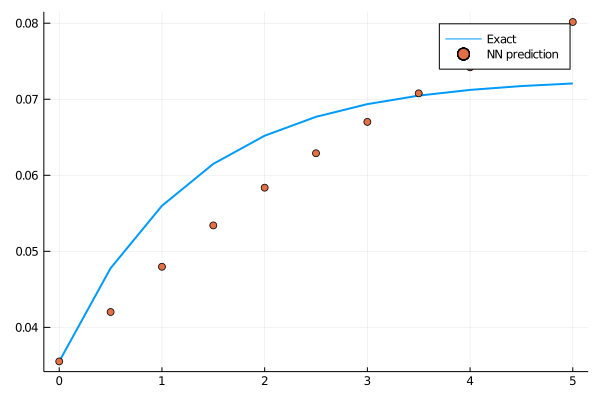

loss: 0.002:  34%|██████████████▏                          |  ETA: 0:00:41

0.0019670916f0

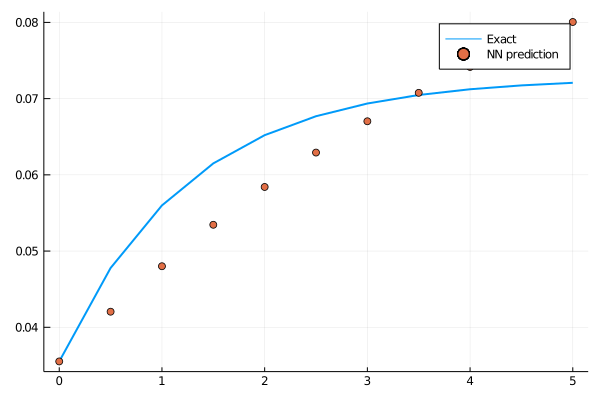

loss: 0.00197:  35%|██████████████▏                          |  ETA: 0:00:41

0.0019333691f0

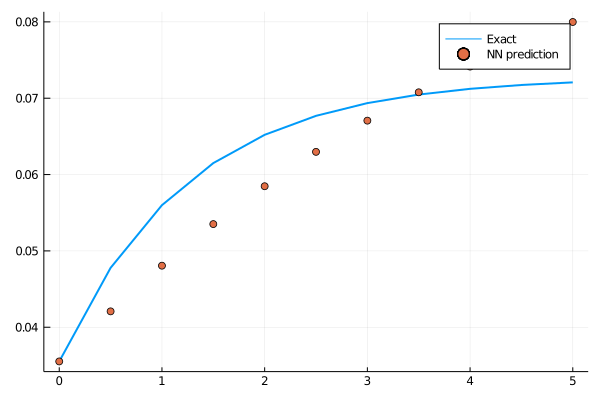

loss: 0.00193:  35%|██████████████▍                          |  ETA: 0:00:40

0.0018997797f0

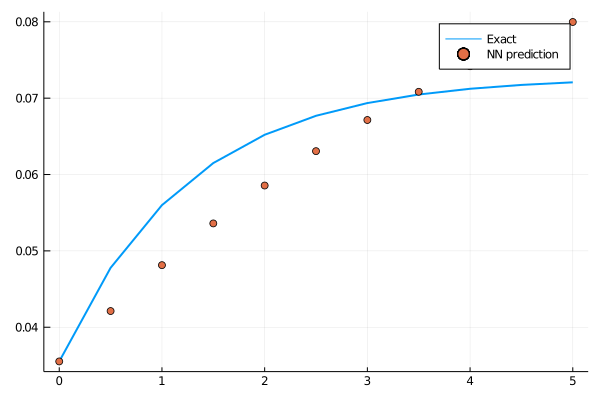

loss: 0.0019:  35%|██████████████▌                          |  ETA: 0:00:40

0.0018666764f0

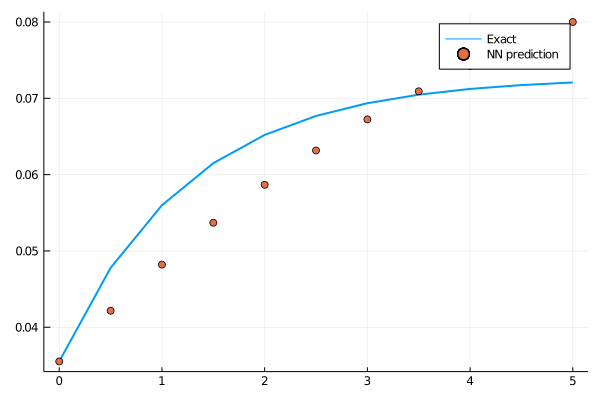

loss: 0.00187:  36%|██████████████▋                          |  ETA: 0:00:40

0.0018341321f0

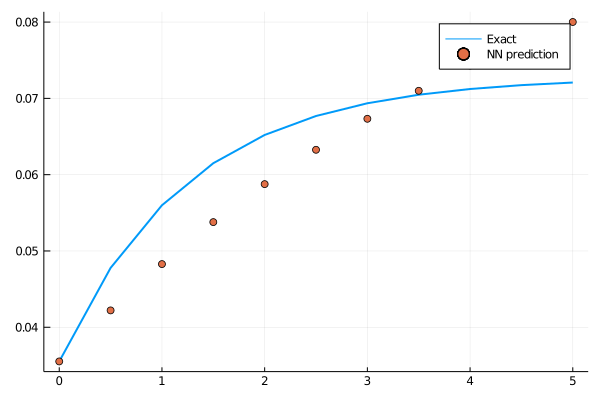

loss: 0.00183:  36%|██████████████▊                          |  ETA: 0:00:40

0.0018018701f0

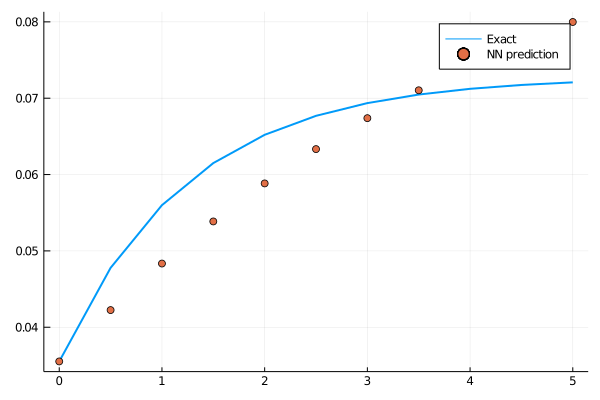

loss: 0.0018:  36%|██████████████▉                          |  ETA: 0:00:39

0.0017696407f0

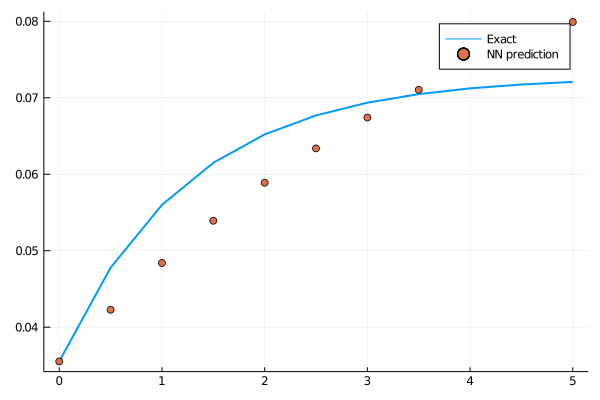

loss: 0.00177:  37%|███████████████                          |  ETA: 0:00:39

0.0017375629f0

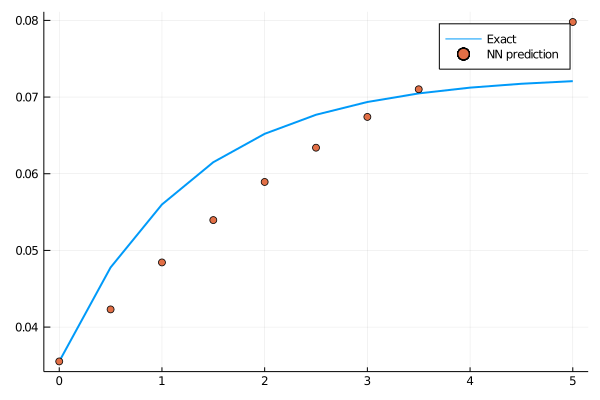

loss: 0.00174:  37%|███████████████▏                         |  ETA: 0:00:39

0.0017059179f0

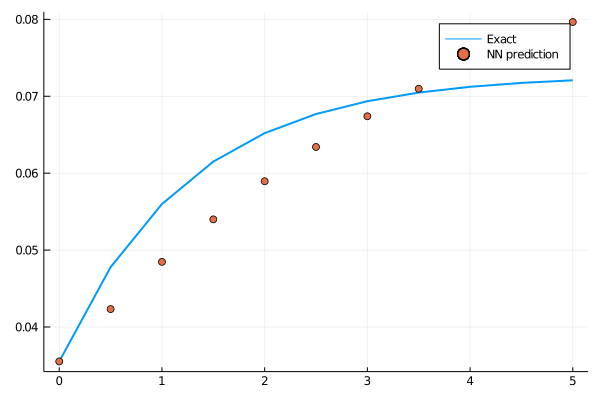

loss: 0.00171:  37%|███████████████▎                         |  ETA: 0:00:39

0.0016747628f0

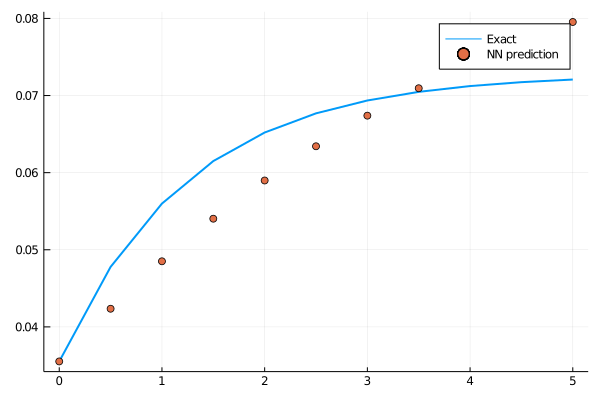

loss: 0.00167:  38%|███████████████▍                         |  ETA: 0:00:39

0.0016439445f0

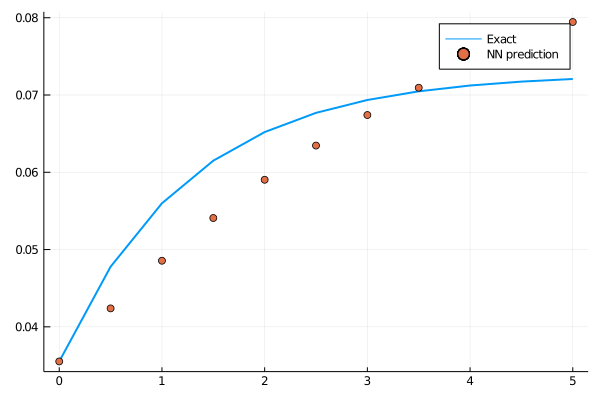

loss: 0.00164:  38%|███████████████▋                         |  ETA: 0:00:38

0.001613349f0

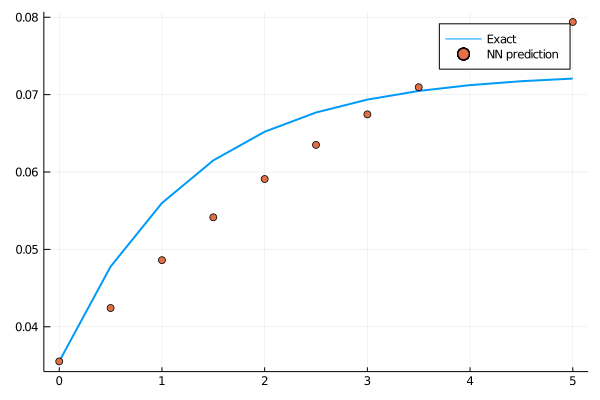

loss: 0.00161:  38%|███████████████▊                         |  ETA: 0:00:38

0.0015830043f0

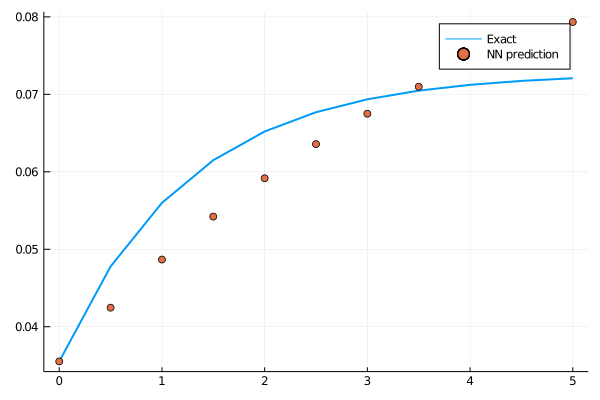

loss: 0.00158:  39%|███████████████▉                         |  ETA: 0:00:38

0.0015530192f0

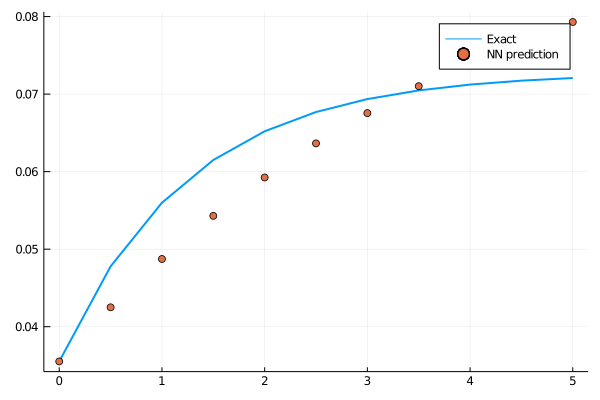

loss: 0.00155:  39%|████████████████                         |  ETA: 0:00:37

0.0015234376f0

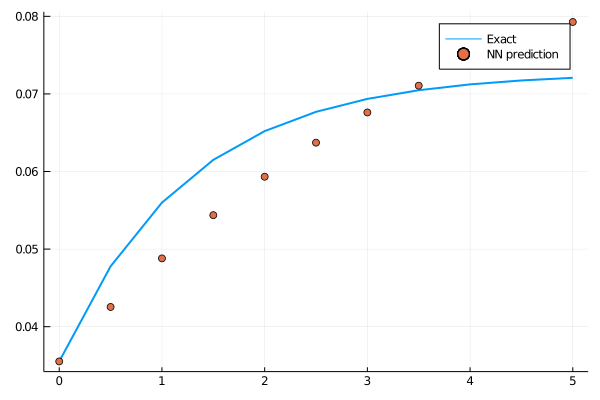

loss: 0.00152:  39%|████████████████▏                        |  ETA: 0:00:37

0.0014942602f0

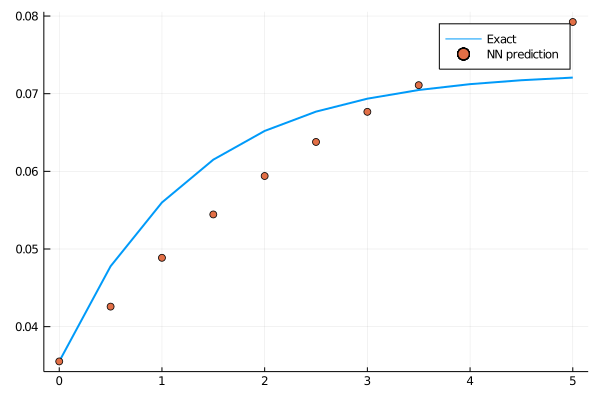

loss: 0.00149:  40%|████████████████▎                        |  ETA: 0:00:37

0.0014654497f0

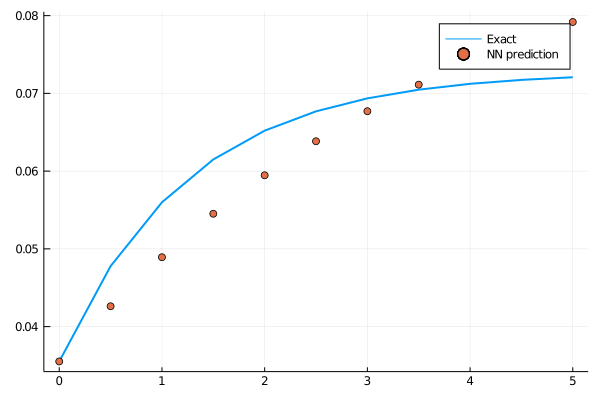

loss: 0.00147:  40%|████████████████▍                        |  ETA: 0:00:36

0.0014369293f0

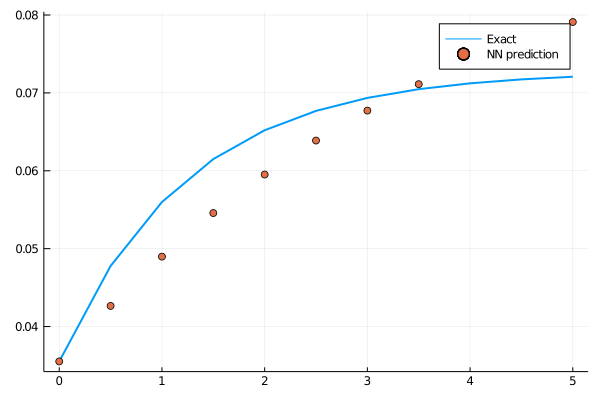

loss: 0.00144:  40%|████████████████▌                        |  ETA: 0:00:36

0.001408734f0

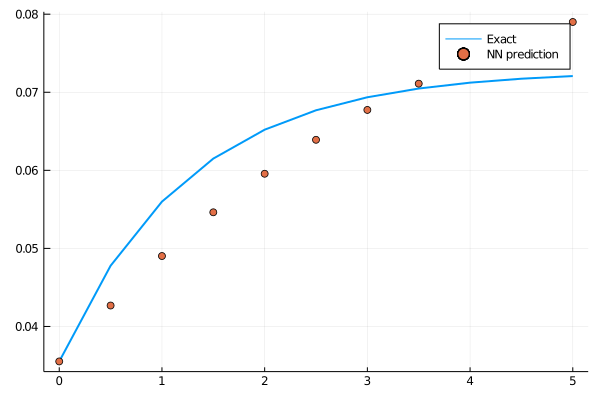

loss: 0.00141:  41%|████████████████▋                        |  ETA: 0:00:36

0.0013809514f0

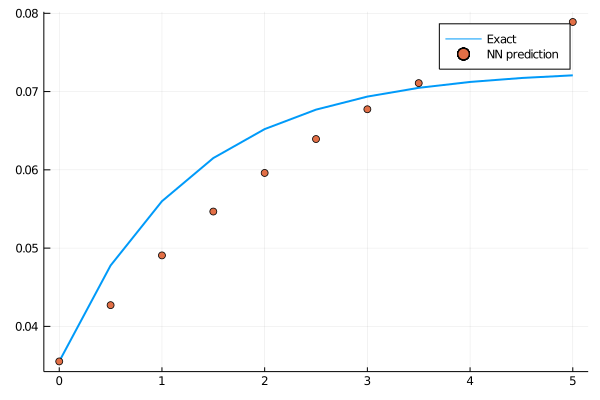

loss: 0.00138:  41%|████████████████▊                        |  ETA: 0:00:35

0.0013536072f0

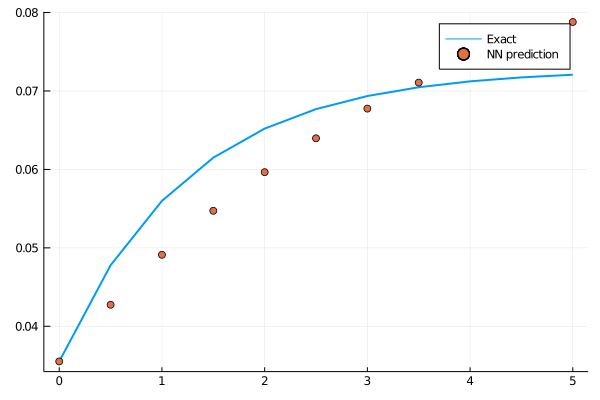

loss: 0.00135:  41%|████████████████▉                        |  ETA: 0:00:35

0.0013266358f0

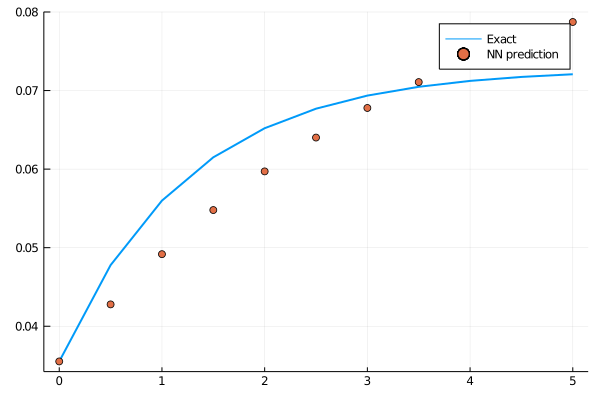

loss: 0.00133:  42%|█████████████████                        |  ETA: 0:00:35

0.0012999908f0

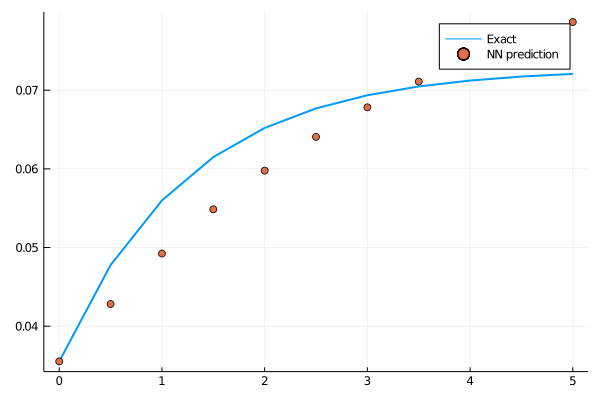

loss: 0.0013:  42%|█████████████████▎                       |  ETA: 0:00:35

0.0012736944f0

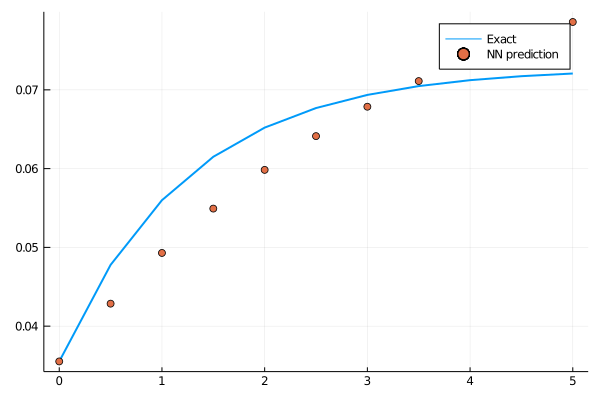

0.001247814f0

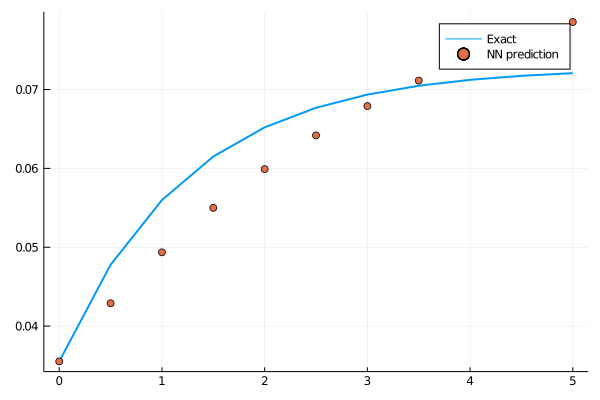

loss: 0.00125:  43%|█████████████████▌                       |  ETA: 0:00:34

0.0012223561f0

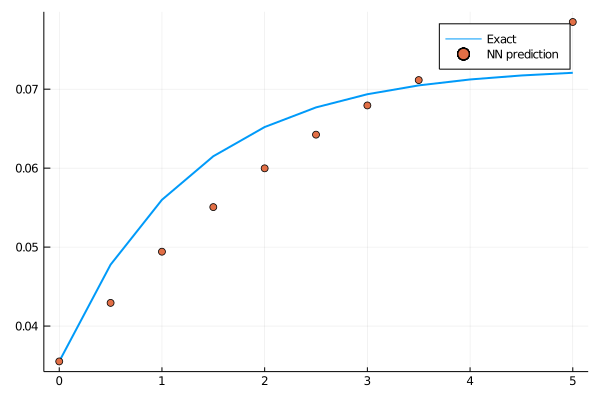

loss: 0.00122:  43%|█████████████████▋                       |  ETA: 0:00:34

0.001197276f0

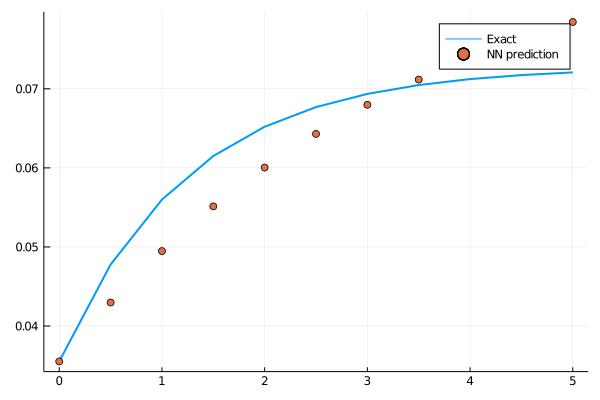

loss: 0.0012:  43%|█████████████████▊                       |  ETA: 0:00:33

0.001172552f0

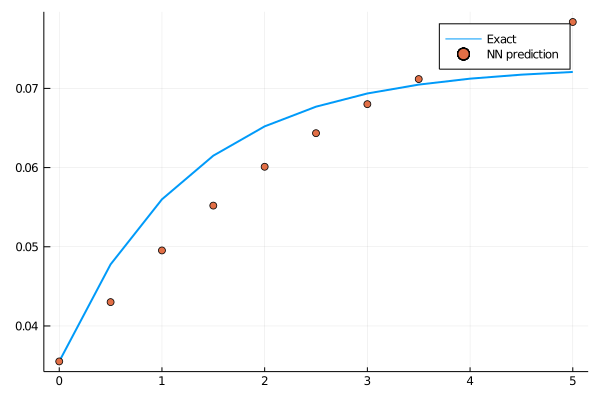

loss: 0.00117:  44%|█████████████████▉                       |  ETA: 0:00:33

0.0011482071f0

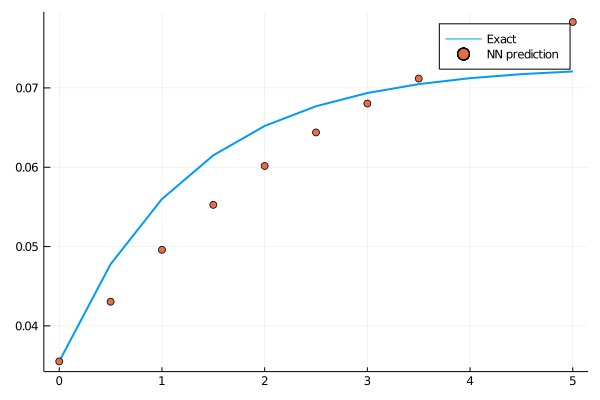

loss: 0.00115:  44%|██████████████████                       |  ETA: 0:00:33

0.0011242584f0

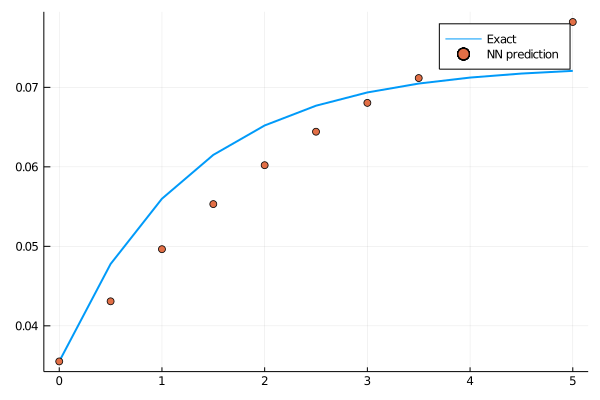

loss: 0.00112:  44%|██████████████████▏                      |  ETA: 0:00:33

0.001100711f0

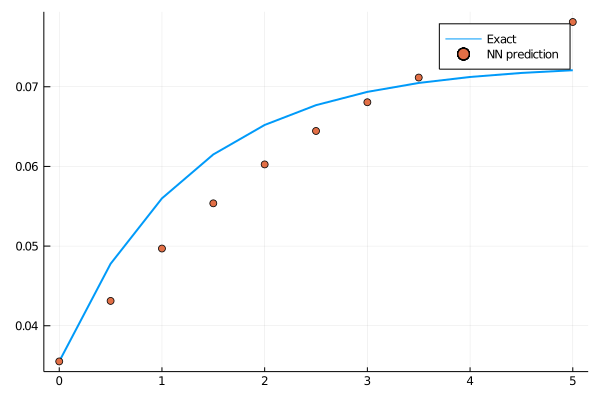

loss: 0.0011:  45%|██████████████████▎                      |  ETA: 0:00:32

0.001077551f0

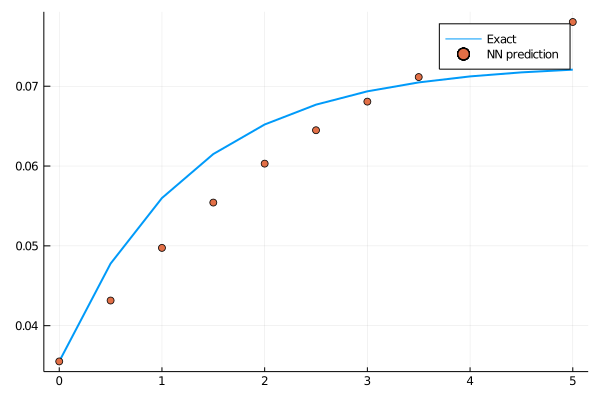

loss: 0.00108:  45%|██████████████████▌                      |  ETA: 0:00:32

0.0010547604f0

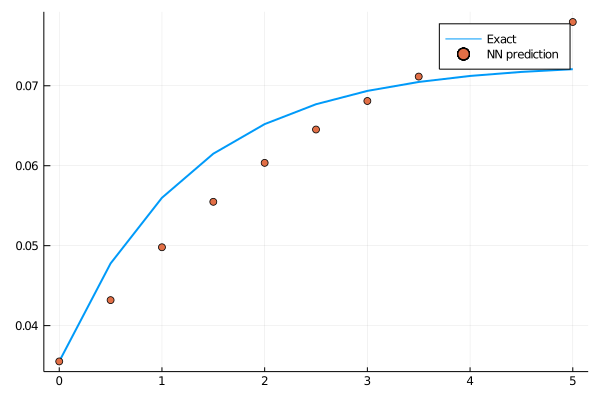

loss: 0.00105:  45%|██████████████████▋                      |  ETA: 0:00:32

0.00103234f0

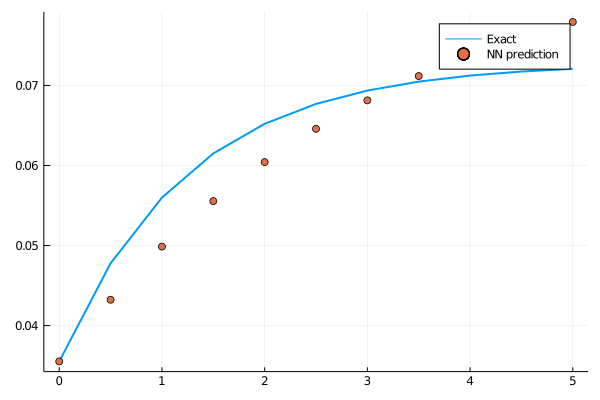

loss: 0.00103:  46%|██████████████████▊                      |  ETA: 0:00:32

0.0010103032f0

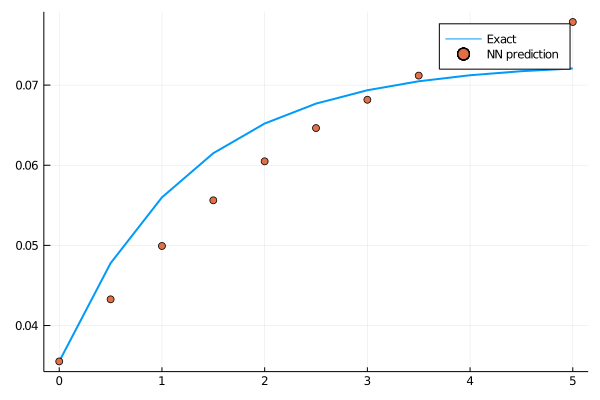

loss: 0.00101:  46%|██████████████████▉                      |  ETA: 0:00:32

0.0009886536f0

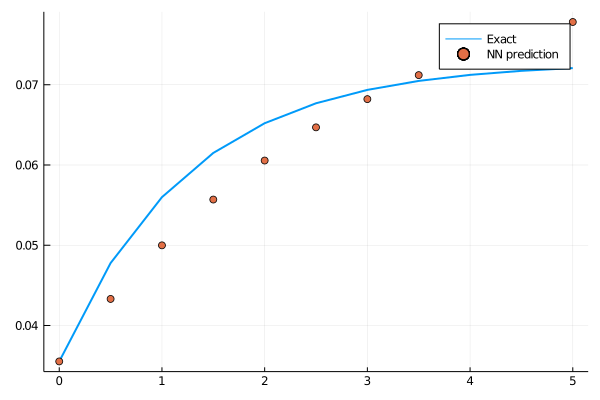

loss: 0.000989:  46%|███████████████████                      |  ETA: 0:00:31

0.00096738647f0

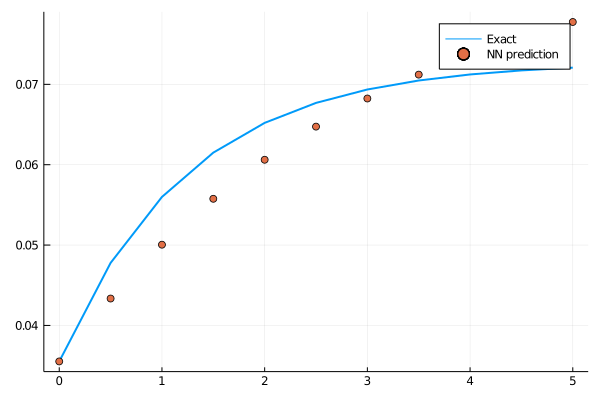

loss: 0.000967:  47%|███████████████████▏                     |  ETA: 0:00:31

0.0009464829f0

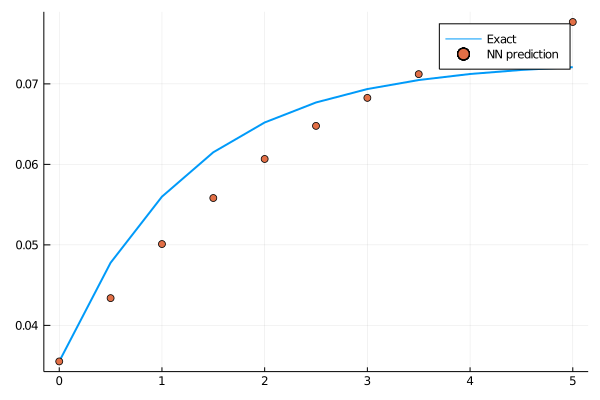

loss: 0.000946:  47%|███████████████████▎                     |  ETA: 0:00:31

0.0009259399f0

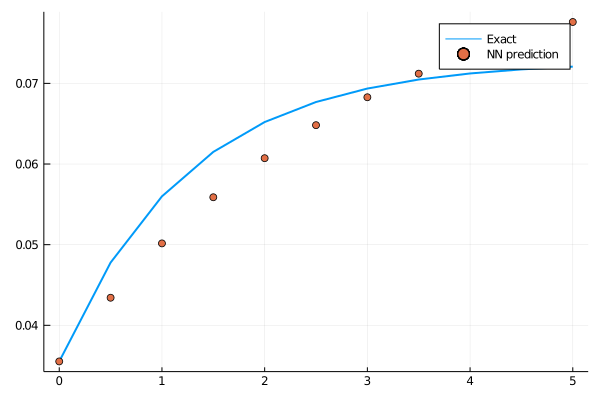

loss: 0.000926:  47%|███████████████████▍                     |  ETA: 0:00:31

0.00090577f0

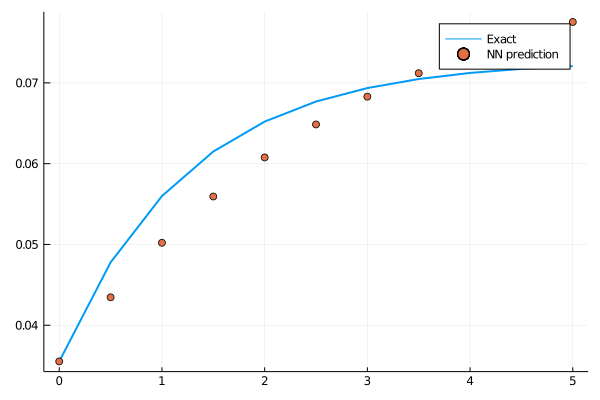

loss: 0.000906:  48%|███████████████████▌                     |  ETA: 0:00:30

0.00088597357f0

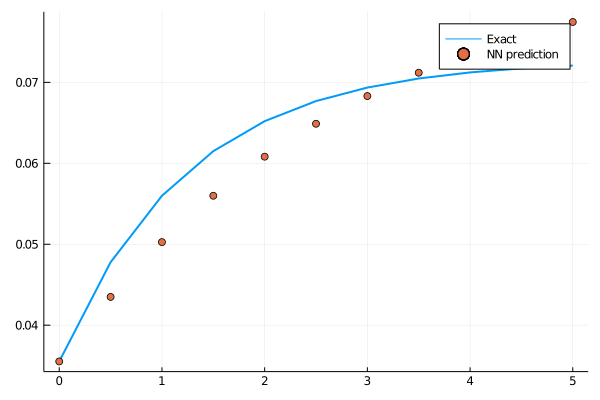

loss: 0.000886:  48%|███████████████████▋                     |  ETA: 0:00:30

0.0008665371f0

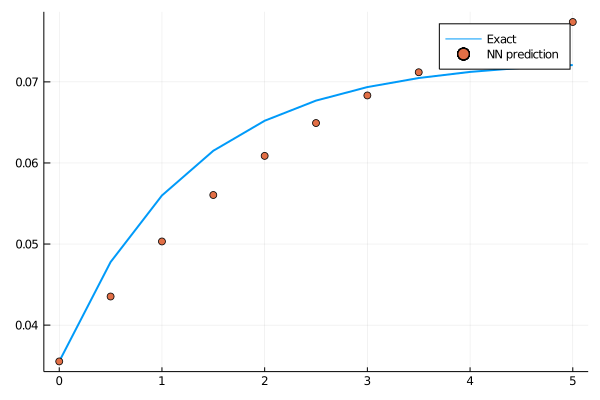

loss: 0.000867:  48%|███████████████████▊                     |  ETA: 0:00:30

0.00084745063f0

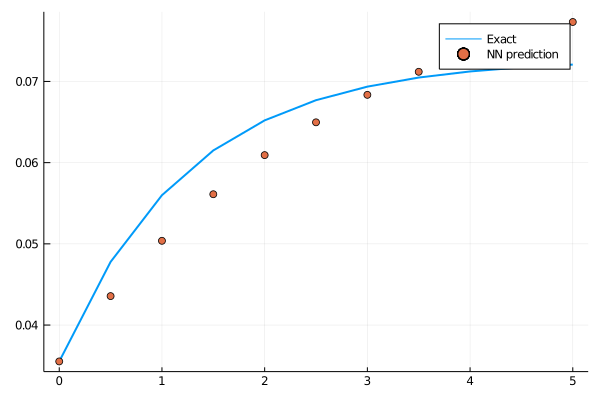

loss: 0.000847:  49%|███████████████████▉                     |  ETA: 0:00:30

0.0008287134f0

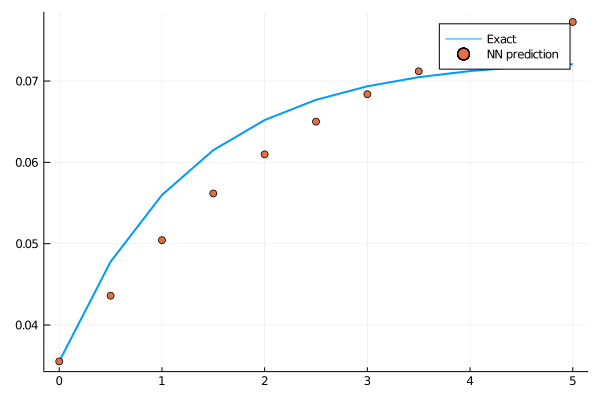

loss: 0.000829:  49%|████████████████████▏                    |  ETA: 0:00:30

0.00081033056f0

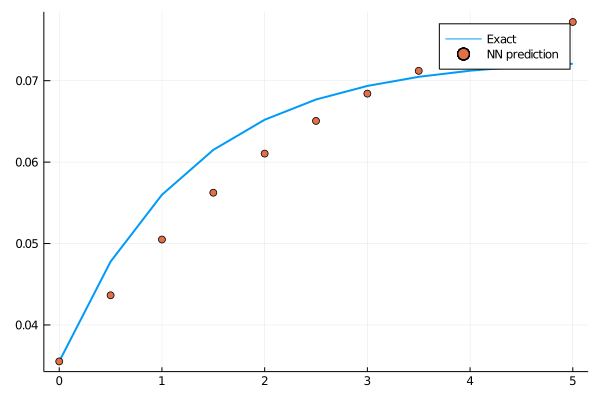

loss: 0.00081:  49%|████████████████████▎                    |  ETA: 0:00:30

0.00079229893f0

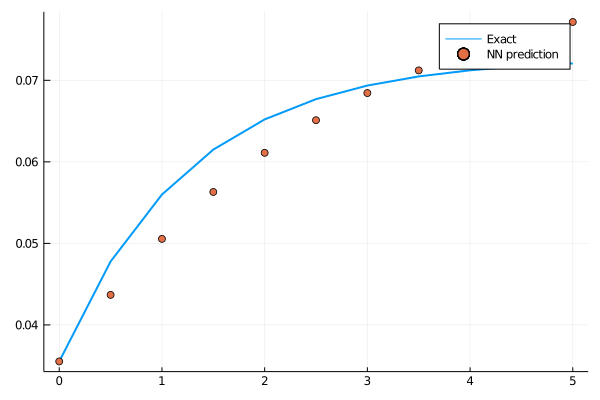

loss: 0.000792:  50%|████████████████████▍                    |  ETA: 0:00:29

0.0007746073f0

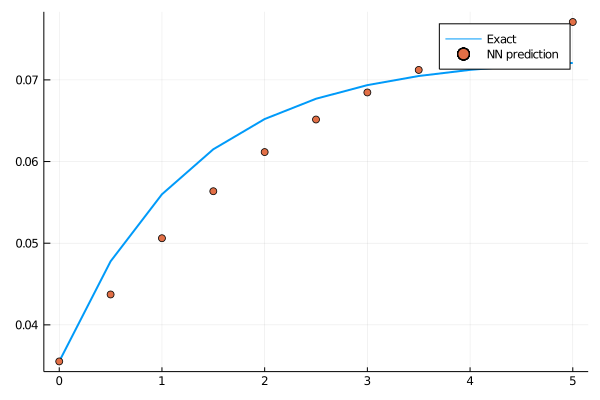

loss: 0.000775:  50%|████████████████████▌                    |  ETA: 0:00:29

0.00075725024f0

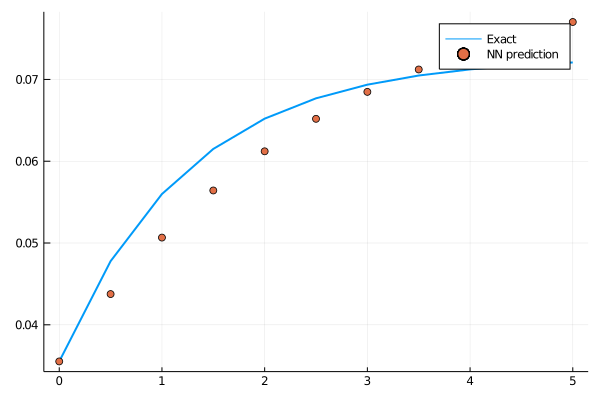

loss: 0.000757:  50%|████████████████████▋                    |  ETA: 0:00:29

0.00074022694f0

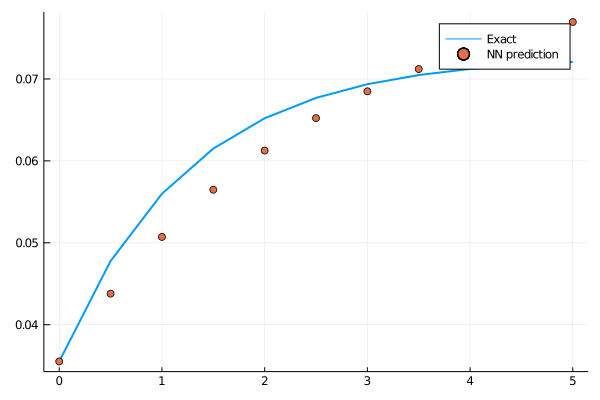

loss: 0.00074:  51%|████████████████████▊                    |  ETA: 0:00:29

0.00072353537f0

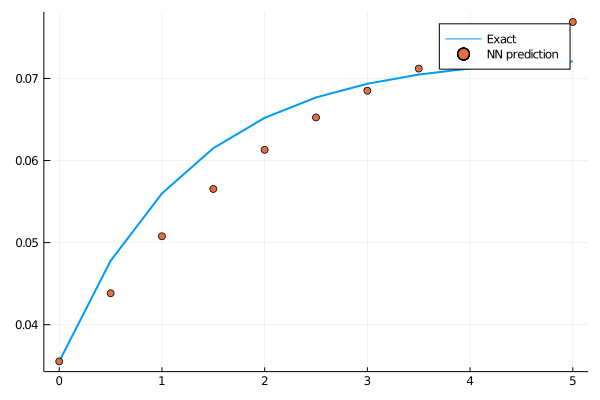

loss: 0.000724:  51%|████████████████████▉                    |  ETA: 0:00:29

0.00070717063f0

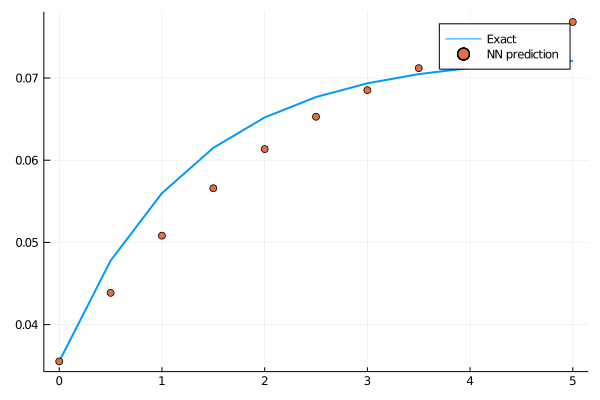

loss: 0.000707:  51%|█████████████████████                    |  ETA: 0:00:28

0.00069112587f0

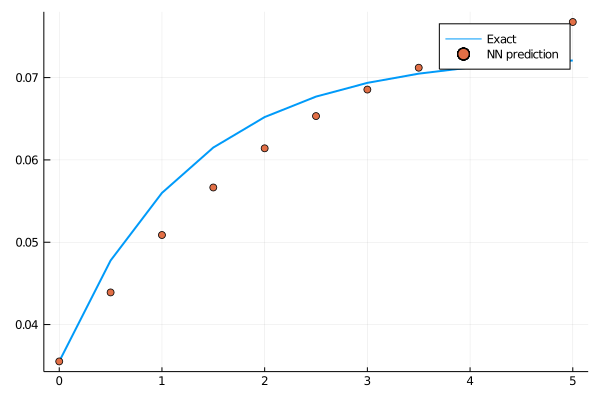

loss: 0.000691:  52%|█████████████████████▏                   |  ETA: 0:00:28

0.0006753961f0

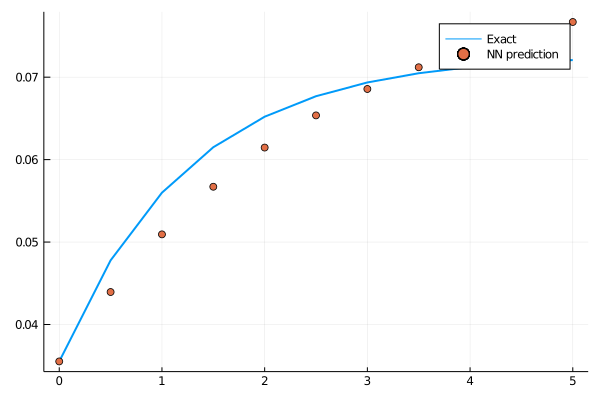

loss: 0.000675:  52%|█████████████████████▍                   |  ETA: 0:00:28

0.00065997714f0

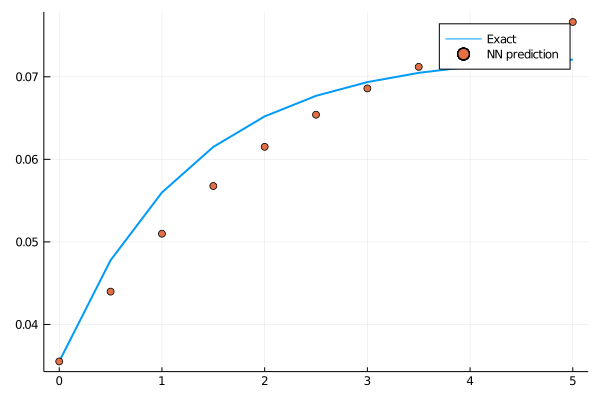

loss: 0.00066:  52%|█████████████████████▌                   |  ETA: 0:00:27

0.00064486737f0

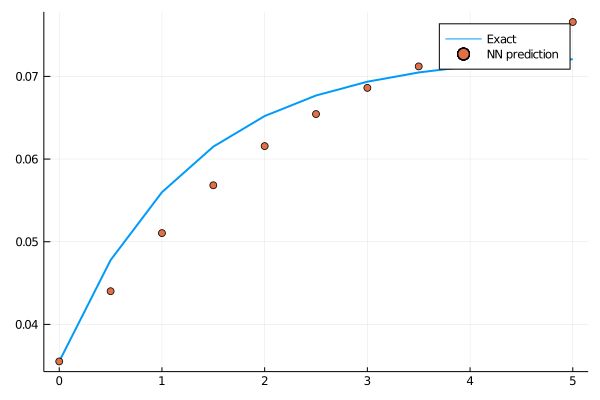

loss: 0.000645:  53%|█████████████████████▋                   |  ETA: 0:00:27

0.00063006225f0

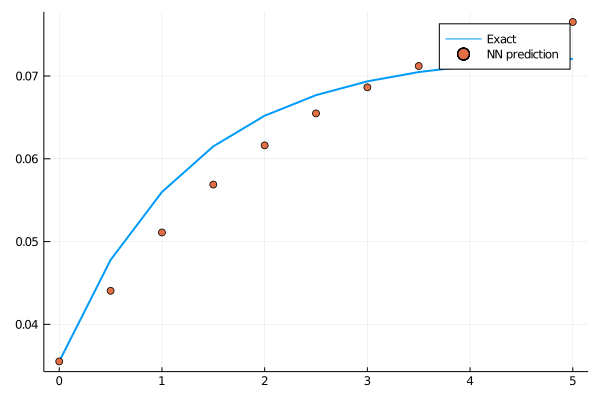

loss: 0.00063:  53%|█████████████████████▊                   |  ETA: 0:00:27

0.0006155545f0

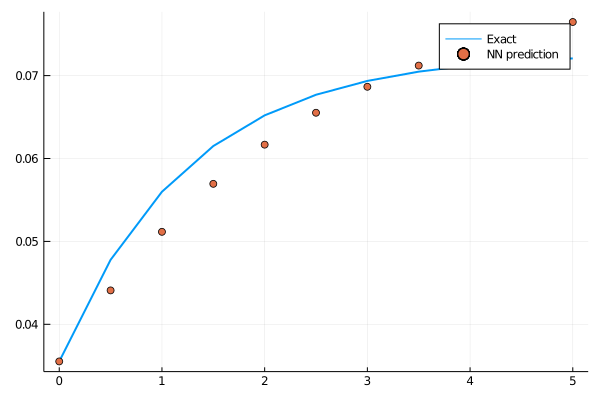

loss: 0.000616:  53%|█████████████████████▉                   |  ETA: 0:00:27

0.0006013393f0

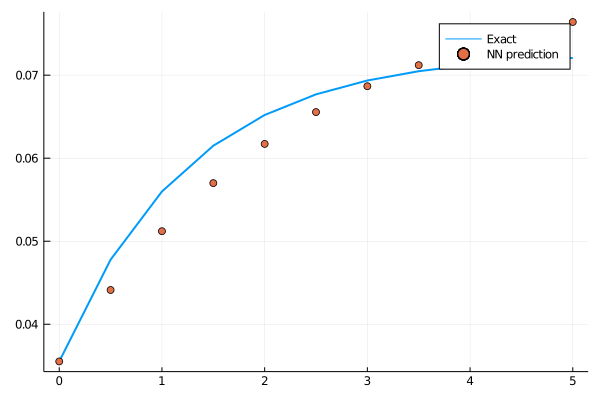

loss: 0.000601:  54%|██████████████████████                   |  ETA: 0:00:27

0.00058741367f0

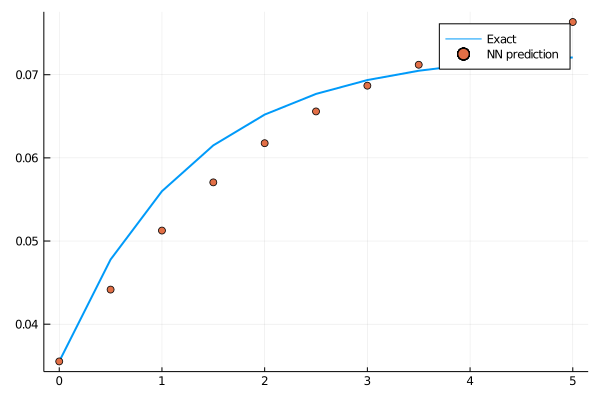

loss: 0.000587:  54%|██████████████████████▏                  |  ETA: 0:00:26

0.0005737747f0

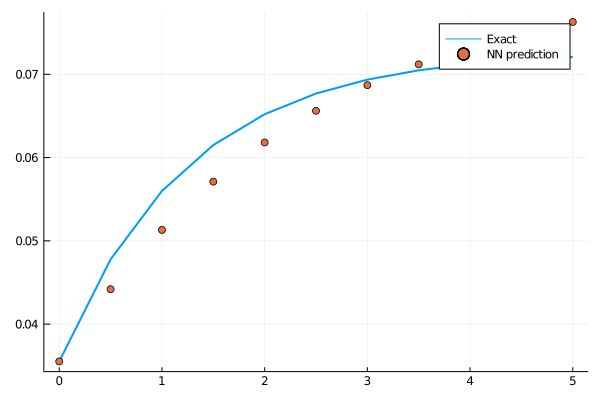

loss: 0.000574:  54%|██████████████████████▎                  |  ETA: 0:00:26

0.00056041655f0

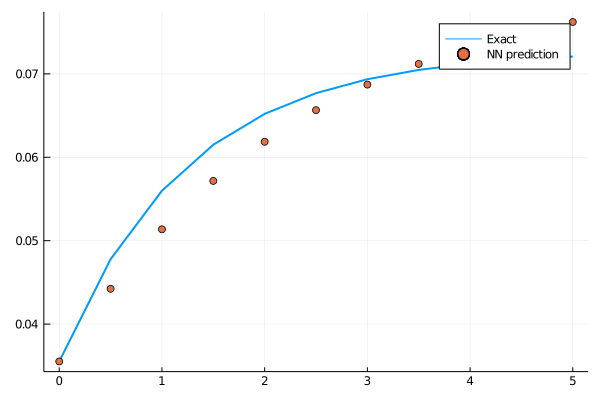

loss: 0.00056:  55%|██████████████████████▍                  |  ETA: 0:00:26

0.0005473319f0

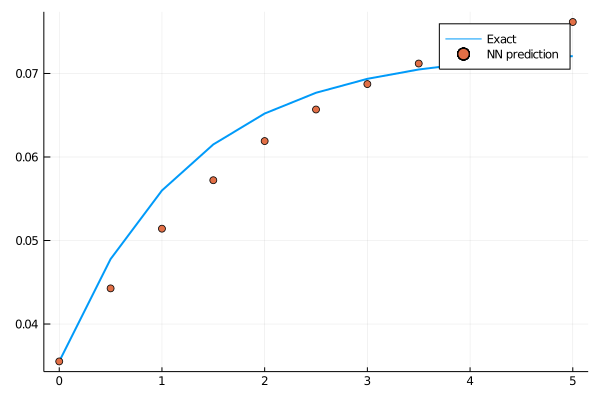

loss: 0.000547:  55%|██████████████████████▌                  |  ETA: 0:00:25

0.0005345192f0

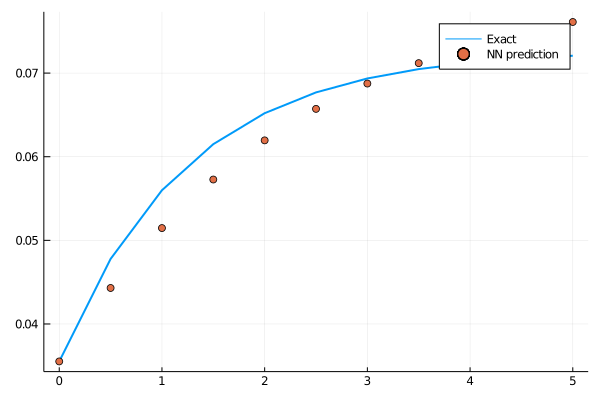

loss: 0.000535:  55%|██████████████████████▋                  |  ETA: 0:00:25

0.00052197336f0

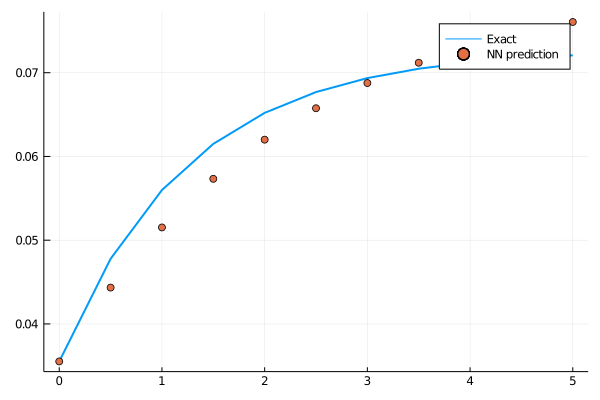

loss: 0.000522:  56%|██████████████████████▊                  |  ETA: 0:00:25

0.0005096903f0

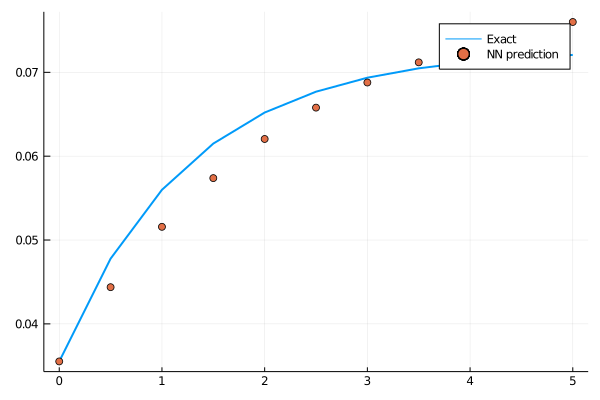

loss: 0.00051:  56%|███████████████████████                  |  ETA: 0:00:25

0.0004976657f0

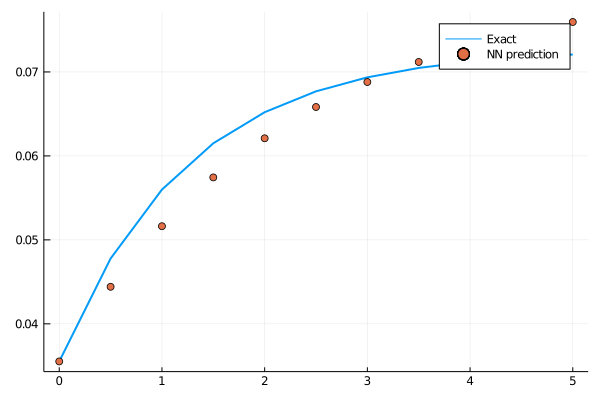

loss: 0.000498:  56%|███████████████████████▏                 |  ETA: 0:00:25

0.0004858935f0

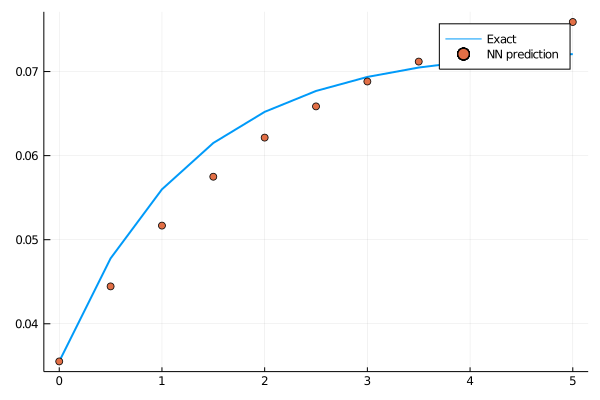

loss: 0.000486:  57%|███████████████████████▎                 |  ETA: 0:00:24

0.00047437084f0

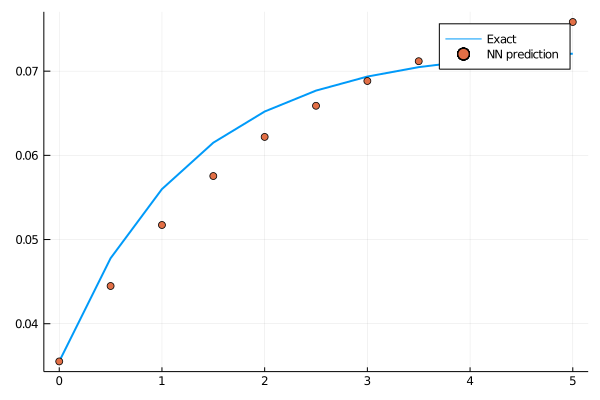

loss: 0.000474:  57%|███████████████████████▍                 |  ETA: 0:00:24

0.0004630929f0

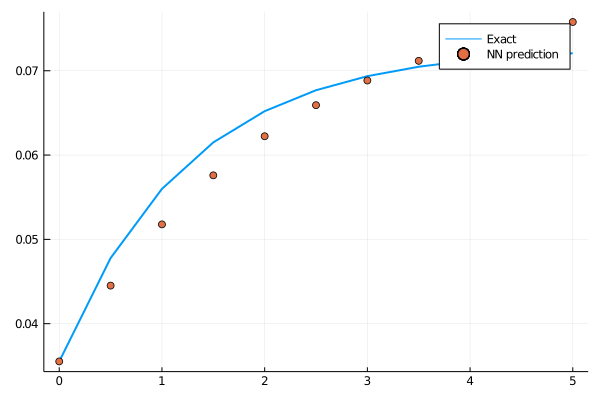

loss: 0.000463:  57%|███████████████████████▌                 |  ETA: 0:00:24

0.00045205597f0

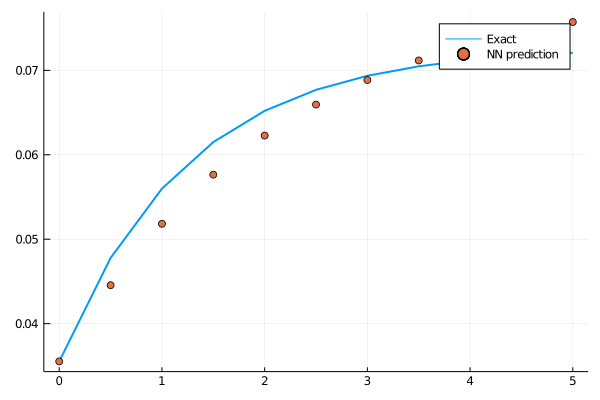

loss: 0.000452:  58%|███████████████████████▋                 |  ETA: 0:00:24

0.00044125482f0

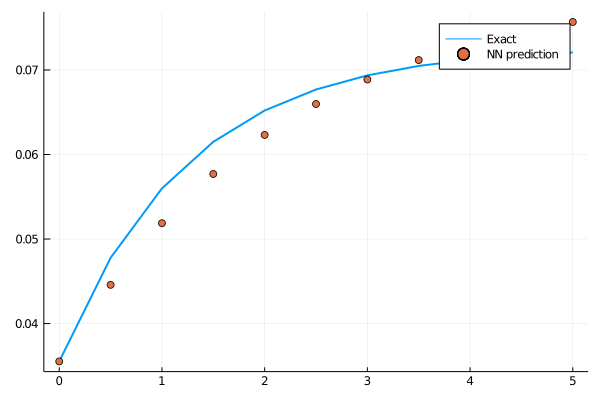

loss: 0.000441:  58%|███████████████████████▊                 |  ETA: 0:00:23

0.0004306867f0

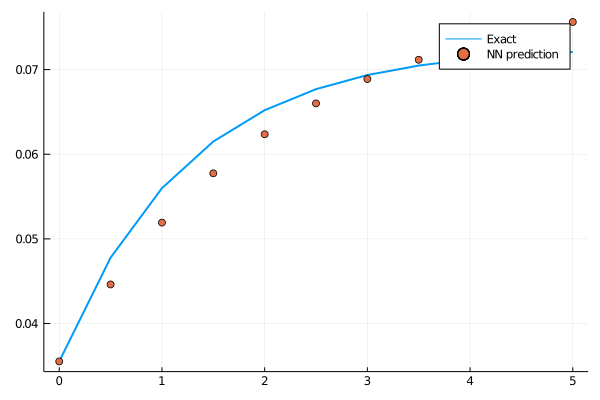

loss: 0.000431:  58%|███████████████████████▉                 |  ETA: 0:00:23

0.0004203454f0

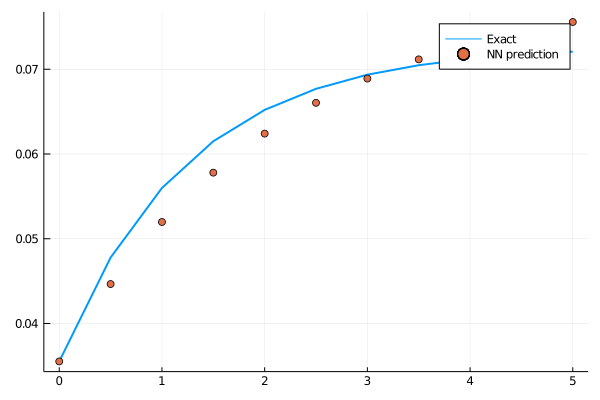

loss: 0.00042:  59%|████████████████████████                 |  ETA: 0:00:23

0.0004102286f0

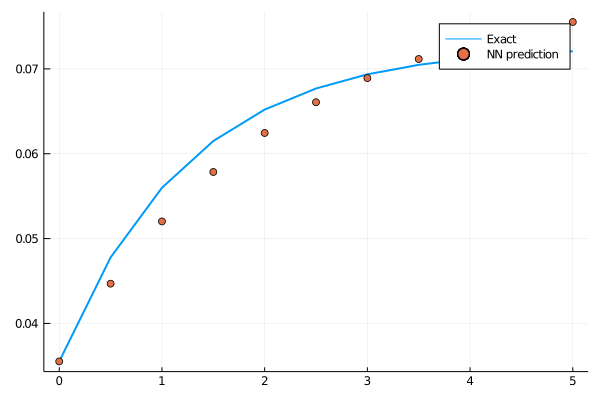

loss: 0.00041:  59%|████████████████████████▎                |  ETA: 0:00:23

0.00040033145f0

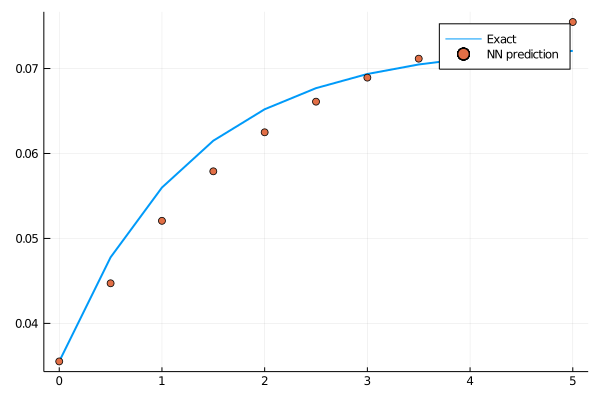

loss: 0.0004:  59%|████████████████████████▍                |  ETA: 0:00:23

0.00039065257f0

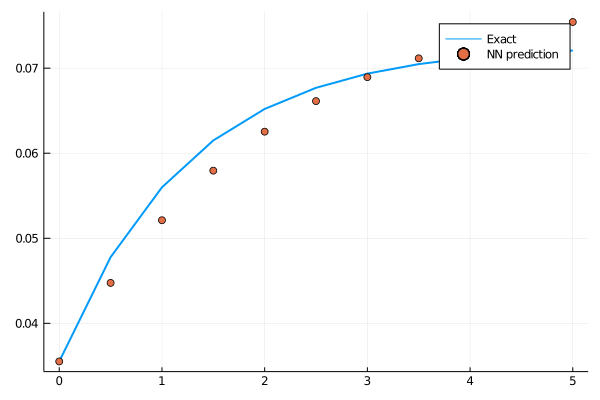

loss: 0.000391:  60%|████████████████████████▍                |  ETA: 0:00:22

0.00038118372f0

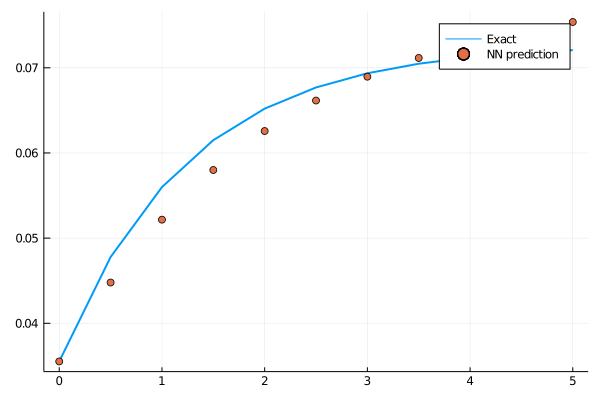

loss: 0.000381:  60%|████████████████████████▋                |  ETA: 0:00:22

0.00037192012f0

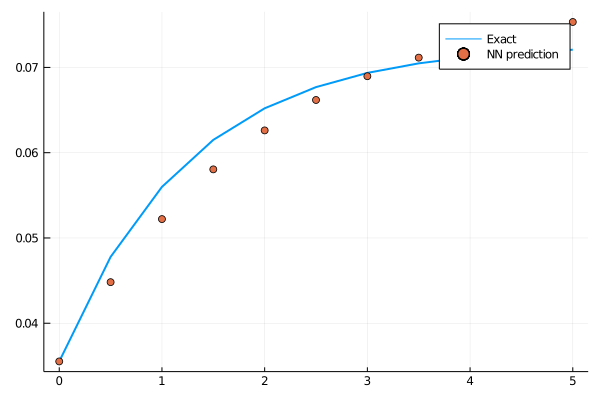

loss: 0.000372:  60%|████████████████████████▊                |  ETA: 0:00:22

0.0003628636f0

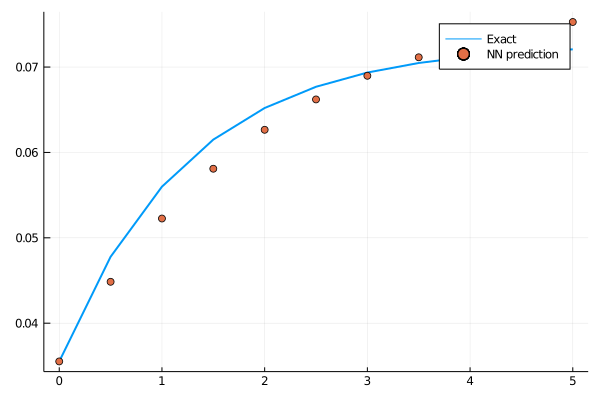

loss: 0.000363:  61%|████████████████████████▉                |  ETA: 0:00:22

0.0003540055f0

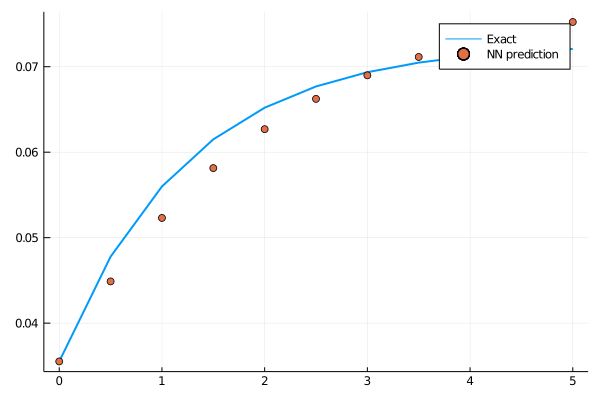

loss: 0.000354:  61%|█████████████████████████                |  ETA: 0:00:21

0.0003453439f0

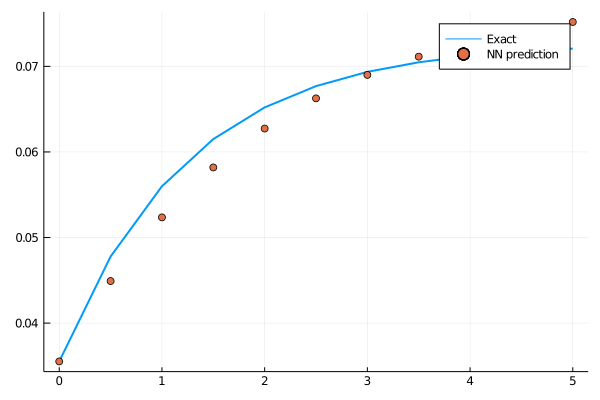

loss: 0.000345:  61%|█████████████████████████▏               |  ETA: 0:00:21

0.00033687457f0

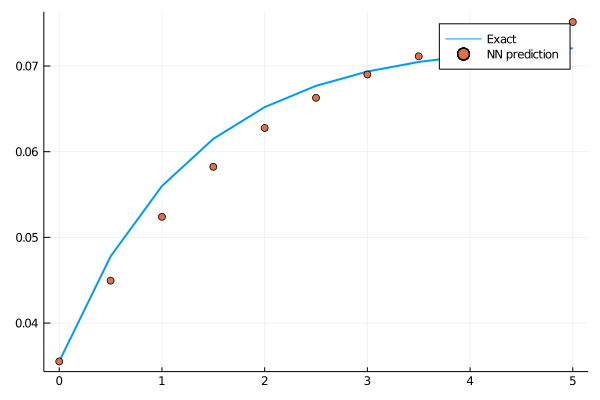

loss: 0.000337:  62%|█████████████████████████▎               |  ETA: 0:00:21

0.0003285947f0

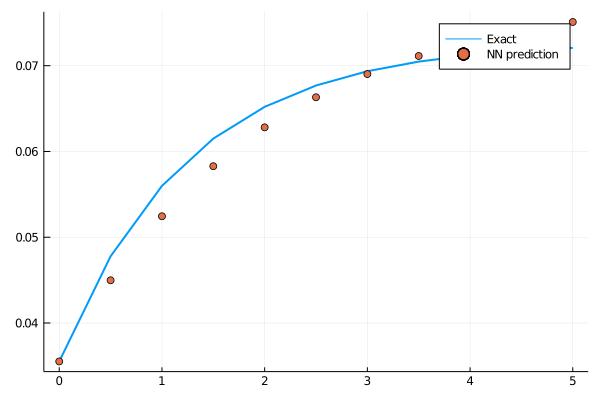

loss: 0.000329:  62%|█████████████████████████▍               |  ETA: 0:00:21

0.00032050032f0

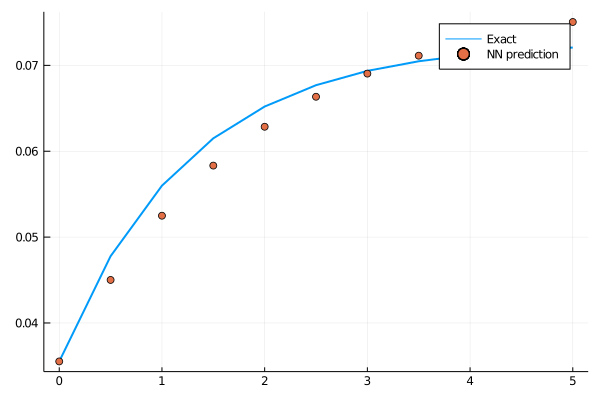

loss: 0.000321:  62%|█████████████████████████▌               |  ETA: 0:00:21

0.0003125877f0

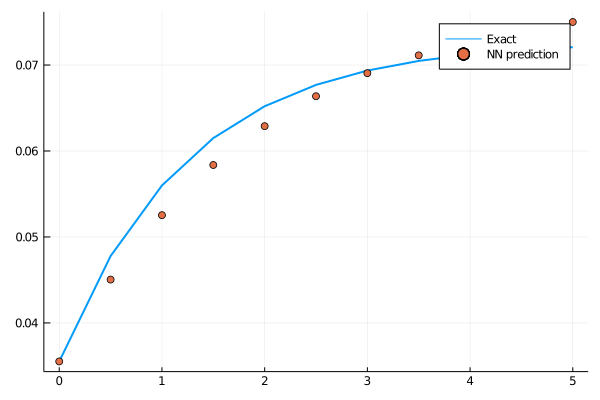

loss: 0.000313:  63%|█████████████████████████▋               |  ETA: 0:00:20

0.00030485334f0

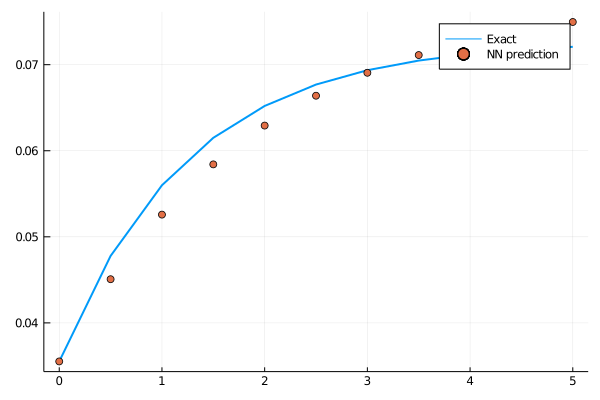

loss: 0.000305:  63%|█████████████████████████▉               |  ETA: 0:00:20

0.0002972938f0

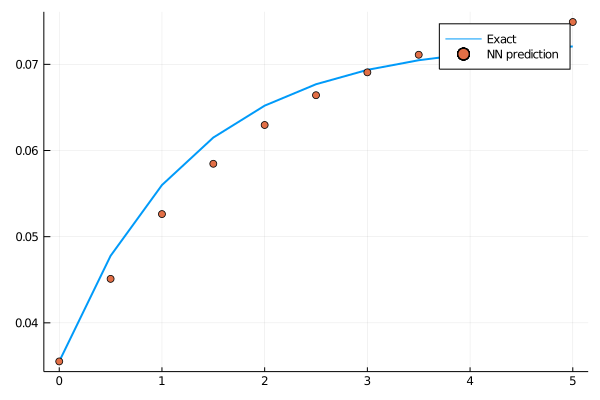

loss: 0.000297:  63%|██████████████████████████               |  ETA: 0:00:20

0.00028990608f0

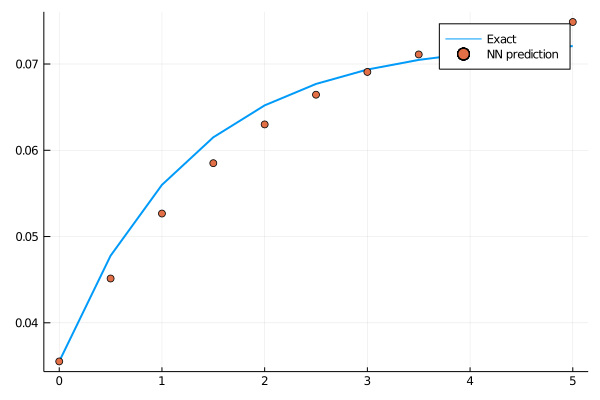

loss: 0.00029:  64%|██████████████████████████▏              |  ETA: 0:00:20

0.00028268585f0

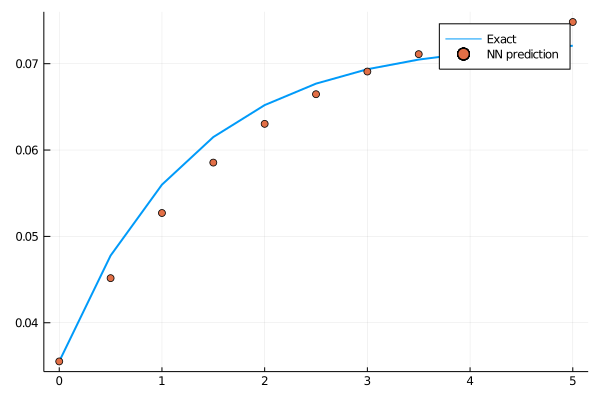

loss: 0.000283:  64%|██████████████████████████▎              |  ETA: 0:00:20

0.00027563077f0

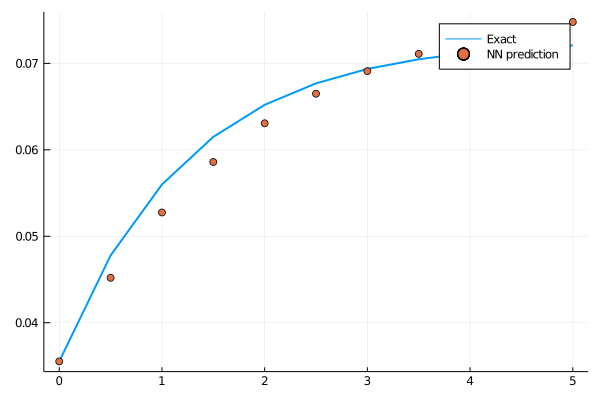

loss: 0.000276:  64%|██████████████████████████▍              |  ETA: 0:00:19

0.00026873764f0

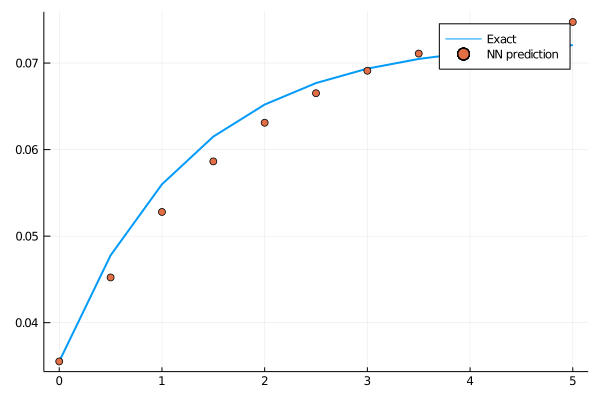

loss: 0.000269:  65%|██████████████████████████▌              |  ETA: 0:00:19

0.00026200234f0

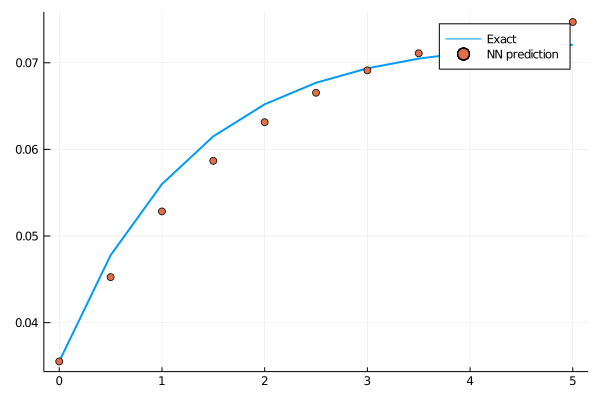

loss: 0.000262:  65%|██████████████████████████▋              |  ETA: 0:00:19

0.0002554222f0

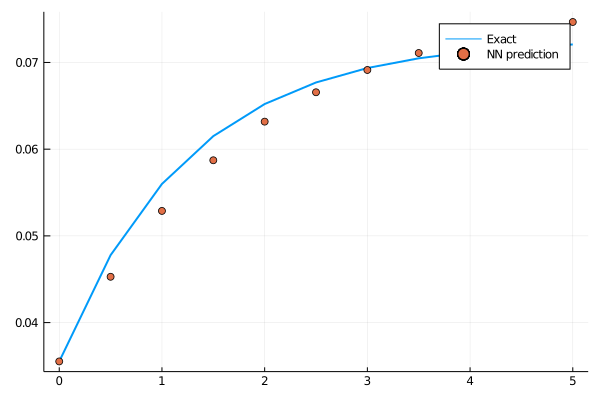

loss: 0.000255:  65%|██████████████████████████▊              |  ETA: 0:00:19

0.00024899462f0

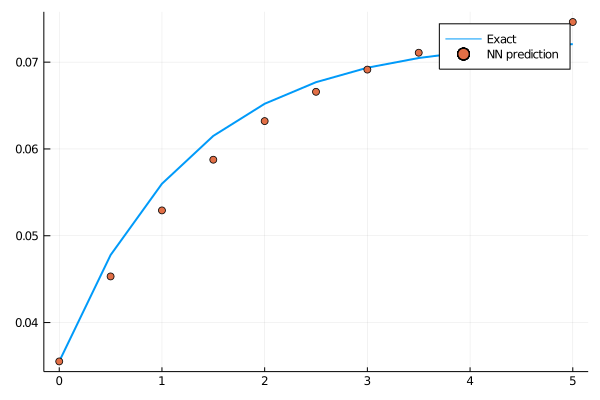

loss: 0.000249:  66%|██████████████████████████▉              |  ETA: 0:00:19

0.00024271596f0

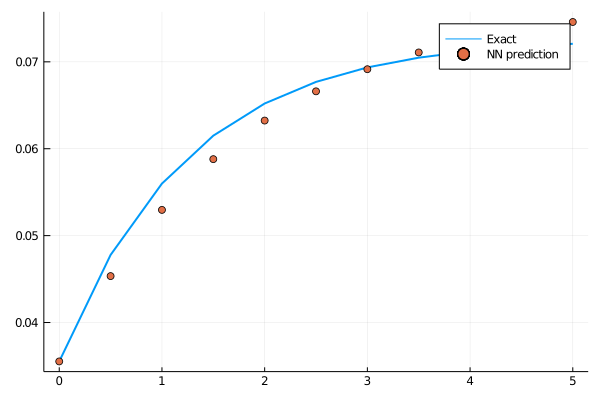

loss: 0.000243:  66%|███████████████████████████              |  ETA: 0:00:18

0.00023658316f0

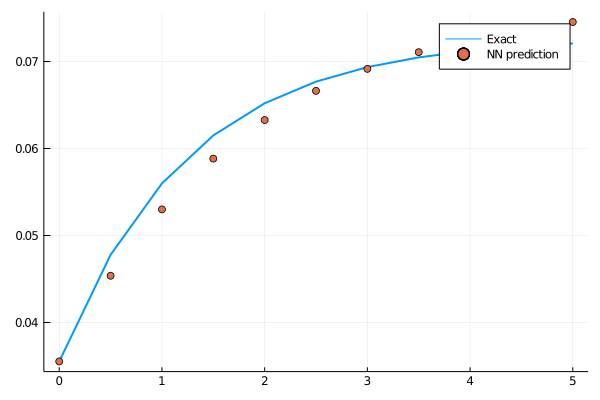

loss: 0.000237:  66%|███████████████████████████▏             |  ETA: 0:00:18

0.00023059353f0

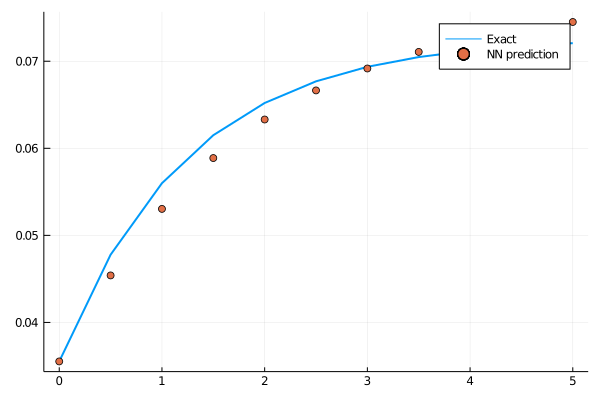

loss: 0.000231:  67%|███████████████████████████▎             |  ETA: 0:00:18

0.00022474406f0

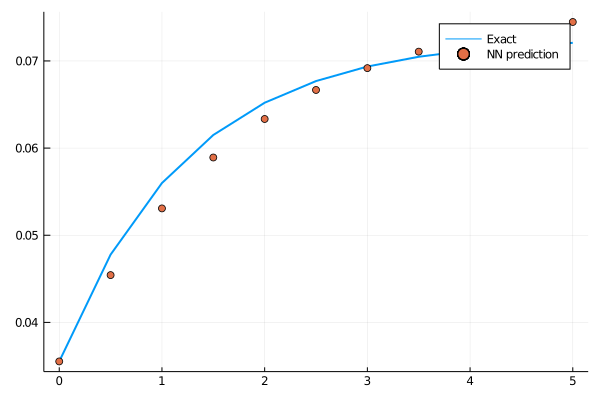

loss: 0.000225:  67%|███████████████████████████▌             |  ETA: 0:00:18

0.00021903196f0

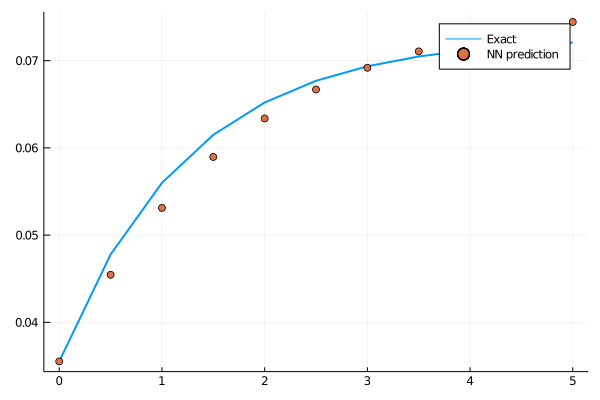

loss: 0.000219:  67%|███████████████████████████▋             |  ETA: 0:00:17

0.0002134546f0

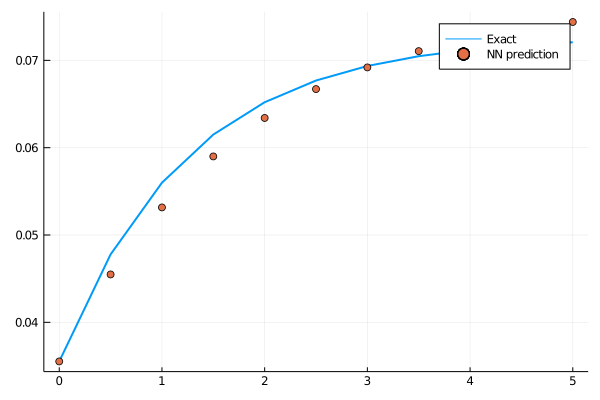

loss: 0.000213:  68%|███████████████████████████▊             |  ETA: 0:00:17

0.00020800885f0

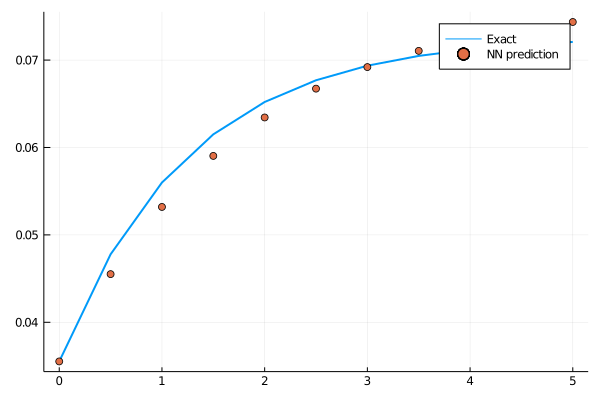

loss: 0.000208:  68%|███████████████████████████▉             |  ETA: 0:00:17

0.00020269188f0

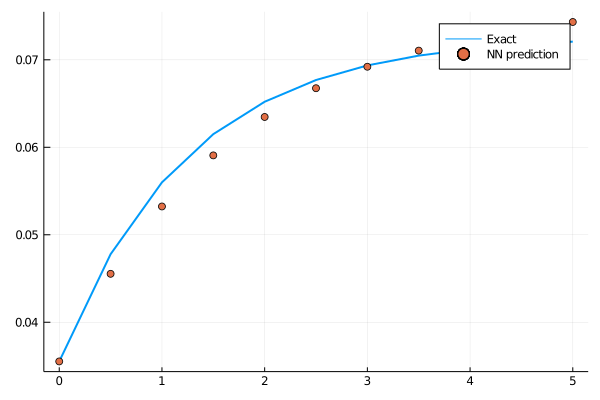

loss: 0.000203:  68%|████████████████████████████             |  ETA: 0:00:17

0.0001975012f0

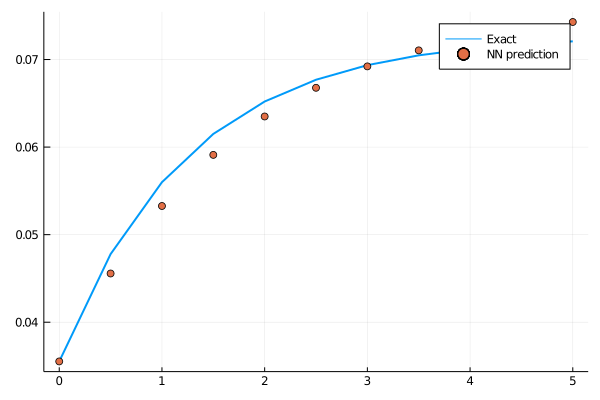

loss: 0.000198:  69%|████████████████████████████▏            |  ETA: 0:00:17

0.00019243402f0

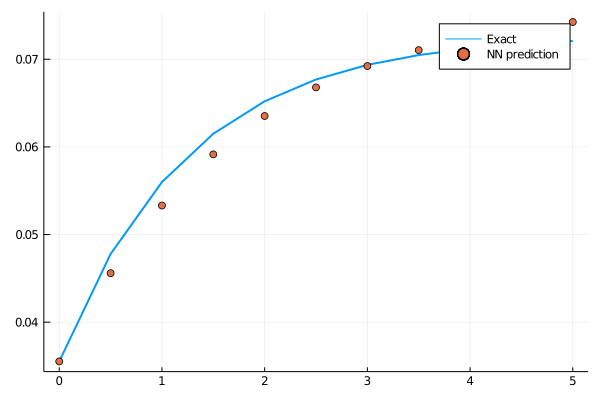

loss: 0.000192:  69%|████████████████████████████▎            |  ETA: 0:00:17

0.0001874884f0

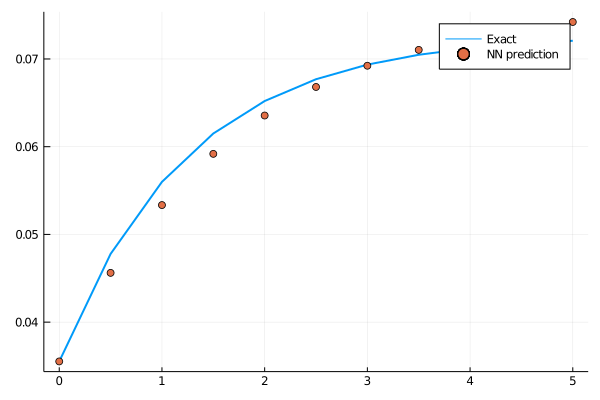

loss: 0.000187:  69%|████████████████████████████▍            |  ETA: 0:00:16

0.00018266149f0

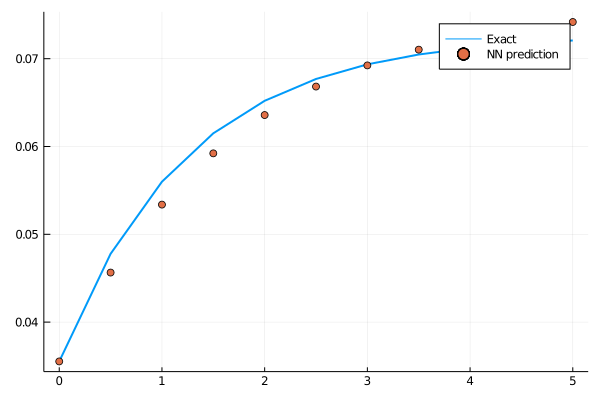

loss: 0.000183:  70%|████████████████████████████▌            |  ETA: 0:00:16

0.0001779503f0

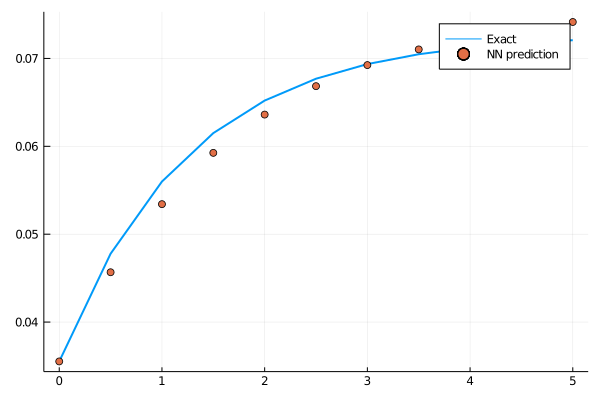

loss: 0.000178:  70%|████████████████████████████▊            |  ETA: 0:00:16

0.0001733525f0

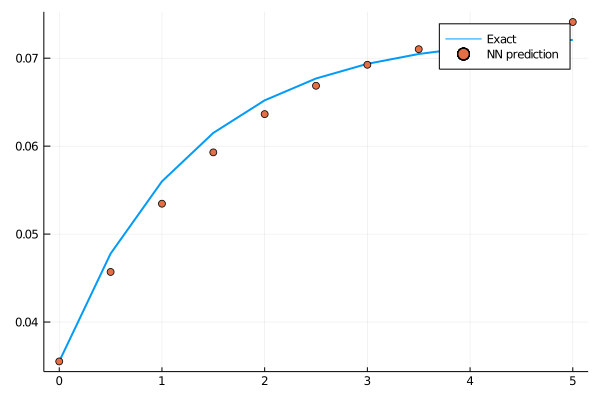

loss: 0.000173:  70%|████████████████████████████▉            |  ETA: 0:00:16

0.00016886607f0

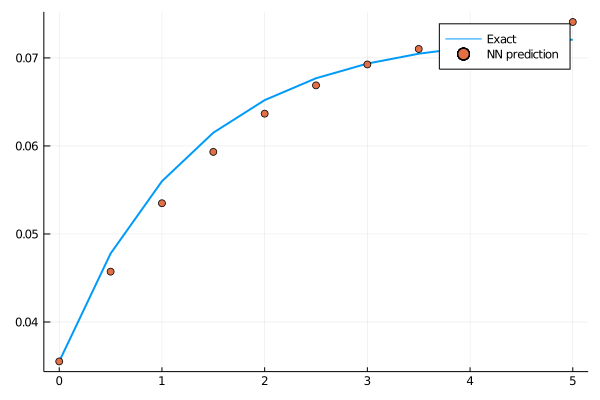

loss: 0.000169:  71%|█████████████████████████████            |  ETA: 0:00:16

0.00016448849f0

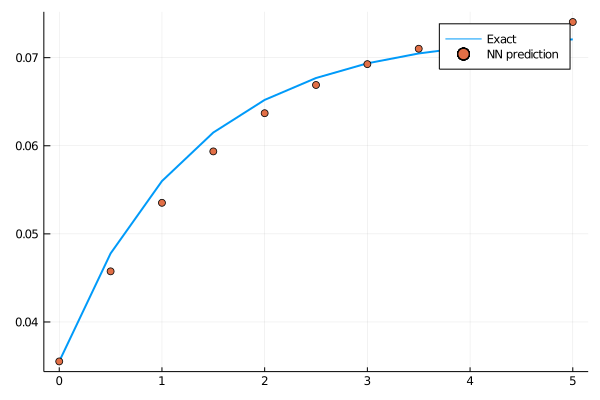

loss: 0.000164:  71%|█████████████████████████████▏           |  ETA: 0:00:15

0.00016021747f0

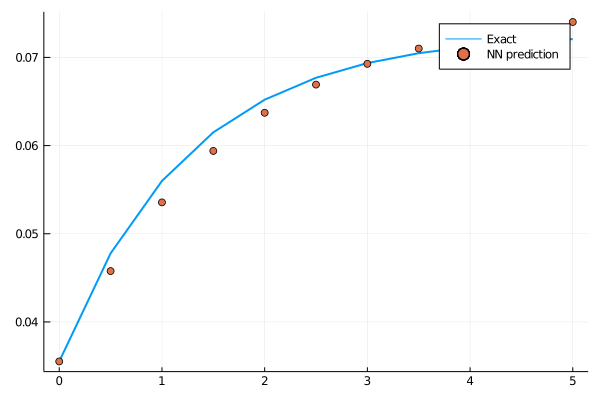

loss: 0.00016:  71%|█████████████████████████████▎           |  ETA: 0:00:15

0.00015605053f0

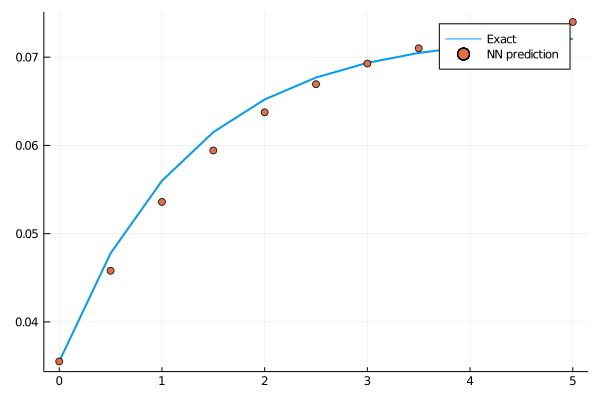

loss: 0.000156:  72%|█████████████████████████████▍           |  ETA: 0:00:15

0.00015198532f0

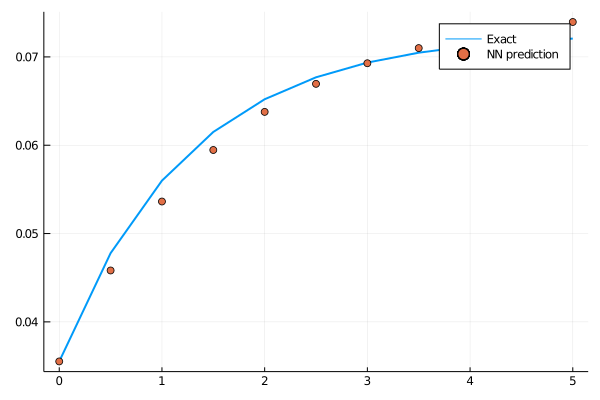

loss: 0.000152:  72%|█████████████████████████████▌           |  ETA: 0:00:15

0.00014801988f0

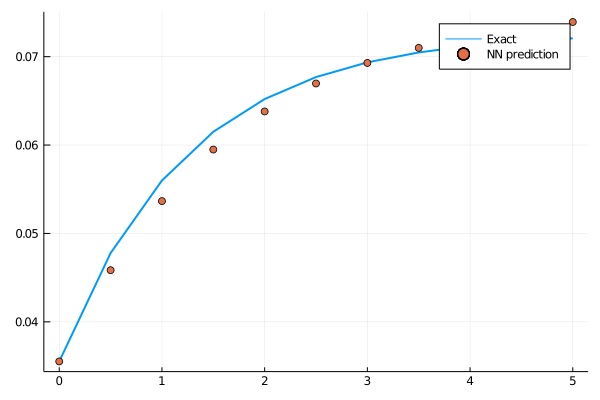

loss: 0.000148:  72%|█████████████████████████████▋           |  ETA: 0:00:15

0.00014415209f0

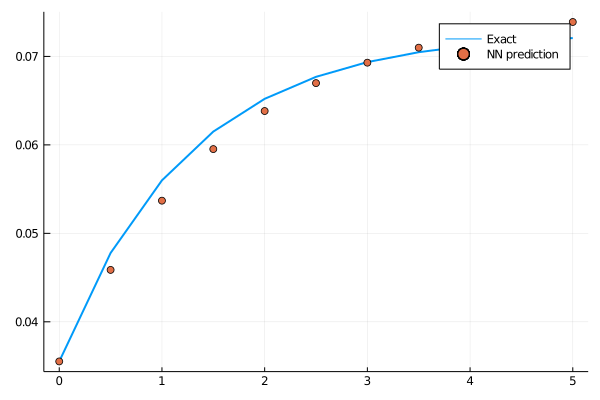

loss: 0.000144:  73%|█████████████████████████████▊           |  ETA: 0:00:15

0.0001403795f0

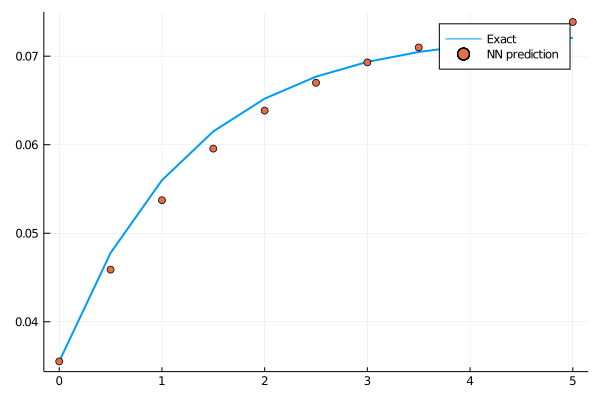

loss: 0.00014:  73%|█████████████████████████████▉           |  ETA: 0:00:14

0.0001367002f0

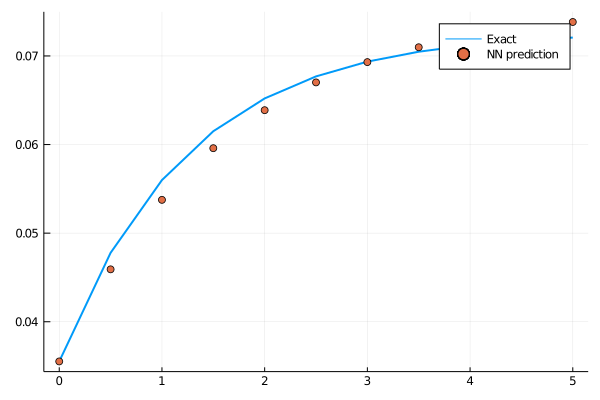

loss: 0.000137:  73%|██████████████████████████████           |  ETA: 0:00:14

0.00013311242f0

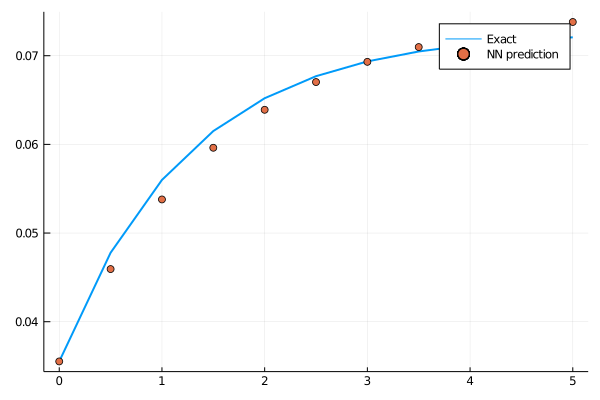

loss: 0.000133:  74%|██████████████████████████████▏          |  ETA: 0:00:14

0.00012961339f0

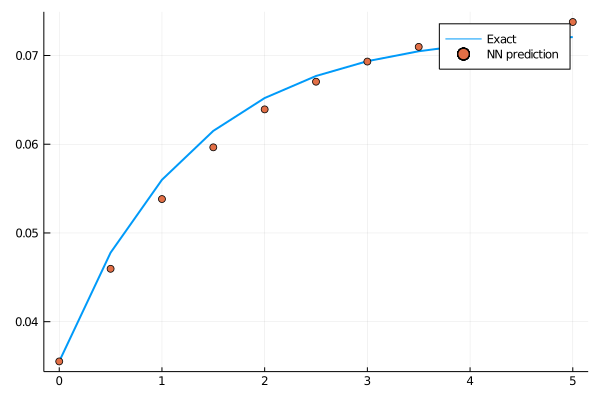

loss: 0.00013:  74%|██████████████████████████████▍          |  ETA: 0:00:14

0.00012620229f0

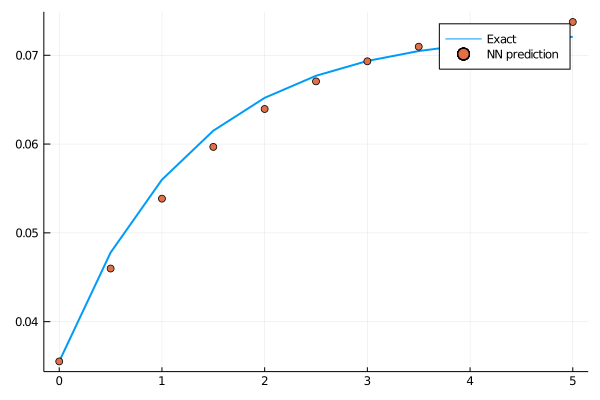

loss: 0.000126:  74%|██████████████████████████████▌          |  ETA: 0:00:14

0.00012287592f0

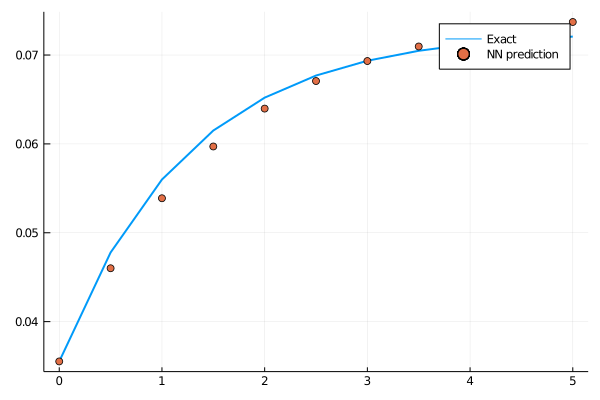

loss: 0.000123:  75%|██████████████████████████████▋          |  ETA: 0:00:13

0.00011963256f0

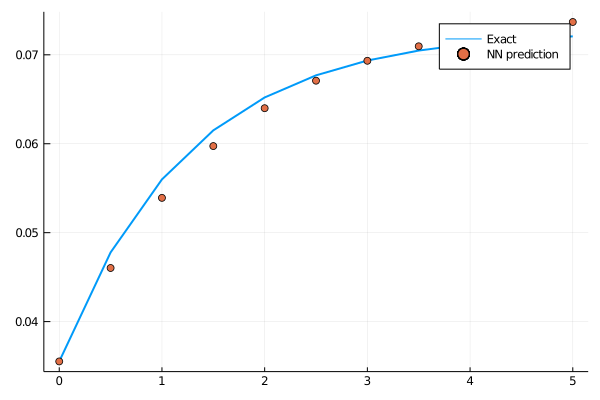

loss: 0.00012:  75%|██████████████████████████████▊          |  ETA: 0:00:13

0.00011647076f0

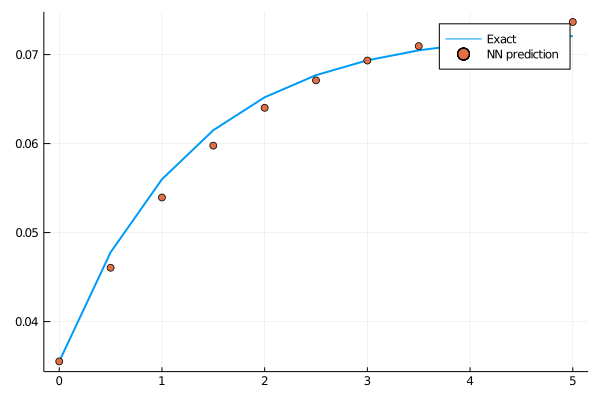

loss: 0.000116:  75%|██████████████████████████████▉          |  ETA: 0:00:13

0.000113389375f0

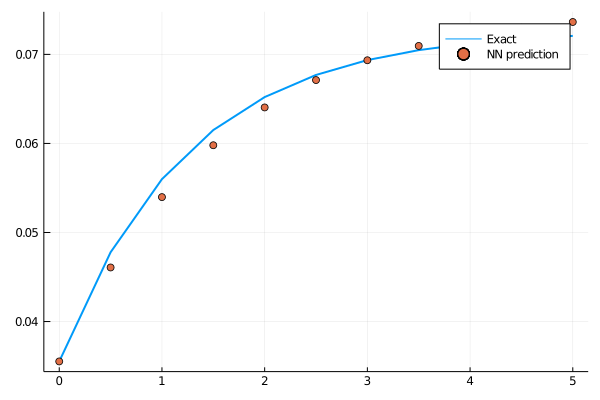

loss: 0.000113:  76%|███████████████████████████████          |  ETA: 0:00:13

0.000110385015f0

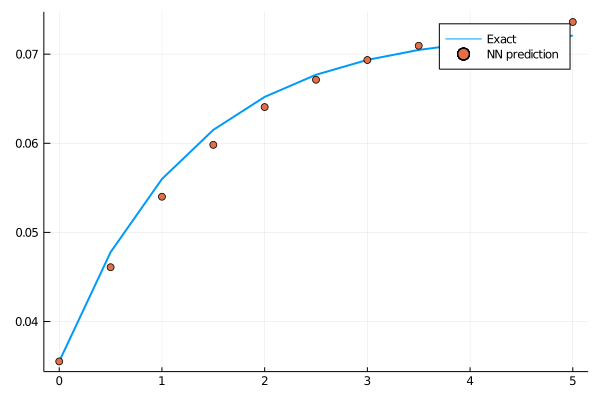

loss: 0.00011:  76%|███████████████████████████████▏         |  ETA: 0:00:13

0.00010745685f0

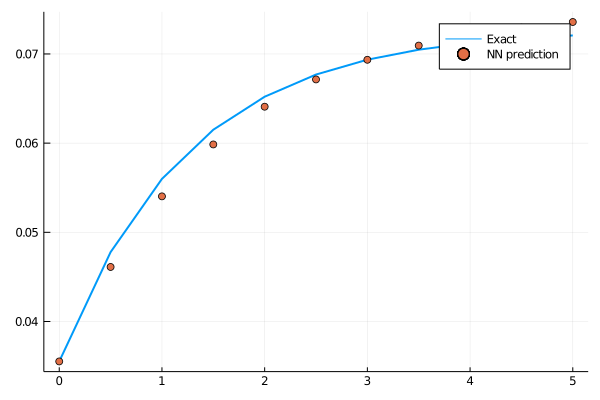

loss: 0.000107:  76%|███████████████████████████████▎         |  ETA: 0:00:12

0.000104603314f0

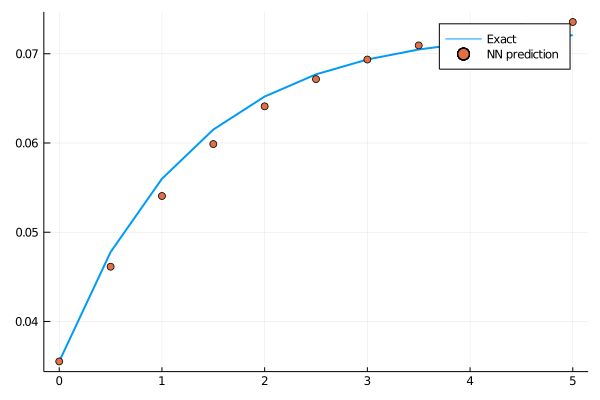

loss: 0.000105:  77%|███████████████████████████████▍         |  ETA: 0:00:12

0.00010182219f0

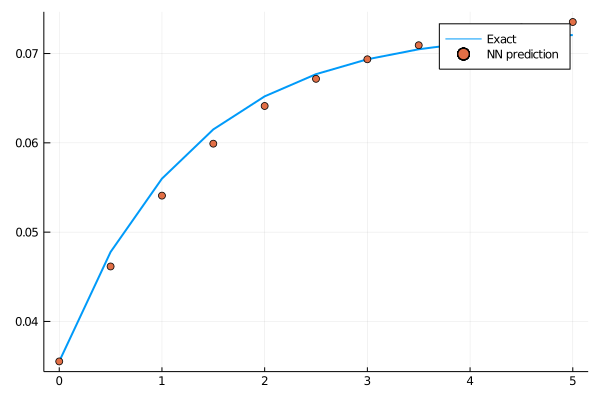

loss: 0.000102:  77%|███████████████████████████████▋         |  ETA: 0:00:12

9.911198f-5

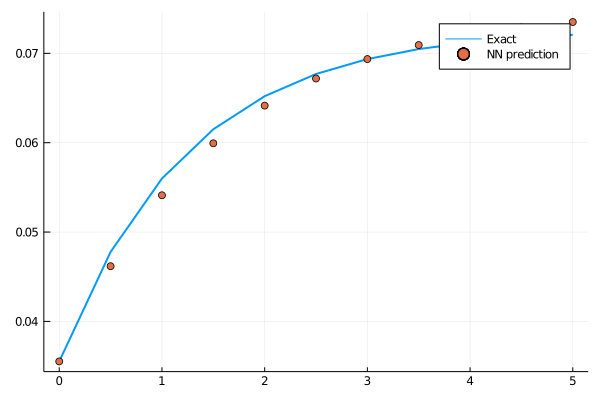

loss: 9.91e-05:  77%|███████████████████████████████▊         |  ETA: 0:00:12

9.647095f-5

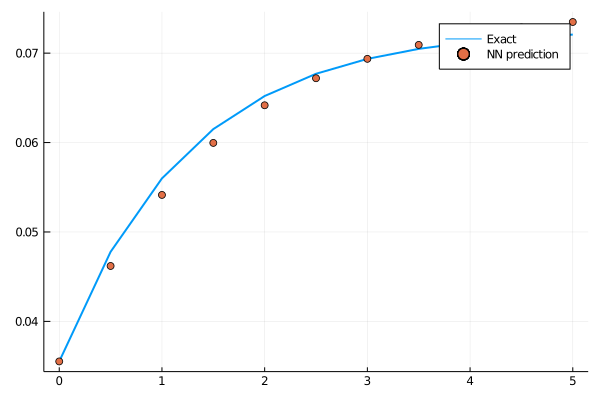

loss: 9.65e-05:  78%|███████████████████████████████▉         |  ETA: 0:00:12

9.3897215f-5

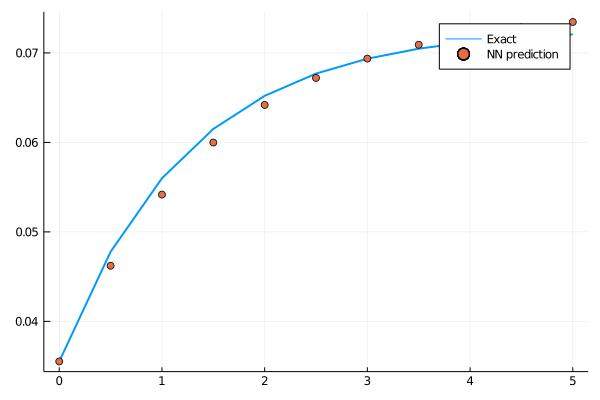

loss: 9.39e-05:  78%|████████████████████████████████         |  ETA: 0:00:12

9.1390255f-5

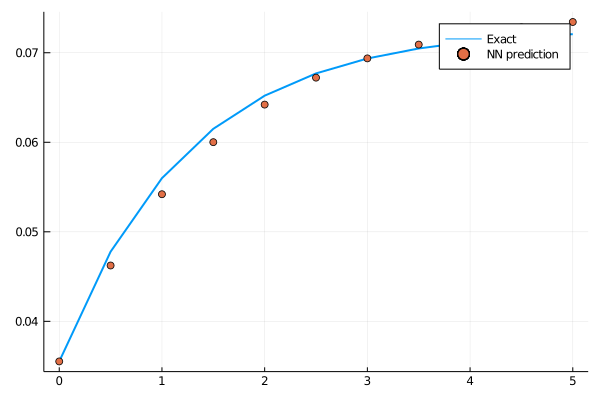

loss: 9.14e-05:  78%|████████████████████████████████▏        |  ETA: 0:00:11

8.8947636f-5

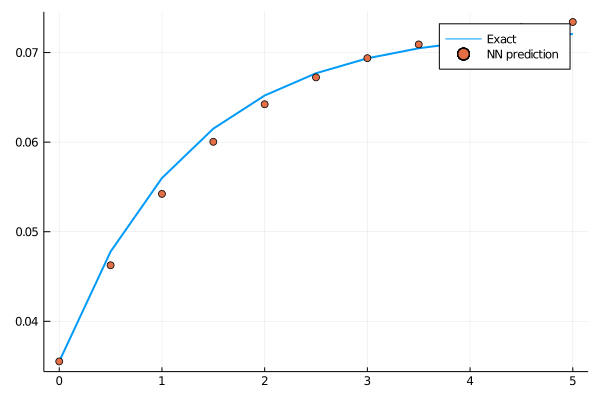

loss: 8.89e-05:  79%|████████████████████████████████▎        |  ETA: 0:00:11

8.6568056f-5

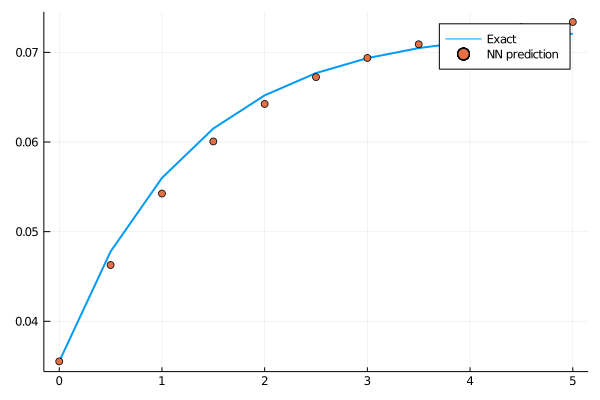

loss: 8.66e-05:  79%|████████████████████████████████▍        |  ETA: 0:00:11

8.425014f-5

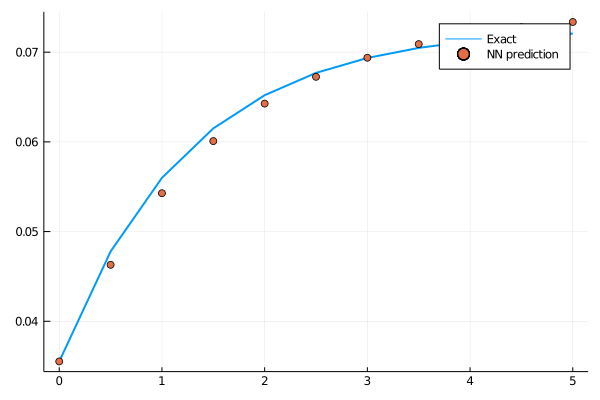

loss: 8.43e-05:  79%|████████████████████████████████▌        |  ETA: 0:00:11

8.199185f-5

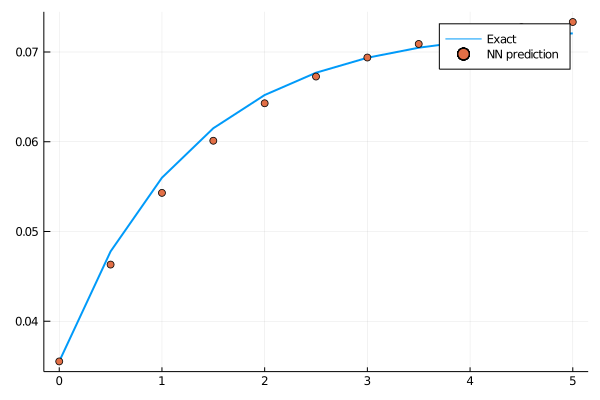

loss: 8.2e-05:  80%|████████████████████████████████▋        |  ETA: 0:00:11

7.979291f-5

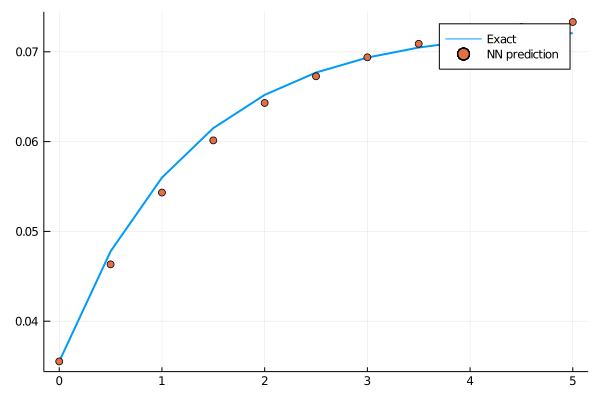

loss: 7.98e-05:  80%|████████████████████████████████▊        |  ETA: 0:00:11

7.7650984f-5

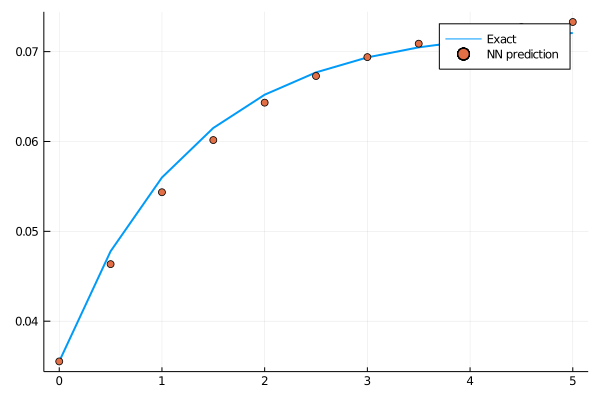

7.556473f-5

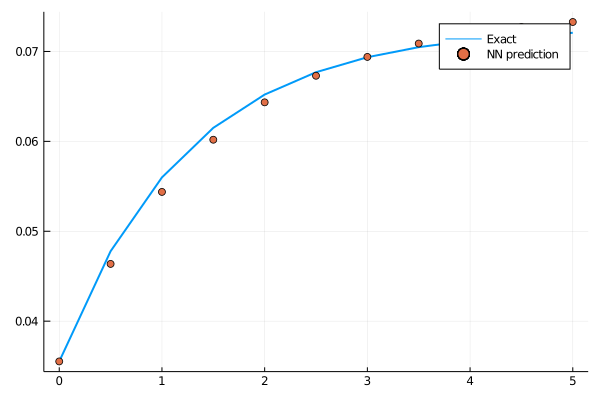

loss: 7.56e-05:  81%|█████████████████████████████████        |  ETA: 0:00:10

7.353341f-5

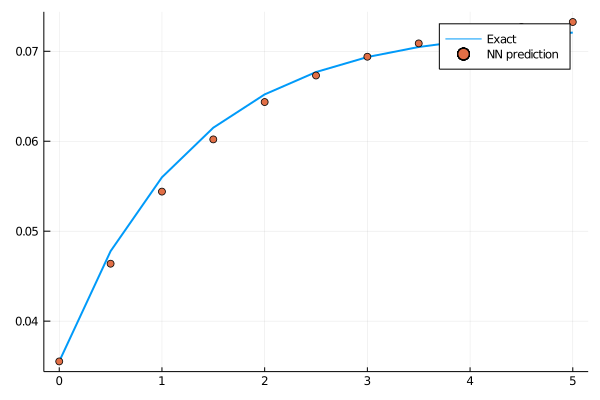

loss: 7.35e-05:  81%|█████████████████████████████████▎       |  ETA: 0:00:10

7.1555216f-5

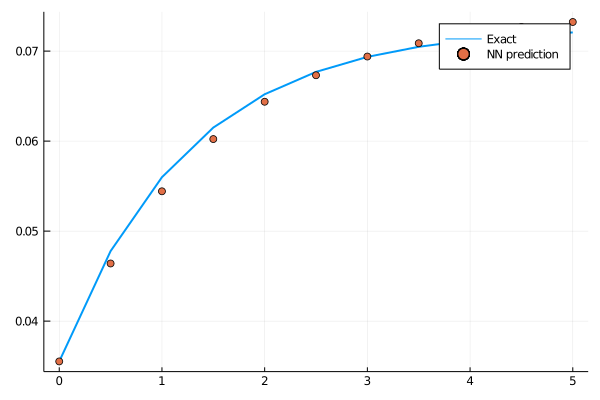

loss: 7.16e-05:  81%|█████████████████████████████████▍       |  ETA: 0:00:10

6.962911f-5

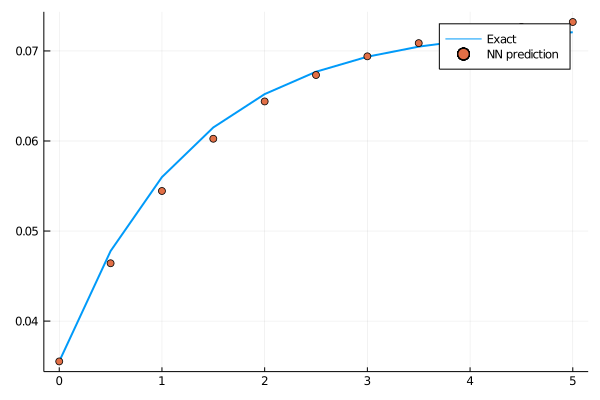

6.775341f-5

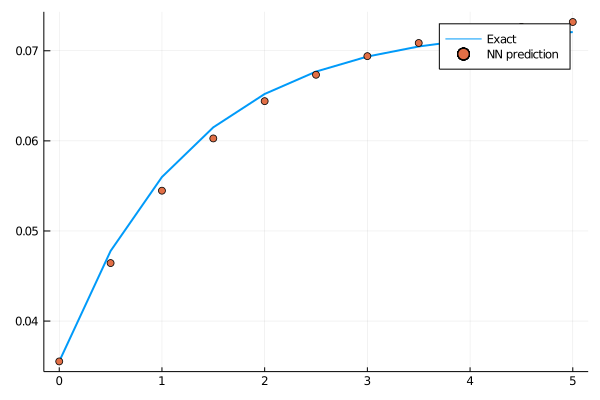

loss: 6.78e-05:  82%|█████████████████████████████████▋       |  ETA: 0:00:09

6.592765f-5

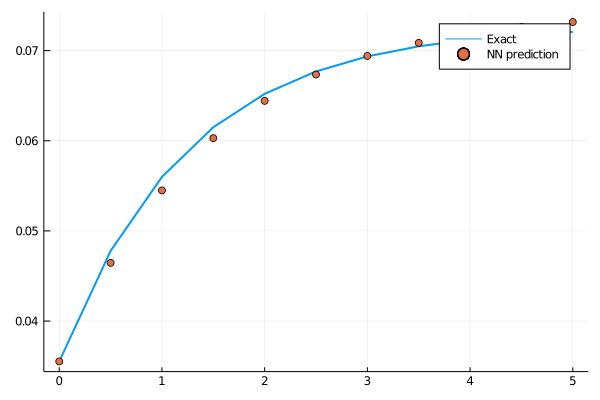

loss: 6.59e-05:  82%|█████████████████████████████████▊       |  ETA: 0:00:09

6.415017f-5

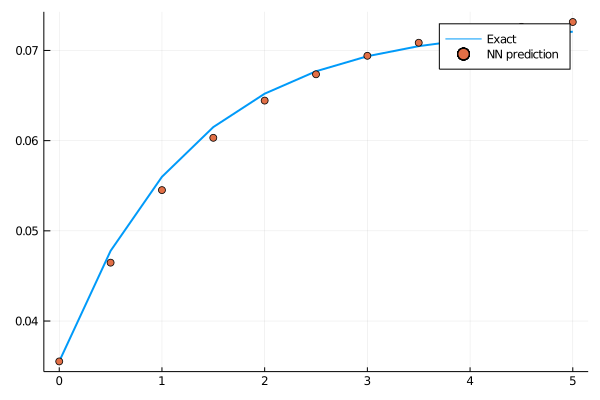

6.241963f-5

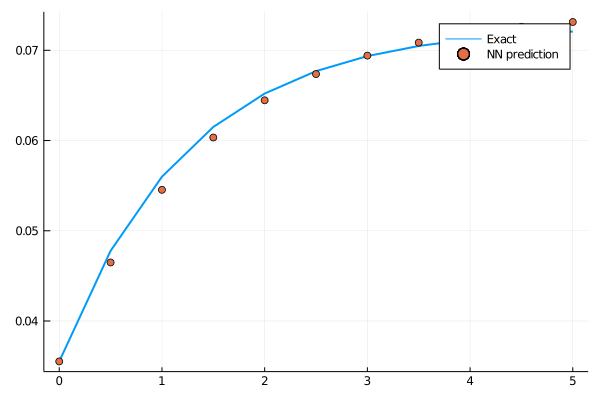

loss: 6.24e-05:  83%|██████████████████████████████████       |  ETA: 0:00:09

6.073508f-5

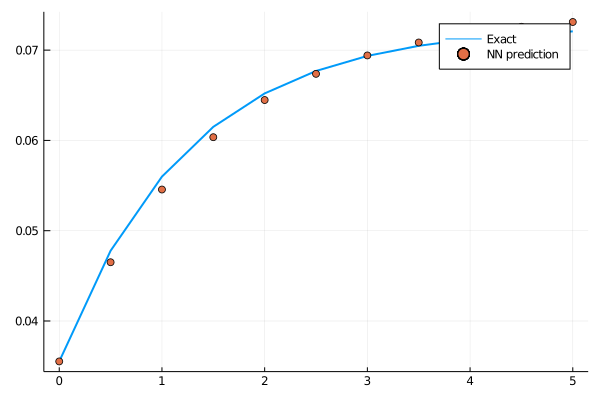

5.909537f-5

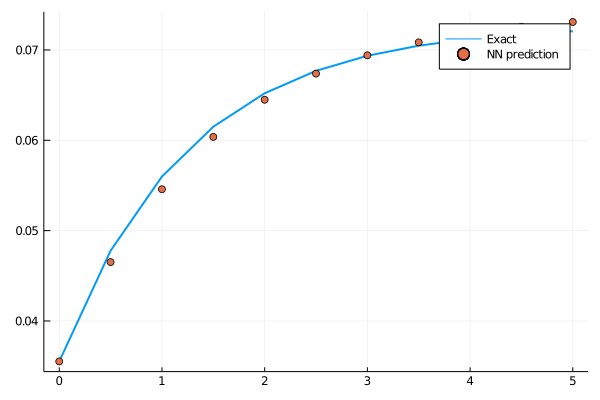

loss: 5.91e-05:  84%|██████████████████████████████████▎      |  ETA: 0:00:08

5.7499543f-5

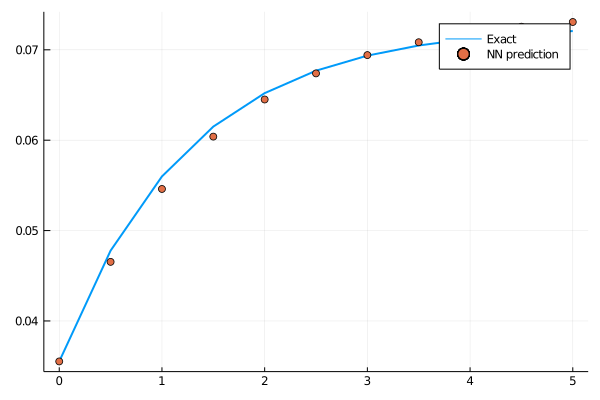

loss: 5.75e-05:  84%|██████████████████████████████████▌      |  ETA: 0:00:08

5.5946242f-5

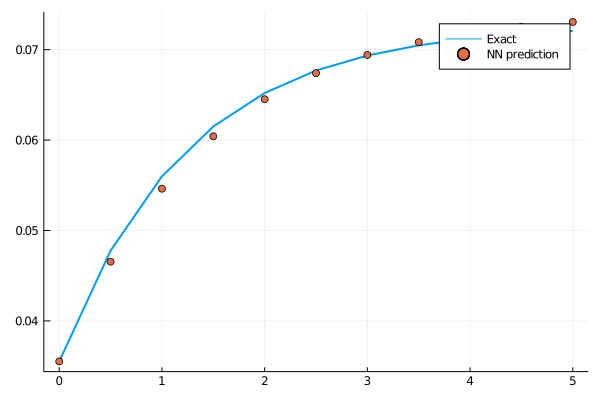

5.4434557f-5

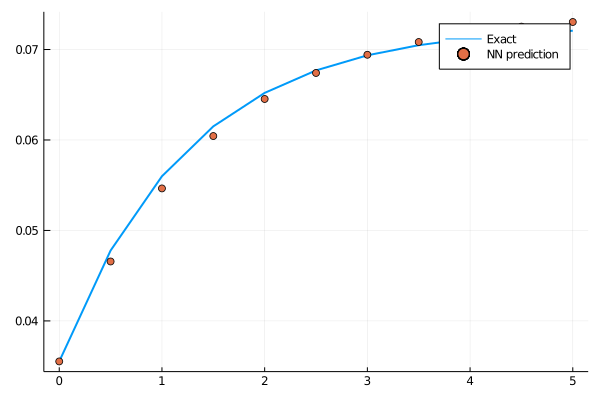

loss: 5.44e-05:  85%|██████████████████████████████████▋      |  ETA: 0:00:08

5.2963525f-5

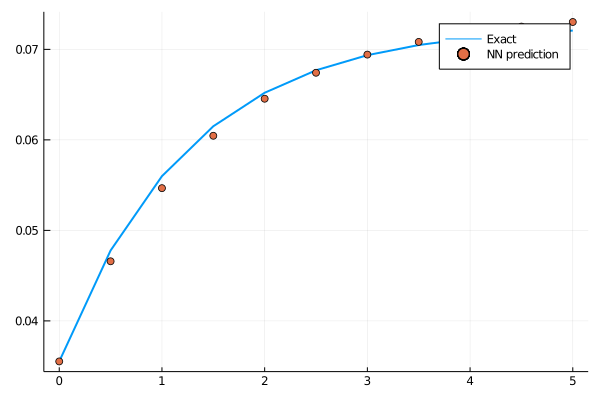

loss: 5.3e-05:  85%|██████████████████████████████████▉      |  ETA: 0:00:08

5.1532068f-5

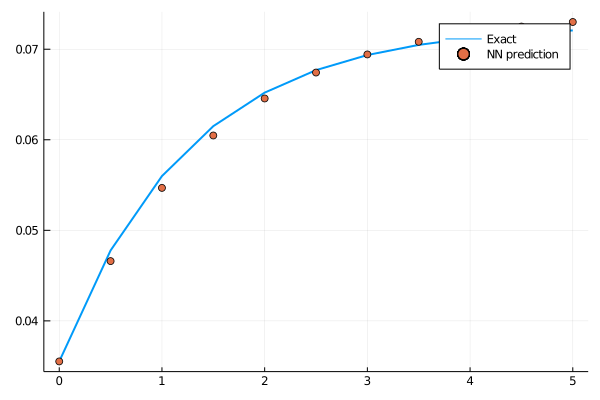

loss: 5.15e-05:  85%|███████████████████████████████████      |  ETA: 0:00:08

5.013936f-5

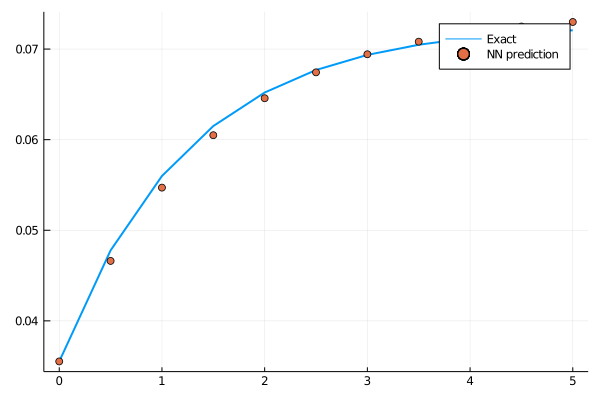

loss: 5.01e-05:  86%|███████████████████████████████████▏     |  ETA: 0:00:07

4.8783895f-5

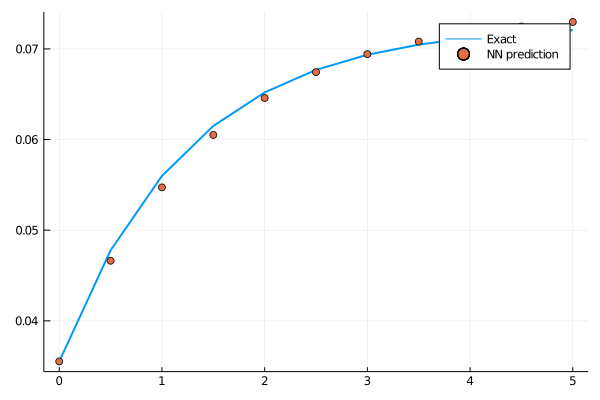

loss: 4.88e-05:  86%|███████████████████████████████████▎     |  ETA: 0:00:07

4.7465335f-5

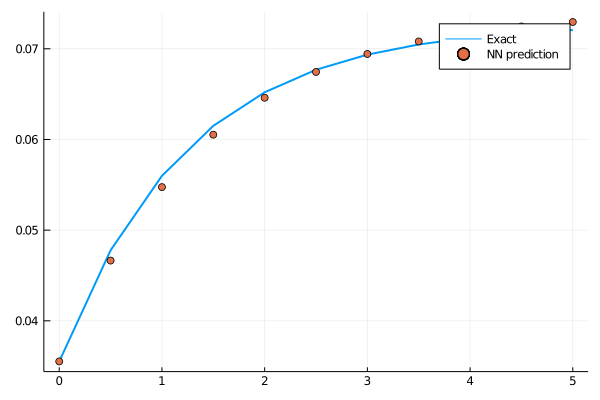

loss: 4.75e-05:  86%|███████████████████████████████████▍     |  ETA: 0:00:07

4.6182504f-5

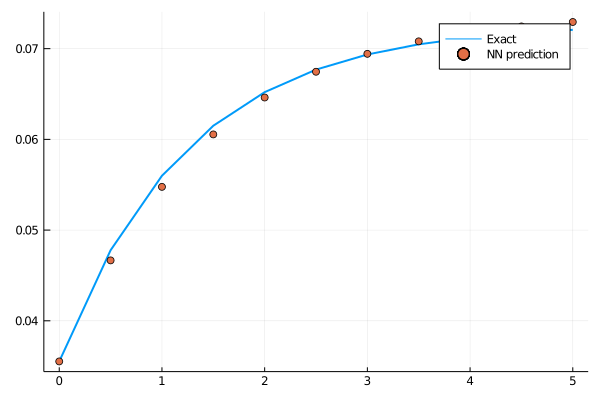

loss: 4.62e-05:  87%|███████████████████████████████████▌     |  ETA: 0:00:07

4.493446f-5

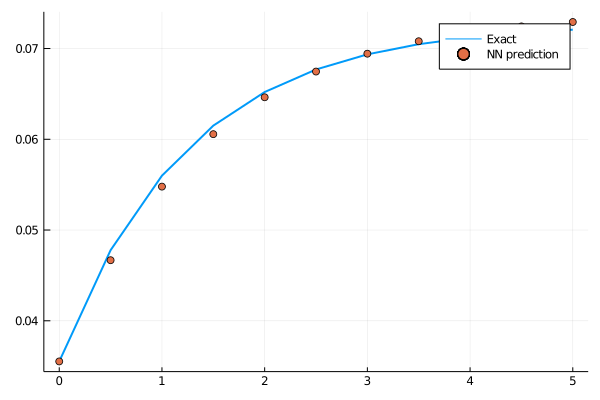

loss: 4.49e-05:  87%|███████████████████████████████████▋     |  ETA: 0:00:07

4.3720658f-5

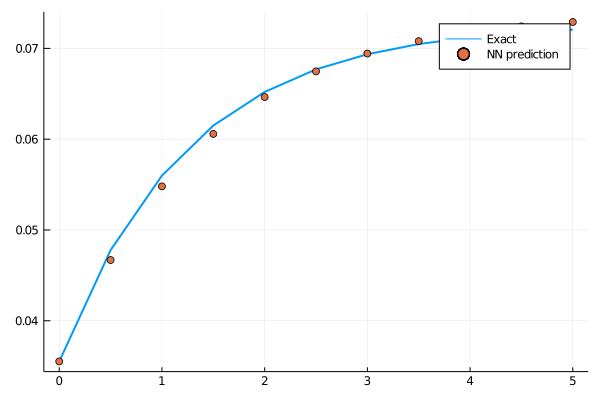

loss: 4.37e-05:  87%|███████████████████████████████████▊     |  ETA: 0:00:06

4.2539723f-5

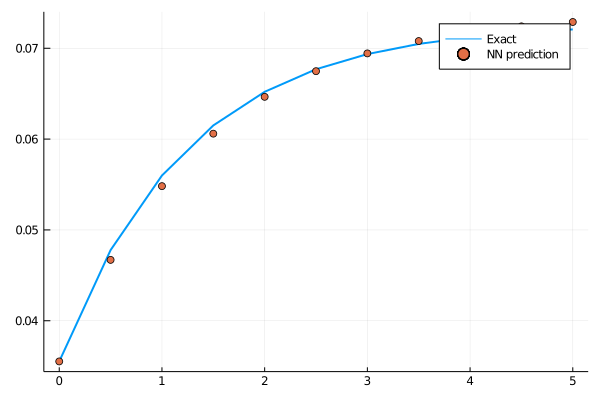

loss: 4.25e-05:  88%|███████████████████████████████████▉     |  ETA: 0:00:06

4.1391093f-5

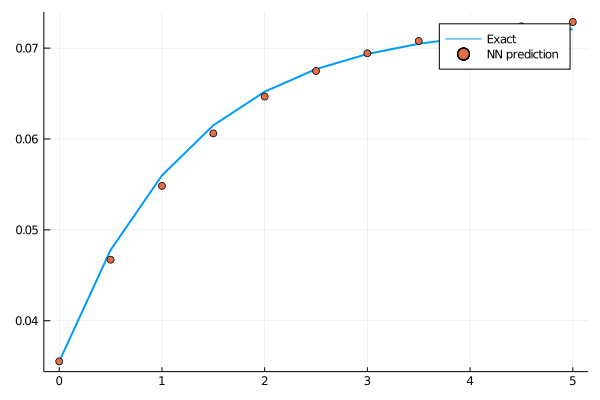

loss: 4.14e-05:  88%|████████████████████████████████████▏    |  ETA: 0:00:06

4.0273837f-5

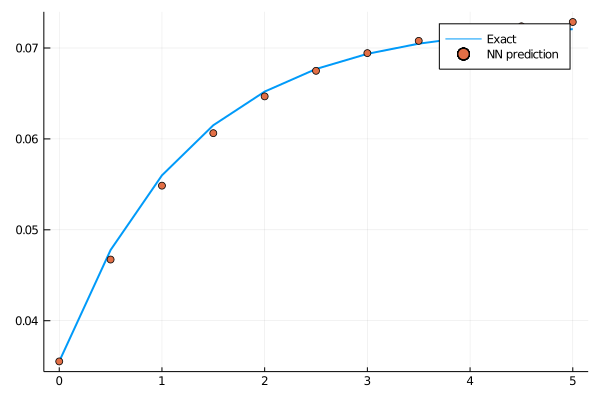

loss: 4.03e-05:  88%|████████████████████████████████████▎    |  ETA: 0:00:06

3.9187333f-5

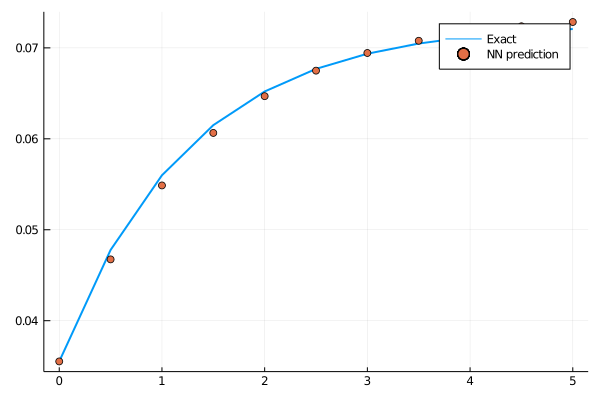

loss: 3.92e-05:  89%|████████████████████████████████████▍    |  ETA: 0:00:06

3.81306f-5

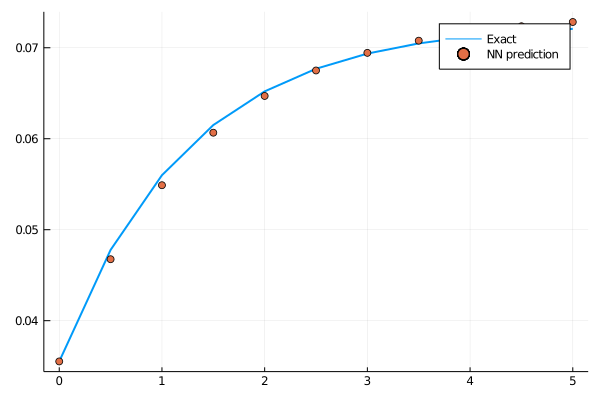

loss: 3.81e-05:  89%|████████████████████████████████████▌    |  ETA: 0:00:06

3.710307f-5

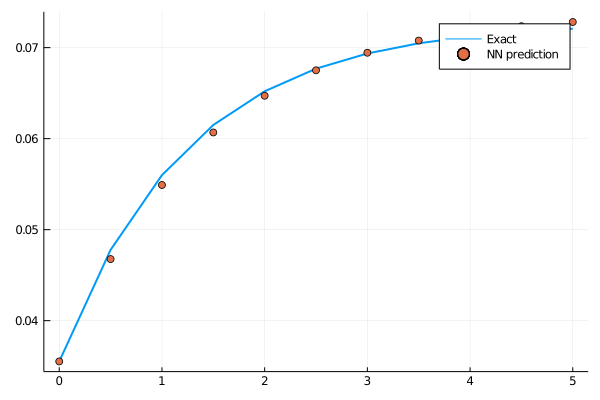

loss: 3.71e-05:  89%|████████████████████████████████████▋    |  ETA: 0:00:05

3.6103866f-5

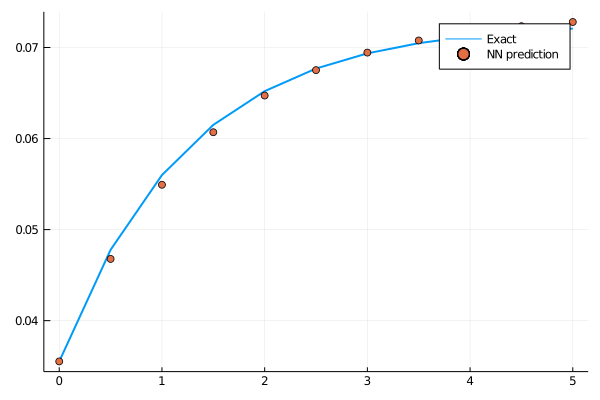

loss: 3.61e-05:  90%|████████████████████████████████████▊    |  ETA: 0:00:05

3.513227f-5

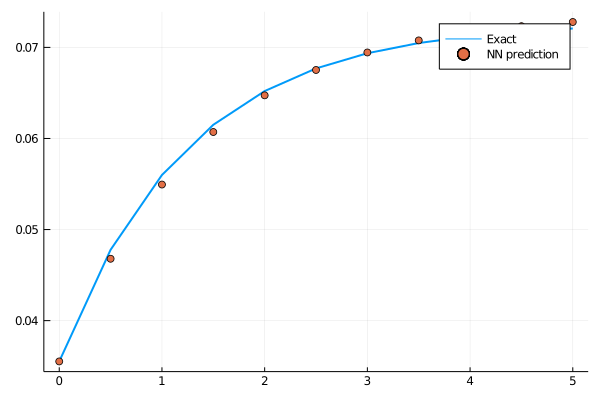

loss: 3.51e-05:  90%|████████████████████████████████████▉    |  ETA: 0:00:05

3.4187513f-5

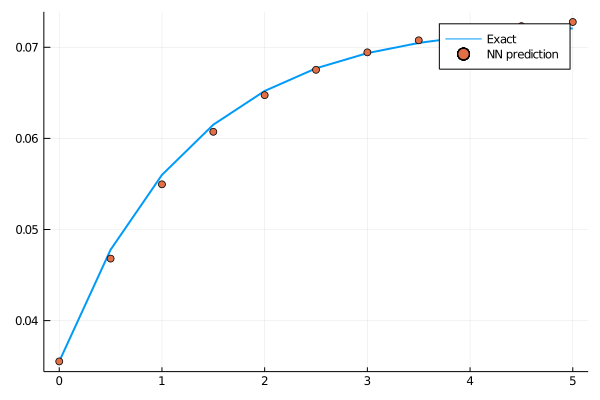

loss: 3.42e-05:  90%|█████████████████████████████████████    |  ETA: 0:00:05

3.326907f-5

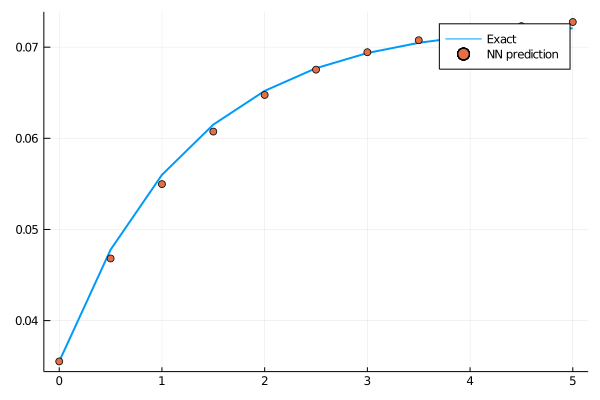

loss: 3.33e-05:  91%|█████████████████████████████████████▏   |  ETA: 0:00:05

3.2376087f-5

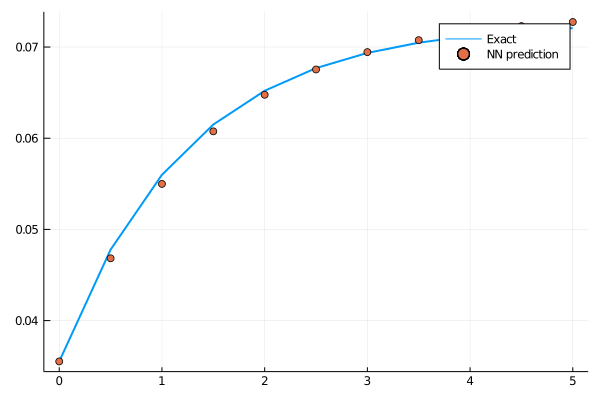

loss: 3.24e-05:  91%|█████████████████████████████████████▎   |  ETA: 0:00:05

3.1507894f-5

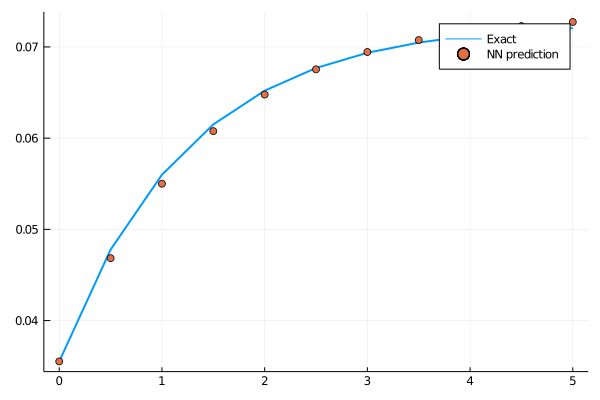

loss: 3.15e-05:  91%|█████████████████████████████████████▍   |  ETA: 0:00:04

3.0664076f-5

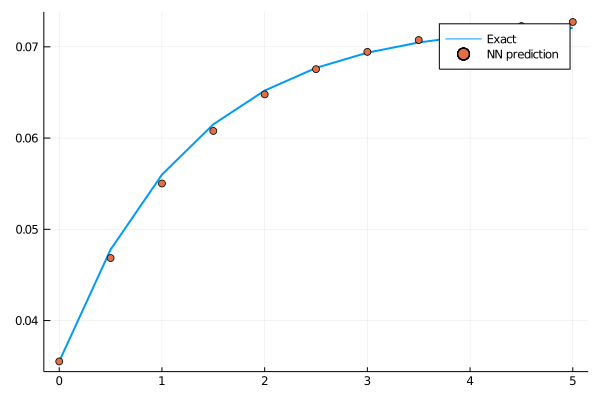

loss: 3.07e-05:  92%|█████████████████████████████████████▌   |  ETA: 0:00:04

2.9843788f-5

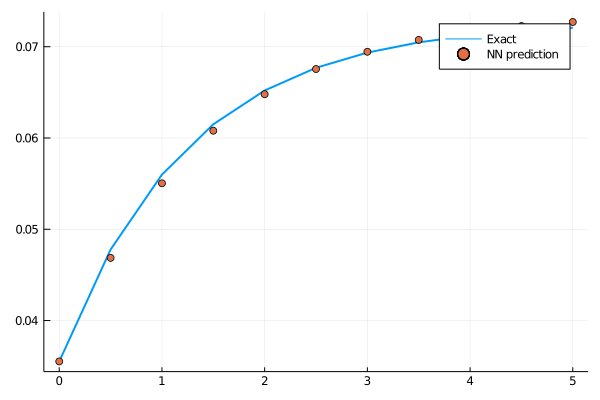

loss: 2.98e-05:  92%|█████████████████████████████████████▊   |  ETA: 0:00:04

2.9046318f-5

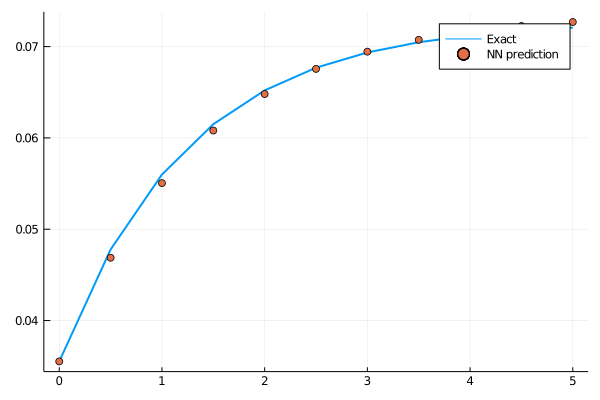

loss: 2.9e-05:  92%|█████████████████████████████████████▉   |  ETA: 0:00:04

2.8271377f-5

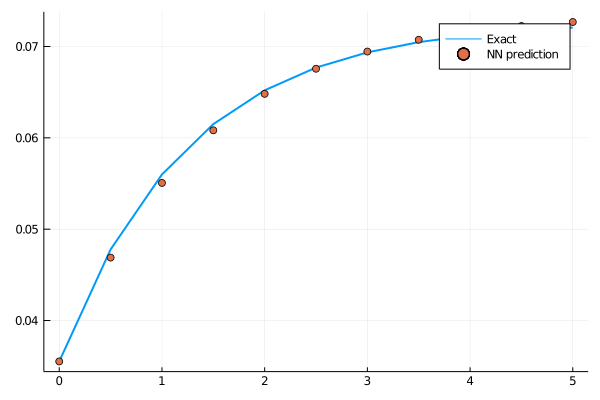

loss: 2.83e-05:  93%|██████████████████████████████████████   |  ETA: 0:00:04

2.7518096f-5

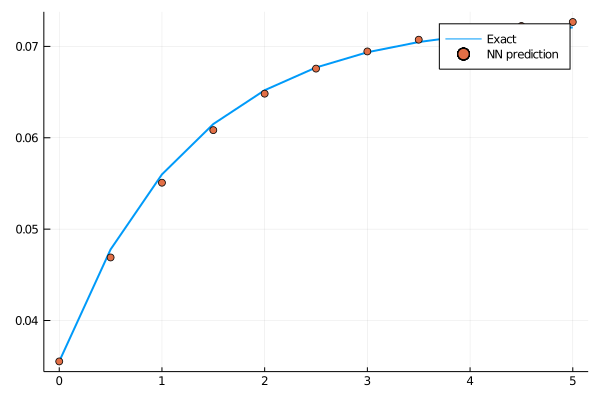

loss: 2.75e-05:  93%|██████████████████████████████████████▏  |  ETA: 0:00:04

2.678594f-5

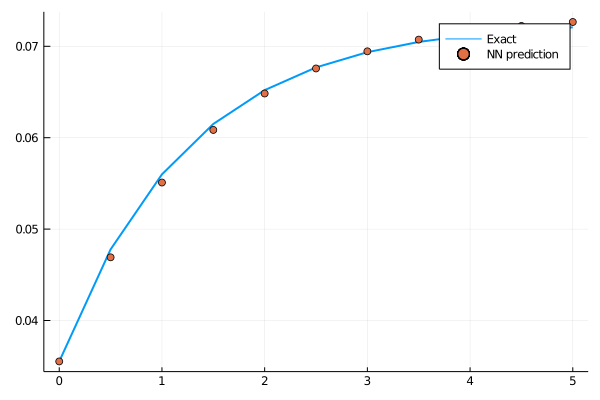

loss: 2.68e-05:  93%|██████████████████████████████████████▎  |  ETA: 0:00:03

2.6074604f-5

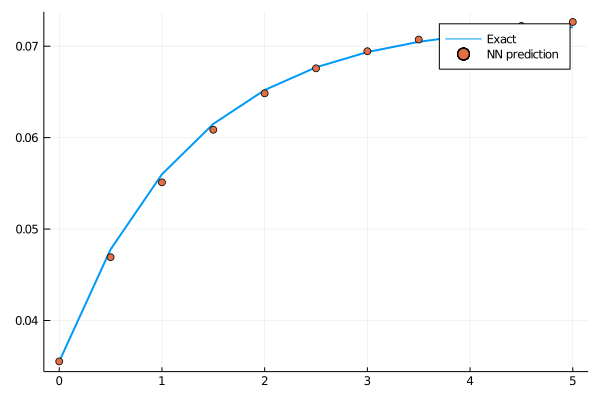

loss: 2.61e-05:  94%|██████████████████████████████████████▍  |  ETA: 0:00:03

2.5383271f-5

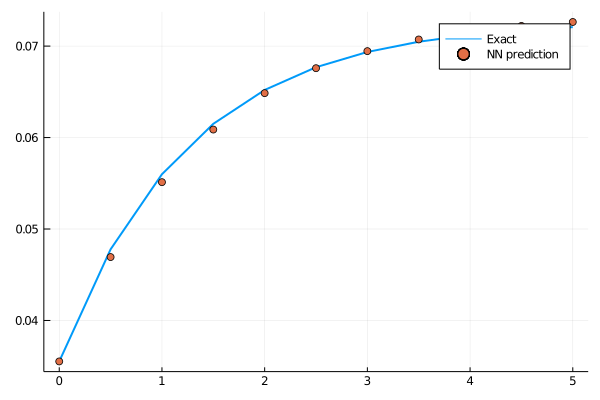

loss: 2.54e-05:  94%|██████████████████████████████████████▌  |  ETA: 0:00:03

2.4711473f-5

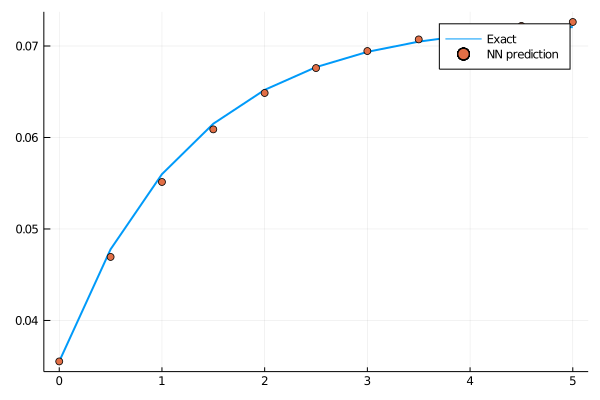

loss: 2.47e-05:  94%|██████████████████████████████████████▋  |  ETA: 0:00:03

2.4058687f-5

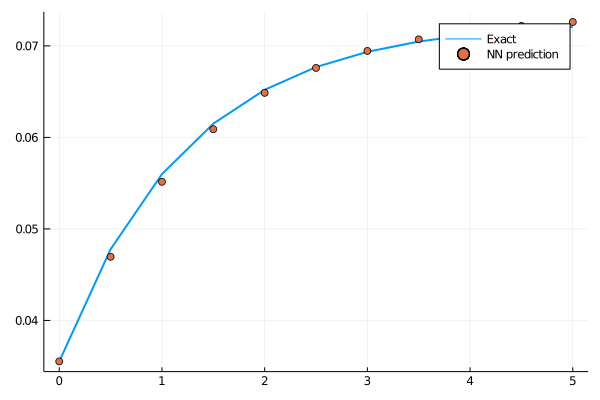

loss: 2.41e-05:  95%|██████████████████████████████████████▊  |  ETA: 0:00:03

2.3424445f-5

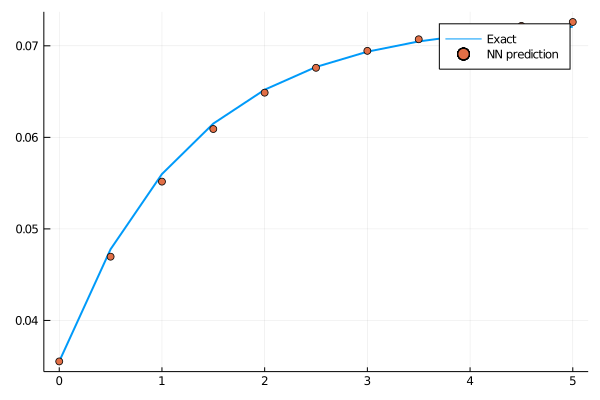

loss: 2.34e-05:  95%|███████████████████████████████████████  |  ETA: 0:00:03

2.2808317f-5

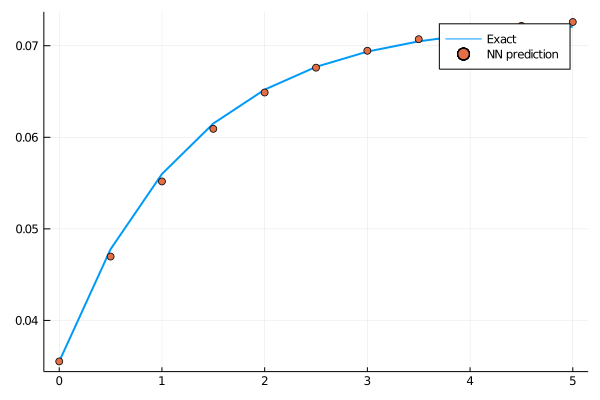

loss: 2.28e-05:  95%|███████████████████████████████████████▏ |  ETA: 0:00:02

2.2209631f-5

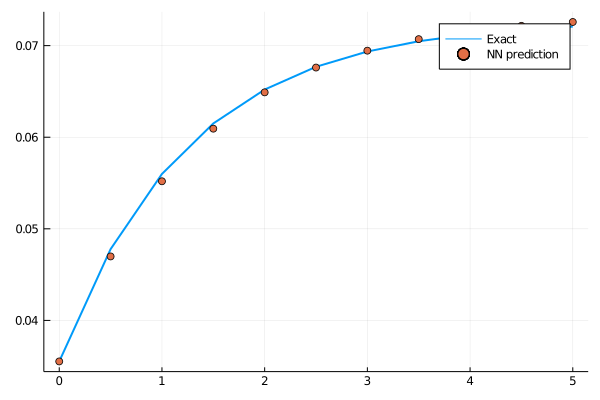

loss: 2.22e-05:  96%|███████████████████████████████████████▎ |  ETA: 0:00:02

2.1628091f-5

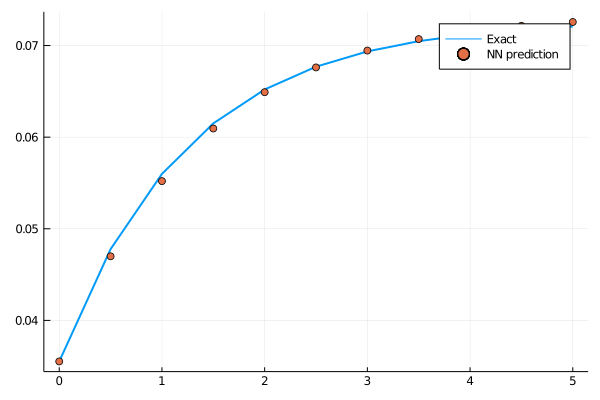

loss: 2.16e-05:  96%|███████████████████████████████████████▍ |  ETA: 0:00:02

2.1063179f-5

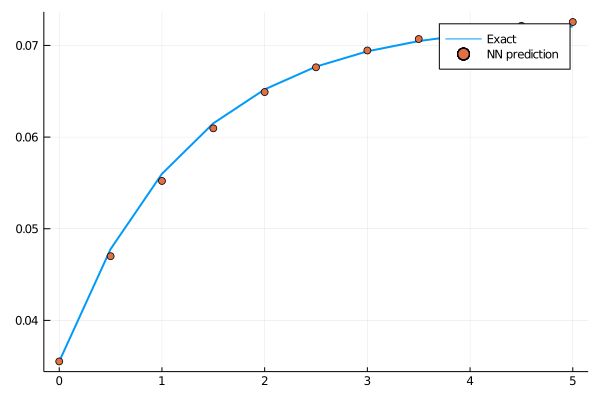

loss: 2.11e-05:  96%|███████████████████████████████████████▌ |  ETA: 0:00:02

2.0514442f-5

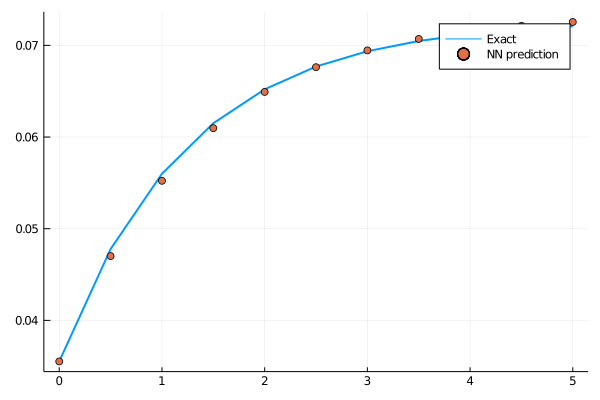

loss: 2.05e-05:  97%|███████████████████████████████████████▋ |  ETA: 0:00:02

1.9981275f-5

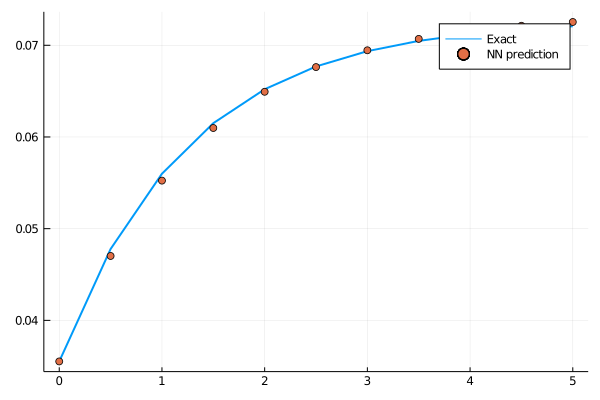

loss: 2e-05:  97%|███████████████████████████████████████▊ |  ETA: 0:00:02

1.9463672f-5

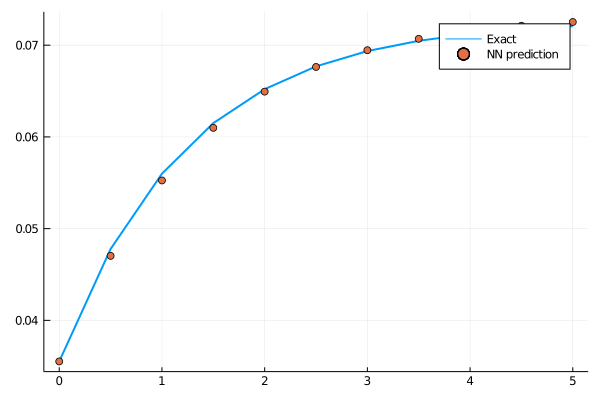

loss: 1.95e-05:  97%|███████████████████████████████████████▉ |  ETA: 0:00:01

1.8960684f-5

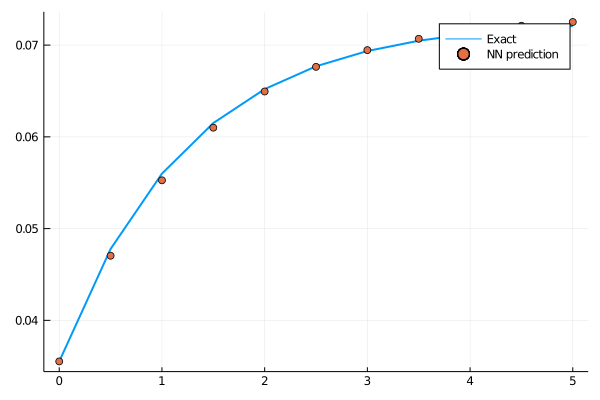

loss: 1.9e-05:  98%|████████████████████████████████████████ |  ETA: 0:00:01

1.847241f-5

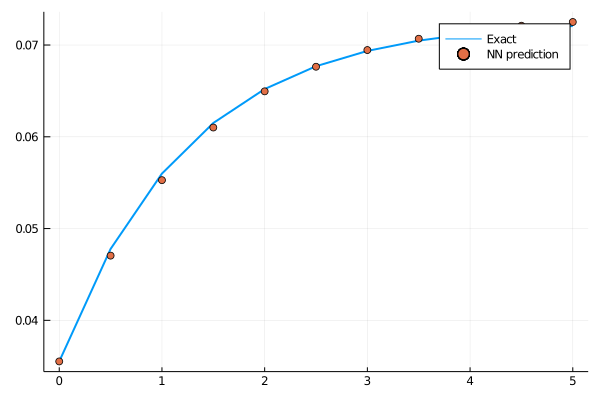

loss: 1.85e-05:  98%|████████████████████████████████████████▏|  ETA: 0:00:01

1.7998262f-5

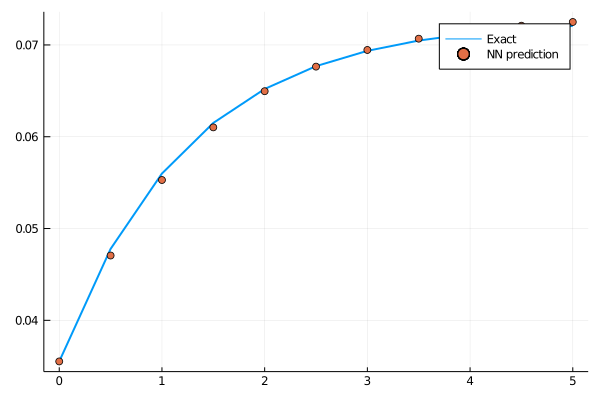

loss: 1.8e-05:  98%|████████████████████████████████████████▎|  ETA: 0:00:01

1.7537524f-5

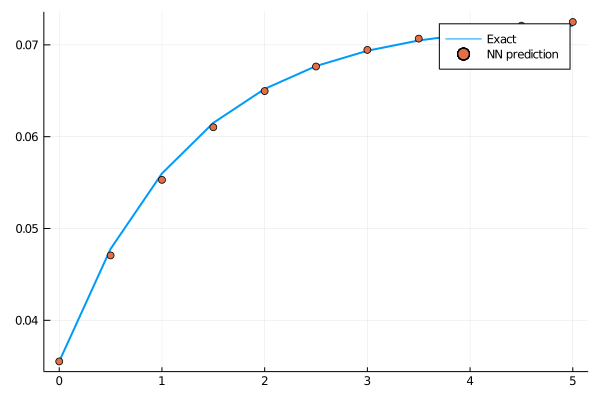

loss: 1.75e-05:  99%|████████████████████████████████████████▍|  ETA: 0:00:01

1.7090377f-5

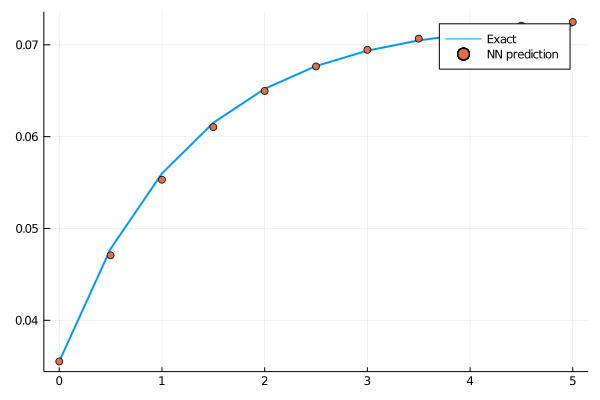

loss: 1.71e-05:  99%|████████████████████████████████████████▋|  ETA: 0:00:01

1.6656215f-5

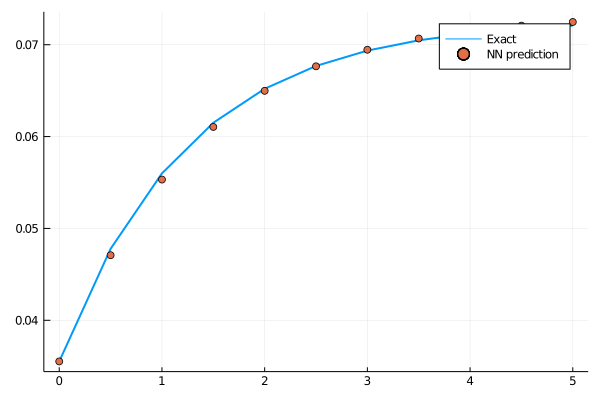

loss: 1.67e-05:  99%|████████████████████████████████████████▊|  ETA: 0:00:00

1.6234571f-5

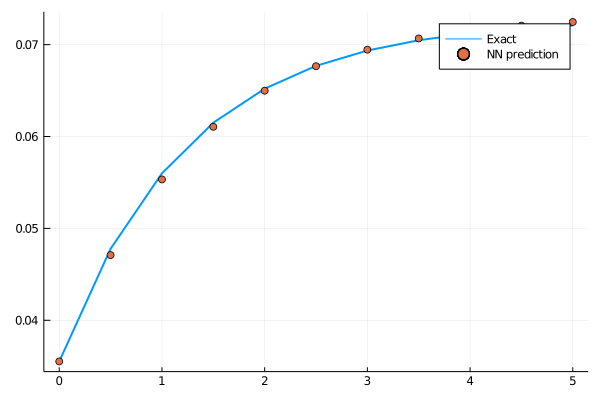

loss: 1.62e-05: 100%|████████████████████████████████████████▉|  ETA: 0:00:00

1.5825337f-5

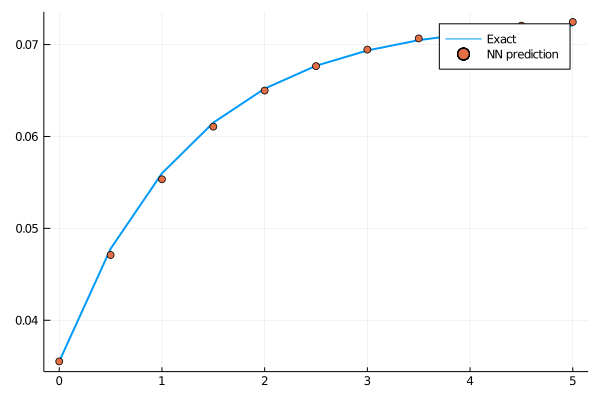

loss: 1.58e-05: 100%|█████████████████████████████████████████| Time: 0:00:50


1.5825337f-5

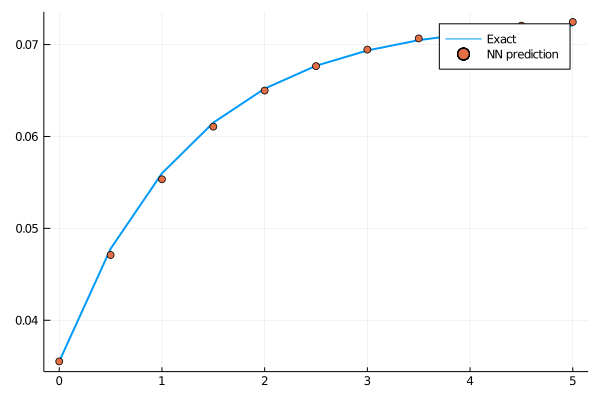

 * Status: success

 * Candidate solution
    Final objective value:     1.582534e-05

 * Found with
    Algorithm:     ADAM

 * Convergence measures
    |x - x'|               = NaN ≰ 0.0e+00
    |x - x'|/|x'|          = NaN ≰ 0.0e+00
    |f(x) - f(x')|         = NaN ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = NaN ≰ 0.0e+00
    |g(x)|                 = NaN ≰ 0.0e+00

 * Work counters
    Seconds run:   102  (vs limit Inf)
    Iterations:    300
    f(x) calls:    300
    ∇f(x) calls:   300


In [12]:
res = DiffEqFlux.sciml_train(loss_n_ode, n_ode.p, ADAM(), cb=cb, maxiters=300)

Improve the training results with BFGS optimizer

In [ ]:
res = DiffEqFlux.sciml_train(loss_n_ode, res.minimizer, LBFGS(), cb=cb, maxiters=200)

PDF at final instant

In [ ]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,1], lw=2, label="Initial")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,end], lw=2, label="FSM")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(f0_1D, res.minimizer).u[end], lw=2, label="NN")

Trajectories of PDF

In [ ]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,:], lw=2, label="Dataset")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(f0_1D, res.minimizer).u[:], lw=2, label="NN")

From different given initial value, e.g. Maxwellian

In [ ]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(M0_1D, res.minimizer).u[:], lw=2)

In [ ]:
using BenchmarkTools

In [ ]:
@benchmark n_ode(M0_1D, res.minimizer)

In [ ]:
@benchmark solve(prob, Tsit5(), saveat=tRange) |> Array